In [1]:
#!/usr/bin/env python3.6
# -*- coding: utf-8 -*-

In [2]:
# Imports
import sys
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [3]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [4]:
%matplotlib inline

# Data

In [5]:
velocity = 0.2

In [7]:
# Read data
motion = np.genfromtxt('../dataset3/motion.csv', delimiter=',', dtype=np.float64)
print("Motion data has a length of ", len(motion))

Motion data has a length of  399917


In [8]:
# Find idx of motion correspondant to 0.1
idx_motion_02 = []
for idx, row in enumerate(motion):
    if any(abs(item) == velocity for item in row[1:7]):
        idx_motion_02.append(idx)
        
motion_02 = motion[idx_motion_02]

In [9]:
motion_02.shape

(129918, 40)

## Visualizations

In [10]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FL)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FL)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FR)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FR)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RL)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RL)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RR)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RR)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FL plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FL)')
    ax1.set_xlabel('Time')
         
    # FL plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FL)', color='g')
          
    # FR plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FR)')
    ax3.set_xlabel('Time')
         
    # FR plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FR)', color='g')      
          
    # RL plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RL)')
    ax5.set_xlabel('Time')
         
    # RL plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RL)', color='g')   
          
    # RR plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RR)')
    ax7.set_xlabel('Time')
         
    # RR plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RR)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
                    #ax.axvline(x=footstep_timestamp+0.2, color='b', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [11]:
def get_specific_cmd(dataset, fwd, side, rot):
    idxs = []
    for row_id, item in enumerate(motion_02):
        if np.isclose(item[1], fwd, 0.01) and np.isclose(item[2], side, 0.01) and np.isclose(item[6], rot, 0.01):
            idxs.append(row_id)
    
    return idxs

In [12]:
def get_swinging_motions(dataset, height=-0.1):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 9] < height)[0]
    fl_min_height = np.where(dataset[:, 12] < height)[0]
    rr_min_height = np.where(dataset[:, 15] < height)[0]
    rl_min_height = np.where(dataset[:, 18] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## Motion_02

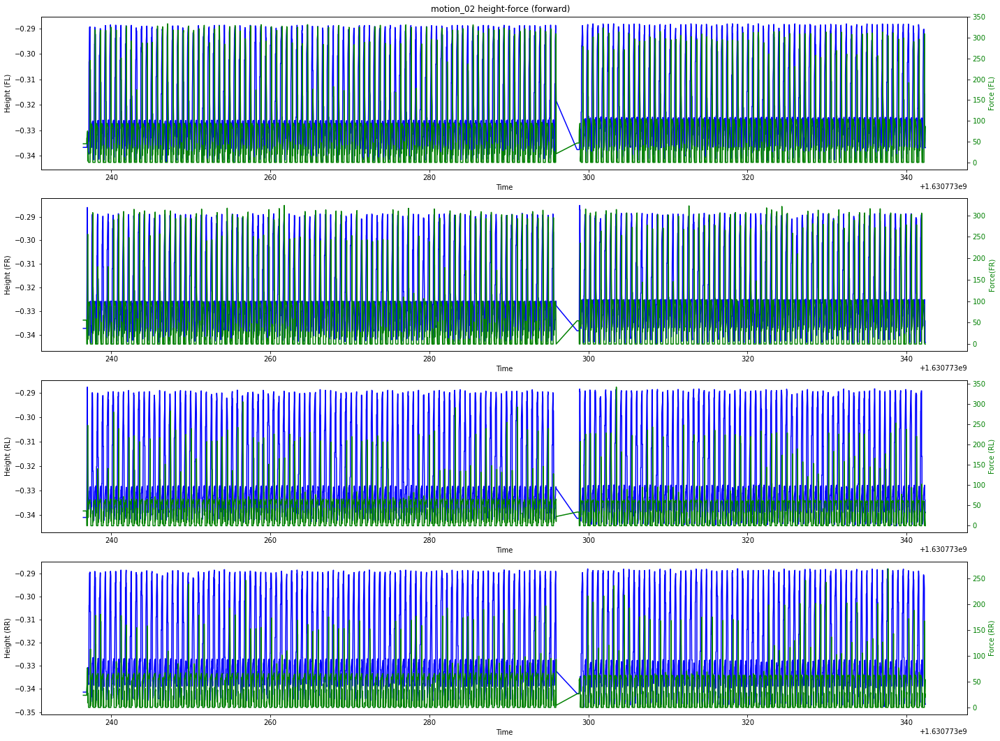

In [33]:
# Forward
fwd_cmds = get_specific_cmd(motion_02, velocity, 0, 0)
motion_02_fwd = motion_02[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_02_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_02 height-force (forward)",
                      motion_02,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

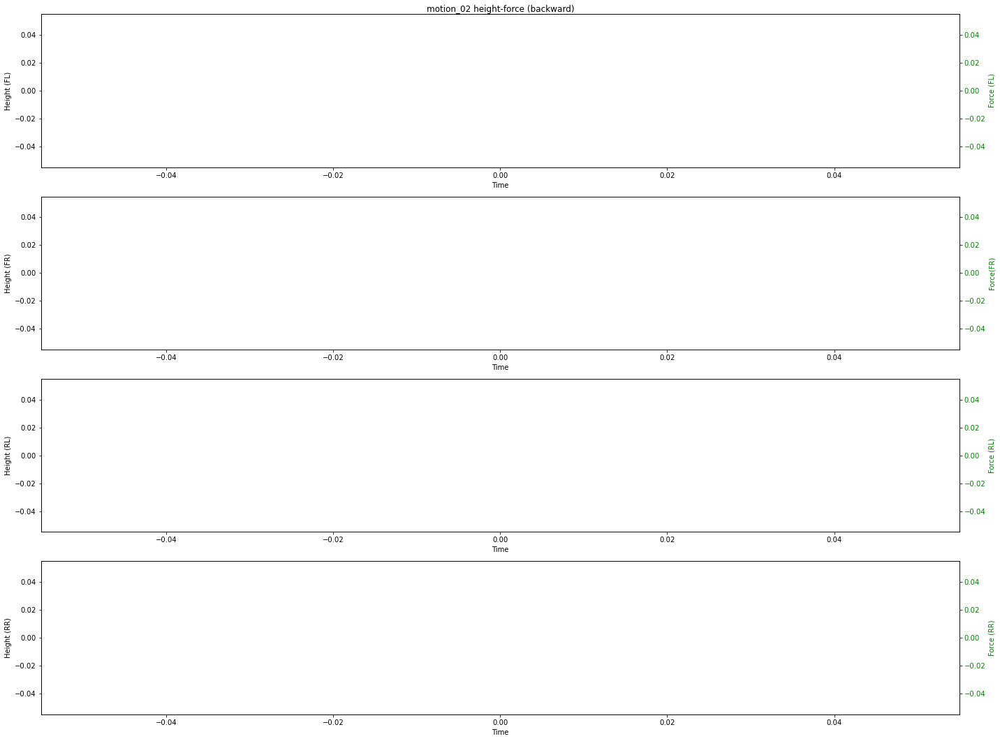

In [34]:
# Backwards
bwd_cmds = get_specific_cmd(motion_02, -velocity, 0, 0)
motion_02_bwd = motion_02[bwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_02_bwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_02 height-force (backward)",
                      motion_02,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

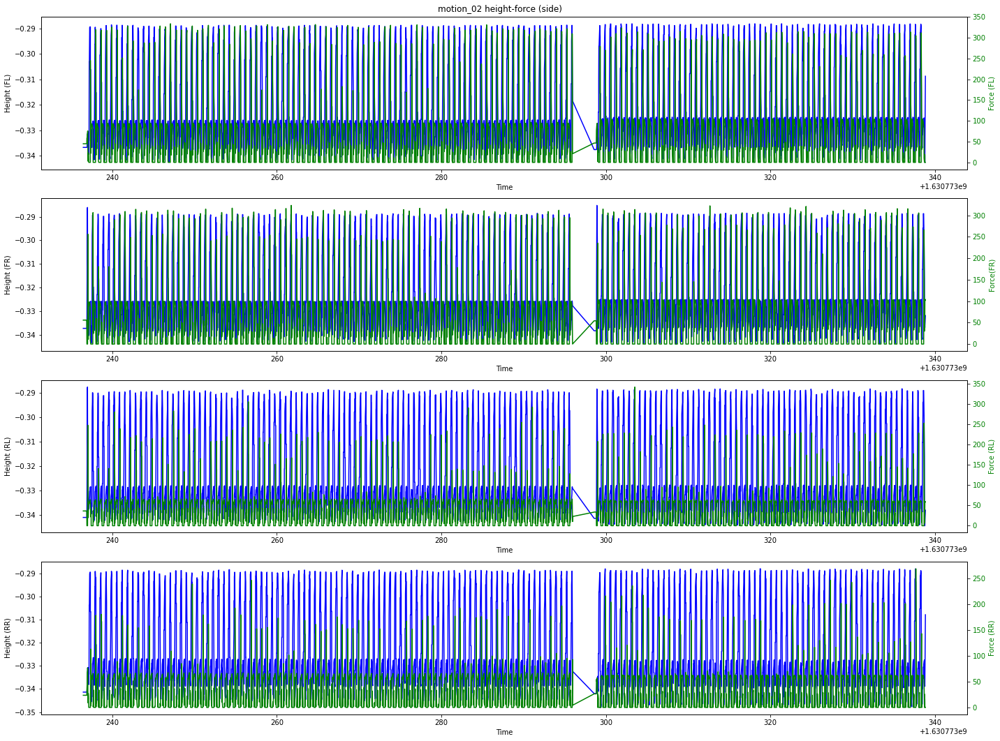

In [35]:
# Side (right)
side_cmds = get_specific_cmd(motion_02, 0, velocity, 0)
motion_02_side = motion_02[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_02_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_02 height-force (side)",
                      motion_02,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

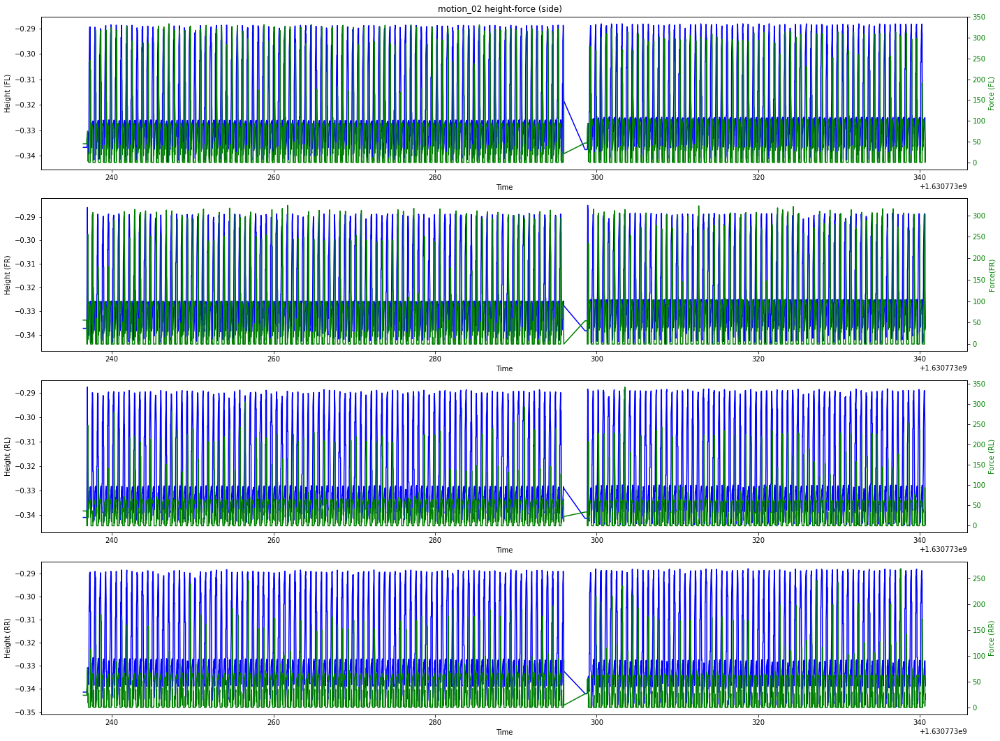

In [36]:
# Side (left)
side_cmds = get_specific_cmd(motion_02, 0, -velocity, 0)
motion_02_side = motion_02[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_02_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_02 height-force (side)",
                      motion_02,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

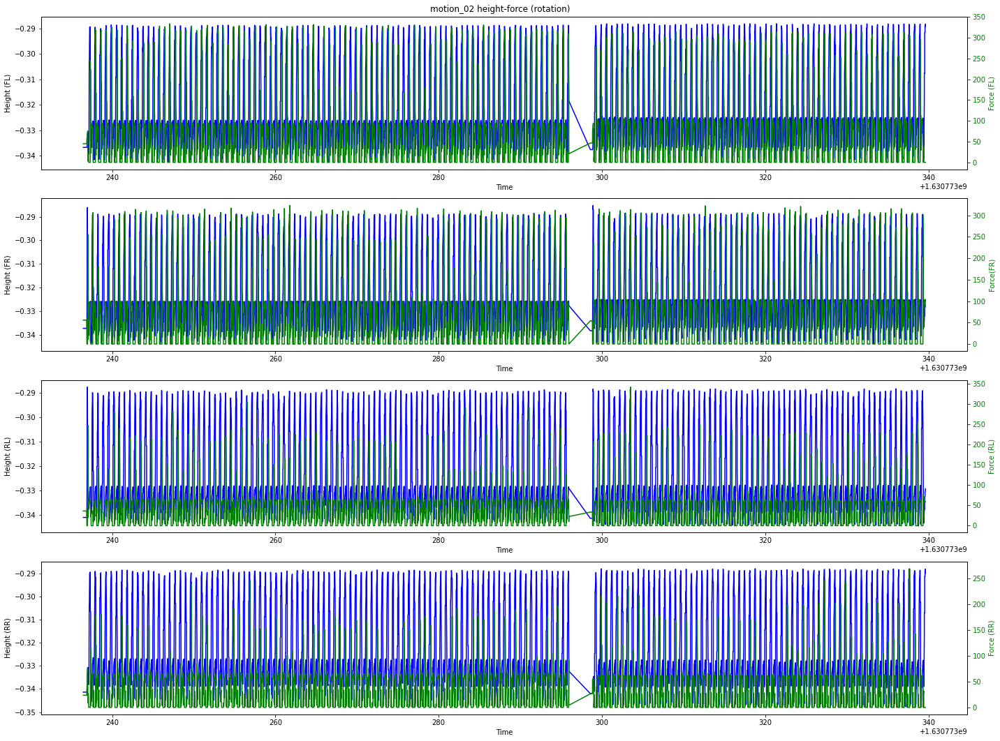

In [37]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion_02, 0, 0, velocity)
motion_02_rot = motion_02[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_02_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_02 height-force (rotation)",
                      motion_02,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

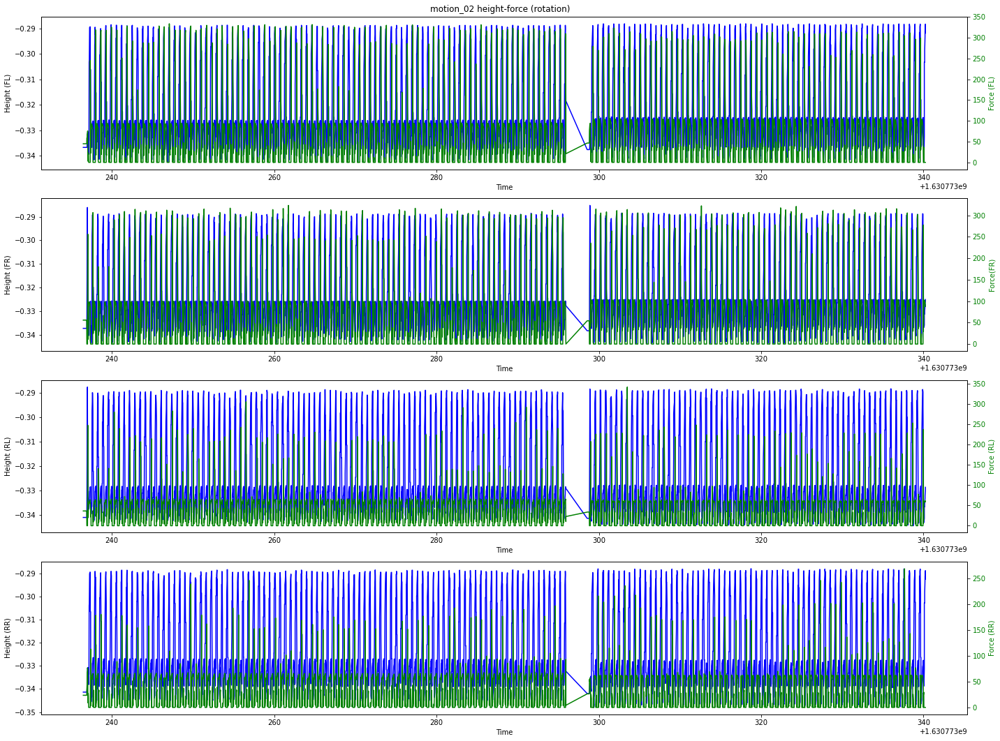

In [38]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion_02, 0, 0, -velocity)
motion_02_rot = motion_02[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_02_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_02 height-force (rotation)",
                      motion_02,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

## Footsteps Extraction (Height + Force)

In [133]:
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(abs(dataset[:, 9] - dataset[:, 12]), 9)
    print("Max diff between fr and fl: ", max(fr_fl_diff))

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(abs(dataset[:, 15] - dataset[:, 18]), 9)
    print("Max diff between rr and rl: ", max(rr_rl_diff))

    # Compute compound difference for all foots
    height_diff = np.round(fr_fl_diff + rr_rl_diff, 9)
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    footsteps_height = np.where(height_diff < height_threshold)[0]
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Find footsteps based on force perceived
    rear_force_footsteps = np.where(np.logical_or(dataset[:, 21] <= force_thresholds[0], dataset[:, 24] <= force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_or(dataset[:, 27] <= force_thresholds[2], dataset[:, 30] <= force_thresholds[3]))[0]
    
     # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    return force_height_footsteps

"""
def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    footsteps_sort, timestamps_sort = zip(*sorted(zip(footsteps, dataset[footsteps, 0])))

    for idx, footstep_sort in enumerate(footsteps_sort):
        if idx > 0:
            if abs(dataset[footstep_sort, 0] - dataset[footsteps_sort[idx-1], 0]) < 0.15:
                continue
            else:
                footsteps_nms.append(footstep_sort)
        else:
            footsteps_nms.append(footstep_sort)

    return np.asarray(footsteps_nms)
"""

def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    prev_similar = False
    footstep_to_add = footsteps[0]
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            if abs(dataset[footstep, 0] - dataset[footsteps[idx+1], 0]) < 0.1:
                # Compute compound difference for all foots
                height_diff_idx = abs(dataset[footstep, 9] - dataset[footstep, 12]) + abs(dataset[footstep, 15] - dataset[footstep, 18])
                height_diff_idx_next = abs(dataset[footsteps[idx+1], 9] - dataset[footsteps[idx+1], 12]) + abs(dataset[footsteps[idx+1], 15] - dataset[footsteps[idx+1], 18])
                
                # Choose foot with lowest height difference
                footstep_to_add = footstep if height_diff_idx < height_diff_idx_next else footsteps[idx+1]
            else:
                footsteps_nms.append(footstep_to_add)
                
                # Account for next entry
                footstep_to_add = footsteps[idx+1]
            
            #print(abs(dataset[footstep, 0] - dataset[footsteps[idx+1], 0]))

    return np.asarray(footsteps_nms)

## Footsteps

In [134]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_02_cmds = motion_02[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_02_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_02_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_02_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]

    plot_overlapping_data("Footsteps",
                          motion_02_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height, 
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [9, 21, 12, 24, 15, 27, 18, 30],
                           True,
                           motion_02_cmds[footsteps_nms(motion_02_cmds, footsteps), 0])
    
    return motion_02_cmds, footsteps_after_nms

### Forward motion

In [135]:
for x in range(20):
    print(motion_02_fwd[footsteps_02_fwd[x+1], 0] - motion_02_fwd[footsteps_02_fwd[x], 0])

0.259979248046875
0.36663365364074707
0.259829044342041
0.34049272537231445
0.31296610832214355
0.3708024024963379
0.2999420166015625
0.3090062141418457
0.34041666984558105
0.33080267906188965
0.30933046340942383
0.33967113494873047
0.33895206451416016
0.30117106437683105
0.3387751579284668
0.3014101982116699
0.34250497817993164
0.3004148006439209
0.3479807376861572
0.3490896224975586


Foot swinging motions lenghts:  5164 5164 5164 5164
Max diff between fr and fl:  0.048740983
Max diff between rr and rl:  0.051083535
Min and max diff between front and rear feet 0.000158489 0.099823833 

Amount of footsteps found with height criteria:  2455 

Number of force footsteps:  3955 

Number of height-force footsteps:  1573 

Footsteps extracted:  1573
Footsteps after non-maximum-suppression:  312


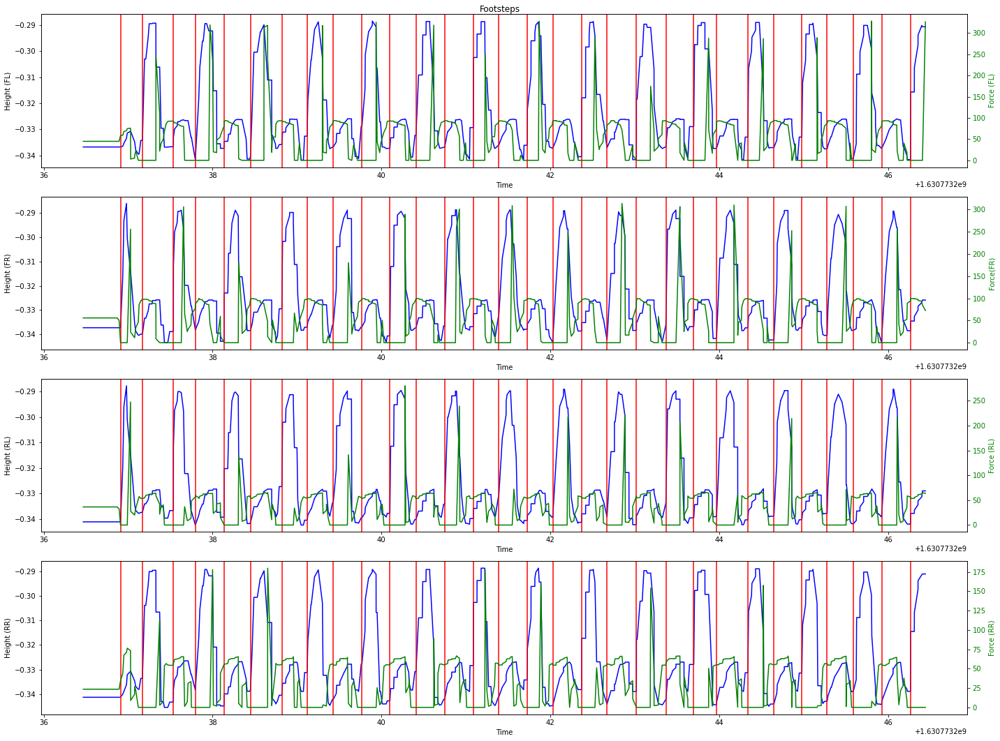

In [137]:
motion_02_fwd, footsteps_02_fwd = footstep_extraction_and_plotting(dataset=motion_02, velocities=[velocity, 0, 0], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 500))

### Backward motion

In [138]:
motion_02_bwd, footsteps_02_bwd = footstep_extraction_and_plotting(dataset=motion_02, velocities=[-velocity, 0, 0], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 1000))

Foot swinging motions lenghts:  0 0 0 0


ValueError: max() arg is an empty sequence

### Side motion (right)

Foot swinging motions lenghts:  4989 4989 4989 4989
Max diff between fr and fl:  0.05012998
Max diff between rr and rl:  0.04951176
Min and max diff between front and rear feet 1.7852e-05 0.099323541 

Amount of footsteps found with height criteria:  2110 

Number of force footsteps:  3805 

Number of height-force footsteps:  1239 

Footsteps extracted:  1239
Footsteps after non-maximum-suppression:  288


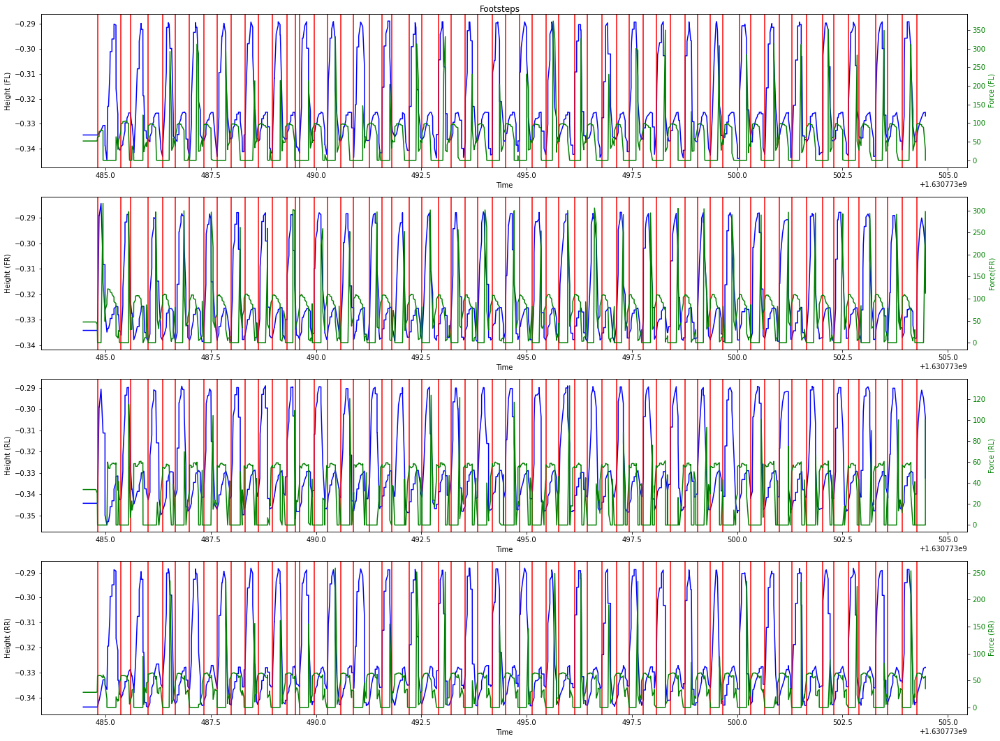

In [139]:
motion_02_side_right, footsteps_02_side_right = footstep_extraction_and_plotting(dataset=motion_02, velocities=[0, velocity, 0], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 1000))

### Side (left)

Foot swinging motions lenghts:  5082 5082 5082 5082
Max diff between fr and fl:  0.04732731
Max diff between rr and rl:  0.052587211
Min and max diff between front and rear feet 2.3812e-05 0.099621952 

Amount of footsteps found with height criteria:  2103 

Number of force footsteps:  3837 

Number of height-force footsteps:  1187 

Footsteps extracted:  1187
Footsteps after non-maximum-suppression:  288


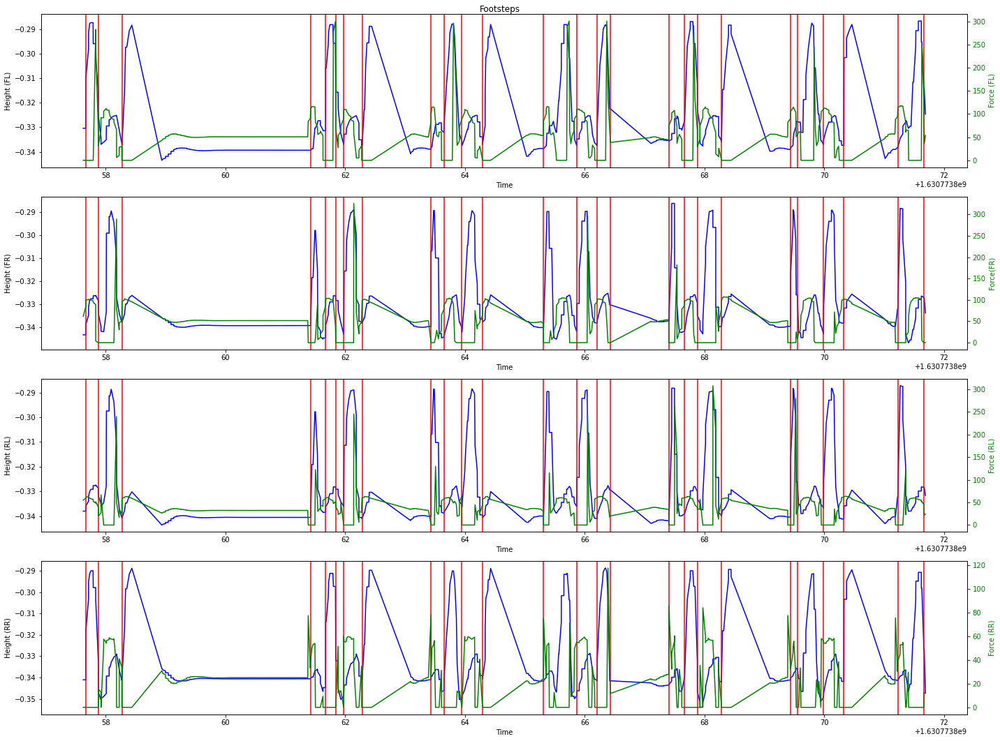

In [141]:
motion_02_side_left, footsteps_02_side_left = footstep_extraction_and_plotting(dataset=motion_02, velocities=[0, -velocity, 0],  height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(3000, 3500))

### Rotation (clockwise)

Foot swinging motions lenghts:  2975 2975 2975 2975
Max diff between fr and fl:  0.044299662
Max diff between rr and rl:  0.045436203
Min and max diff between front and rear feet 0.00037992 0.089735865 

Amount of footsteps found with height criteria:  1253 

Number of force footsteps:  2534 

Number of height-force footsteps:  980 

Footsteps extracted:  980
Footsteps after non-maximum-suppression:  182


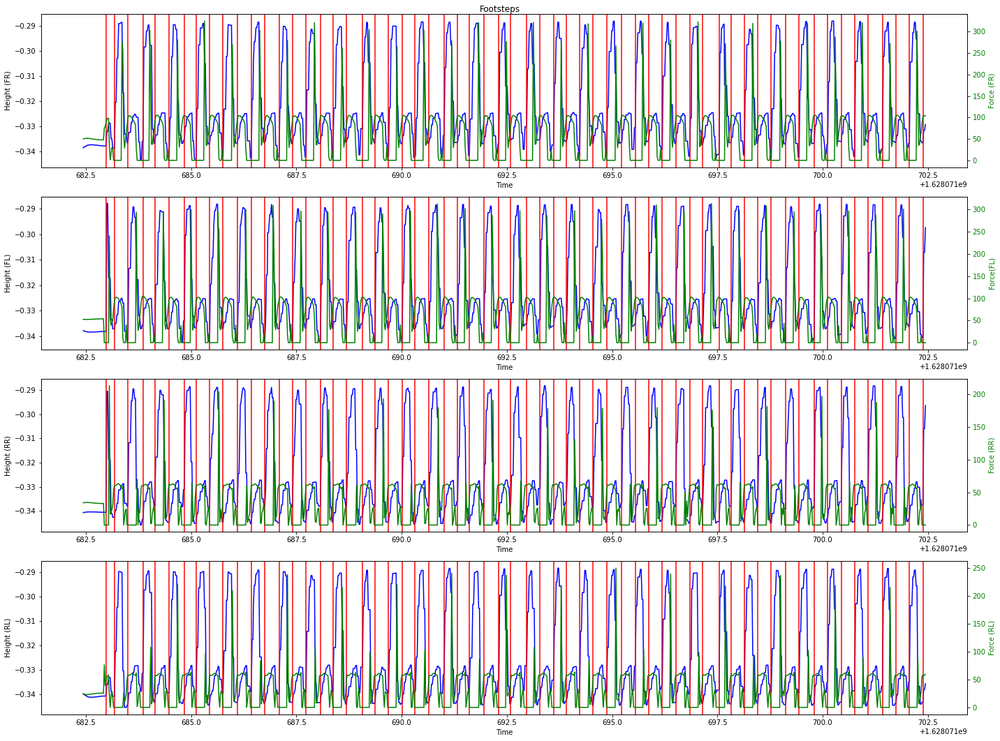

In [24]:
motion_02_clock, footsteps_02_clock = footstep_extraction_and_plotting(dataset=motion_02, velocities=[0, 0, velocity], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 1000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  2977 2977 2977 2977
Max diff between fr and fl:  0.045978308
Max diff between rr and rl:  0.047423363
Min and max diff between front and rear feet 0.001169831 0.093401671 

Amount of footsteps found with height criteria:  1243 

Number of force footsteps:  2541 

Number of height-force footsteps:  981 

Footsteps extracted:  981
Footsteps after non-maximum-suppression:  182


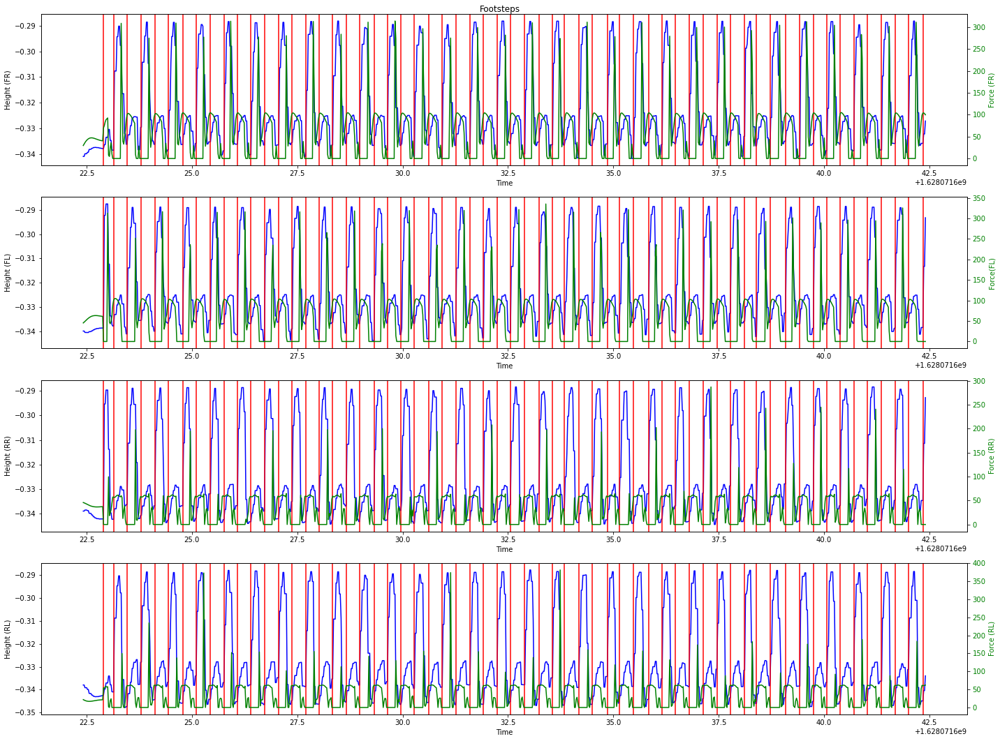

In [25]:
motion_02_count, footsteps_02_count = footstep_extraction_and_plotting(dataset=motion_02, velocities=[0, 0, -velocity], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 1000))

### Step size

In [26]:
def get_step_size(dataset, footsteps, idx_coord=[7,10,13,16]):
    # Footsteps sizes
    step_size_fr = []
    step_size_fl = []
    step_size_rr = []
    step_size_rl = []
    footstep_period = []
    
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]

            if time_diff < 1.5:
                footstep_period.append(time_diff)
                step_size_fl.append(dataset[footsteps[idx], idx_coord[0]] - dataset[footsteps[idx-1], idx_coord[0]])
                step_size_fr.append(dataset[footsteps[idx], idx_coord[1]] - dataset[footsteps[idx-1], idx_coord[1]])
                step_size_rl.append(dataset[footsteps[idx], idx_coord[2]] - dataset[footsteps[idx-1], idx_coord[2]])
                step_size_rr.append(dataset[footsteps[idx], idx_coord[3]] - dataset[footsteps[idx-1], idx_coord[3]])
    
    # Convert to numpy array
    step_size_fl_numpy = np.array(step_size_fl)
    step_size_fr_numpy = np.array(step_size_fr)
    step_size_rl_numpy = np.array(step_size_rl)
    step_size_rr_numpy = np.array(step_size_rr)
    footstep_period_numpy = np.array(footstep_period)
    
    # Only keep positive footsteps
    step_size_fl_numpy = step_size_fl_numpy[np.where(step_size_fl_numpy > 0)[0]]
    step_size_fr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rl_numpy = step_size_rl_numpy[np.where(step_size_rl_numpy > 0)[0]]
    step_size_rr_numpy = step_size_rr_numpy[np.where(step_size_rr_numpy > 0)[0]]
        
    # Print average step-size
    print("Avg. step size time: ", np.mean(footstep_period_numpy))
    print("Avg. step size for FL foot: ", np.mean(step_size_fl_numpy))
    print("Avg. step size for FR foot: ", np.mean(step_size_fr_numpy))
    print("Avg. step size for RL foot: ", np.mean(step_size_rl_numpy))
    print("Avg. step size for RR foot: ", np.mean(step_size_rr_numpy), '\n')

    # Print std. dev. step-size
    print("Std. dev. step size for FL foot: ", np.std(step_size_fl_numpy))
    print("Std. dev. step size for FR foot: ", np.std(step_size_fr_numpy))
    print("Std. dev. step size for RL foot: ", np.std(step_size_rl_numpy))
    print("Std. dev. step size for RR foot: ", np.std(step_size_rr_numpy), '\n')
    
    return step_size_fr_numpy, step_size_fl_numpy, step_size_rr_numpy, step_size_rl_numpy

#### Forward motion

In [27]:
# Step size and velocity along x axis 
step_size_fr_x_fwd,_,_,_ = get_step_size(motion_02_fwd, footsteps_02_fwd)

Avg. step size time:  0.32549999952316283
Avg. step size for FL foot:  0.06453998602102222
Avg. step size for FR foot:  0.05830660992201111
Avg. step size for RL foot:  0.060860740145100005
Avg. step size for RR foot:  0.05841305421451111 

Std. dev. step size for FL foot:  0.005222130429257901
Std. dev. step size for FR foot:  0.008159491558716956
Std. dev. step size for RL foot:  0.008086400133570863
Std. dev. step size for RR foot:  0.006311056811076903 



In [28]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_02_fwd, footsteps_02_fwd, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.32549999952316283
Avg. step size for FL foot:  0.0060327731900777755
Avg. step size for FR foot:  0.0018517047852068976
Avg. step size for RL foot:  0.0014388911764204536
Avg. step size for RR foot:  0.000749998355430108 

Std. dev. step size for FL foot:  0.001174093576388993
Std. dev. step size for FR foot:  0.0010879619836825134
Std. dev. step size for RL foot:  0.0009146511910488507
Std. dev. step size for RR foot:  0.00045136005678312913 



### Backward motion

In [29]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_02_bwd, footsteps_02_bwd)

Avg. step size time:  0.3257222228580051
Avg. step size for FL foot:  0.07556883063578888
Avg. step size for FR foot:  0.06467631012199998
Avg. step size for RL foot:  0.07249565753677778
Avg. step size for RR foot:  0.07749338812312222 

Std. dev. step size for FL foot:  0.006493793566623361
Std. dev. step size for FR foot:  0.008343844619462488
Std. dev. step size for RL foot:  0.007858199104136215
Std. dev. step size for RR foot:  0.006041133163411513 



In [30]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_02_bwd, footsteps_02_bwd, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.3257222228580051
Avg. step size for FL foot:  0.004680515991366665
Avg. step size for FR foot:  0.004487206869622221
Avg. step size for RL foot:  0.00147238774323656
Avg. step size for RR foot:  0.002088154686744443 

Std. dev. step size for FL foot:  0.001283630609363006
Std. dev. step size for FR foot:  0.0009118858520045951
Std. dev. step size for RL foot:  0.0009221326701147285
Std. dev. step size for RR foot:  0.0009940610741292586 



### Side motion (right)

In [31]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_02_side_right, footsteps_02_side_right)

Avg. step size time:  0.32547486028191763
Avg. step size for FL foot:  0.002524684486752809
Avg. step size for FR foot:  0.008001890410280897
Avg. step size for RL foot:  0.006595422042865174
Avg. step size for RR foot:  0.007522065772022223 

Std. dev. step size for FL foot:  0.0005786300483570118
Std. dev. step size for FR foot:  0.0008331546109465619
Std. dev. step size for RL foot:  0.001465282983220002
Std. dev. step size for RR foot:  0.0009813684008058371 



In [32]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_02_side_right, footsteps_02_side_right, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.32547486028191763
Avg. step size for FL foot:  0.06777184423096068
Avg. step size for FR foot:  0.07355144992463111
Avg. step size for RL foot:  0.06150224316451333
Avg. step size for RR foot:  0.0655507521515281 

Std. dev. step size for FL foot:  0.0056643092003307695
Std. dev. step size for FR foot:  0.0060884381987892314
Std. dev. step size for RL foot:  0.009131050196968894
Std. dev. step size for RR foot:  0.004493044678682325 



### Side motions (left)

In [33]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_02_side_left, footsteps_02_side_left)

Avg. step size time:  0.3254444440205892
Avg. step size for FL foot:  0.012634100682244442
Avg. step size for FR foot:  0.0011288544961098911
Avg. step size for RL foot:  0.003717156913511111
Avg. step size for RR foot:  0.006238861878666671 

Std. dev. step size for FL foot:  0.0011361977650082254
Std. dev. step size for FR foot:  0.0006182405388670709
Std. dev. step size for RL foot:  0.0009158990436767208
Std. dev. step size for RR foot:  0.0012686390565035655 



In [34]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_02_side_left, footsteps_02_side_left, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.3254444440205892
Avg. step size for FL foot:  0.08227651905683778
Avg. step size for FR foot:  0.05768617979348999
Avg. step size for RL foot:  0.06196329966176667
Avg. step size for RR foot:  0.07052151982985556 

Std. dev. step size for FL foot:  0.0062973965825564755
Std. dev. step size for FR foot:  0.008390183007121344
Std. dev. step size for RL foot:  0.005562044775927098
Std. dev. step size for RR foot:  0.0068327987998906495 



### Rotation (clockwise)

In [35]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_02_clock, footsteps_02_clock)

Avg. step size time:  0.32491712675568807
Avg. step size for FL foot:  0.014502195211571428
Avg. step size for FR foot:  0.00417811153356044
Avg. step size for RL foot:  0.016507598757766667
Avg. step size for RR foot:  0.0018848488954318191 

Std. dev. step size for FL foot:  0.0013087390953560253
Std. dev. step size for FR foot:  0.0009837175599774338
Std. dev. step size for RL foot:  0.0012558793839694917
Std. dev. step size for RR foot:  0.0014717901007320375 



In [36]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_02_clock, footsteps_02_clock, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.32491712675568807
Avg. step size for FL foot:  0.009717500706533334
Avg. step size for FR foot:  0.014412876013813188
Avg. step size for RL foot:  0.01709571977457778
Avg. step size for RR foot:  0.02271795379256044 

Std. dev. step size for FL foot:  0.001811226817387427
Std. dev. step size for FR foot:  0.001348107830925697
Std. dev. step size for RL foot:  0.0019338618207741967
Std. dev. step size for RR foot:  0.0023966810860025422 



### Rotation (counter clockwise)

In [37]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_02_count, footsteps_02_count)

Avg. step size time:  0.3249723753217834
Avg. step size for FL foot:  0.004767126749022473
Avg. step size for FR foot:  0.011853958879164836
Avg. step size for RL foot:  0.0021582879918297894
Avg. step size for RR foot:  0.01781904107913187 

Std. dev. step size for FL foot:  0.0005505734997309172
Std. dev. step size for FR foot:  0.0014631096782906018
Std. dev. step size for RL foot:  0.001766720880187246
Std. dev. step size for RR foot:  0.002314933381004418 



In [38]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_02_count, footsteps_02_count, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.3249723753217834
Avg. step size for FL foot:  0.017484720591703296
Avg. step size for FR foot:  0.009540691309588891
Avg. step size for RL foot:  0.02209585749517582
Avg. step size for RR foot:  0.020792313582377778 

Std. dev. step size for FL foot:  0.0013661322319471017
Std. dev. step size for FR foot:  0.002668802642256674
Std. dev. step size for RL foot:  0.003258902014233792
Std. dev. step size for RR foot:  0.0017471236707406919 



### Footstep visualization

In [39]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        # 3D positions        
        xs = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
        ys = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
        zz = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [40]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    new_y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    new_z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

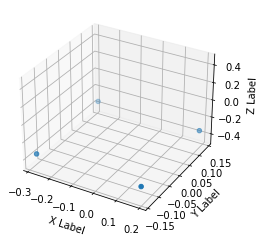

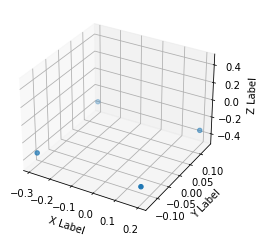


FL before: -0.339. FL after: -0.289209604263

FR before: -0.337. FR after: -0.326362788677

RL before: -0.343. RL after: -0.331333756447

RR before: -0.341. RR after: -0.289879471064
Footstep timestamp:  1628071683.18
Height check index:  44
Height check timestamp:  1628071683.32

FL moving: 0.049790395737000004. FR moving: 0.010637211322999995
RL moving: 0.011666243553. RR moving: 0.051120528936

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.199, 0.131, -0.339]. Coord FR: [0.193, -0.131, -0.337]. Coord RL: [-0.291, 0.13, -0.343]. Coord RR: [-0.287, -0.127, -0.341]

FR step_size x: 0.02341290843500002. FR step_size y: 0.017108181596. RL step_size x: 0.018722584724999936. RL step_size x: 0.03555960881699999.


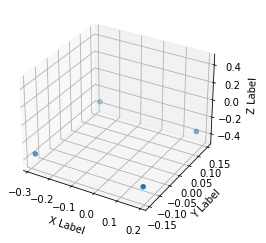


FL before: -0.337. FL after: -0.326079696417

FR before: -0.342. FR after: -0.289278239012

RL before: -0.338. RL after: -0.289499402046

RR before: -0.345. RR after: -0.331157058477
Footstep timestamp:  1628071683.5
Height check index:  60
Height check timestamp:  1628071683.64

FL moving: 0.010920303583000002. FR moving: 0.05272176098800002
RL moving: 0.048500597954000024. RR moving: 0.013842941522999974

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.137, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.275, 0.147, -0.338]. Coord RR: [-0.284, -0.146, -0.345]

FR step_size x: 0.017501774192000025. FR step_size y: 0.024057597757000004. RL step_size x: 0.016887829065000026. RL step_size x: 0.04296965378499998.


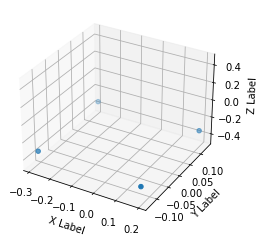


FL before: -0.336. FL after: -0.289780497551

FR before: -0.336. FR after: -0.325475692749

RL before: -0.344. RL after: -0.328994572163

RR before: -0.331. RR after: -0.289568156004
Footstep timestamp:  1628071683.86
Height check index:  77
Height check timestamp:  1628071683.98

FL moving: 0.04621950244900003. FR moving: 0.010524307251000009
RL moving: 0.015005427836999985. RR moving: 0.04143184399600003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.127, -0.336]. Coord FR: [0.19, -0.128, -0.336]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.286, -0.12, -0.331]

FR step_size x: 0.01583915209800002. FR step_size y: 0.025450627207999982. RL step_size x: 0.020444715976999928. RL step_size x: 0.04379940032900001.


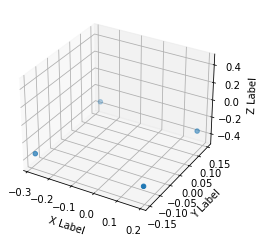


FL before: -0.337. FL after: -0.326523154974

FR before: -0.342. FR after: -0.290749520063

RL before: -0.338. RL after: -0.290074408054

RR before: -0.343. RR after: -0.332338452339
Footstep timestamp:  1628071684.14
Height check index:  92
Height check timestamp:  1628071684.28

FL moving: 0.010476845026000048. FR moving: 0.05125047993700005
RL moving: 0.047925591946000046. RR moving: 0.010661547661000026

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.272, 0.146, -0.338]. Coord RR: [-0.283, -0.148, -0.343]

FR step_size x: 0.018532578945000017. FR step_size y: 0.022595432161999995. RL step_size x: 0.019342370033999967. RL step_size x: 0.03916737461.


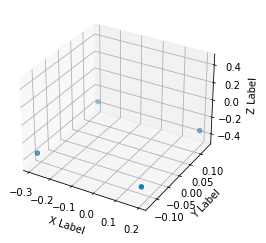


FL before: -0.342. FL after: -0.289643466473

FR before: -0.337. FR after: -0.326185822487

RL before: -0.345. RL after: -0.331156522036

RR before: -0.339. RR after: -0.28996270895
Footstep timestamp:  1628071684.48
Height check index:  109
Height check timestamp:  1628071684.62

FL moving: 0.05235653352700004. FR moving: 0.010814177513000012
RL moving: 0.013843477963999984. RR moving: 0.04903729105000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.13, -0.345]. Coord RR: [-0.284, -0.125, -0.339]

FR step_size x: 0.019073057652000014. FR step_size y: 0.025106818794999985. RL step_size x: 0.01659884953499996. RL step_size x: 0.040284152031.


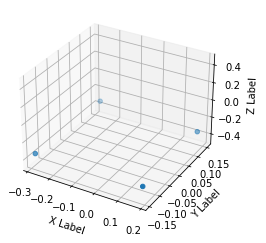


FL before: -0.336. FL after: -0.325276792049

FR before: -0.334. FR after: -0.288777410984

RL before: -0.331. RL after: -0.288595229387

RR before: -0.342. RR after: -0.329927265644
Footstep timestamp:  1628071684.84
Height check index:  126
Height check timestamp:  1628071684.96

FL moving: 0.010723207951000013. FR moving: 0.045222589016000014
RL moving: 0.04240477061300002. RR moving: 0.012072734356000037

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.149, -0.331]. Coord RR: [-0.284, -0.146, -0.342]

FR step_size x: 0.018428164481999992. FR step_size y: 0.024942390799000014. RL step_size x: 0.019143173693999926. RL step_size x: 0.04027511000599998.


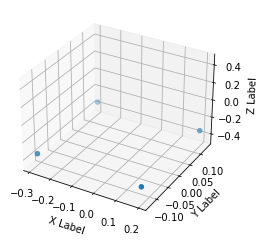


FL before: -0.343. FL after: -0.290962845087

FR before: -0.337. FR after: -0.32667323947

RL before: -0.345. RL after: -0.332059860229

RR before: -0.339. RR after: -0.290270805359
Footstep timestamp:  1628071685.12
Height check index:  140
Height check timestamp:  1628071685.24

FL moving: 0.05203715491300004. FR moving: 0.010326760530000034
RL moving: 0.012940139770999948. RR moving: 0.048729194641000007

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.343]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.129, -0.345]. Coord RR: [-0.283, -0.126, -0.339]

FR step_size x: 0.01755275177900001. FR step_size y: 0.022712515115999976. RL step_size x: 0.017990675211000007. RL step_size x: 0.035865570306999994.


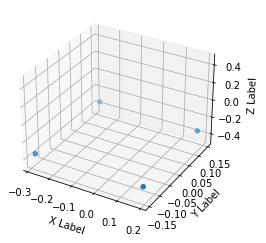


FL before: -0.337. FL after: -0.326642662287

FR before: -0.342. FR after: -0.290754497051

RL before: -0.339. RL after: -0.290275752544

RR before: -0.344. RR after: -0.332389593124
Footstep timestamp:  1628071685.44
Height check index:  157
Height check timestamp:  1628071685.58

FL moving: 0.010357337713000014. FR moving: 0.051245502949000044
RL moving: 0.048724247456000014. RR moving: 0.011610406875999957

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.275, 0.145, -0.339]. Coord RR: [-0.284, -0.146, -0.344]

FR step_size x: 0.018268515467999985. FR step_size y: 0.022622596979000015. RL step_size x: 0.015327170848999982. RL step_size x: 0.037733024715999985.


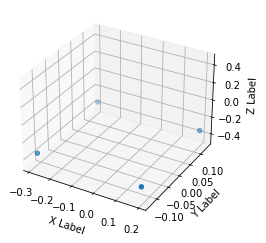


FL before: -0.342. FL after: -0.289649218321

FR before: -0.337. FR after: -0.326334923506

RL before: -0.345. RL after: -0.331165760756

RR before: -0.34. RR after: -0.290049761534
Footstep timestamp:  1628071685.76
Height check index:  172
Height check timestamp:  1628071685.88

FL moving: 0.052350781679000036. FR moving: 0.010665076494000003
RL moving: 0.013834239243999957. RR moving: 0.04995023846600005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.129, -0.345]. Coord RR: [-0.284, -0.125, -0.34]

FR step_size x: 0.017718035459000026. FR step_size y: 0.023498581170999983. RL step_size x: 0.017303525447999957. RL step_size x: 0.03975247657299999.


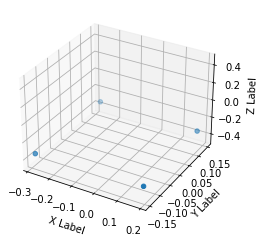


FL before: -0.337. FL after: -0.326140284538

FR before: -0.342. FR after: -0.289600938559

RL before: -0.338. RL after: -0.289120823145

RR before: -0.343. RR after: -0.331553936005
Footstep timestamp:  1628071686.1
Height check index:  189
Height check timestamp:  1628071686.23

FL moving: 0.010859715462000041. FR moving: 0.05239906144100004
RL moving: 0.04887917685500004. RR moving: 0.011446063995000033

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.148, -0.343]

FR step_size x: 0.01762913644400002. FR step_size y: 0.023109060286999994. RL step_size x: 0.019516162633999967. RL step_size x: 0.039227634906999986.


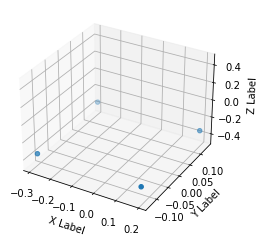


FL before: -0.343. FL after: -0.290904968977

FR before: -0.337. FR after: -0.326555728912

RL before: -0.345. RL after: -0.332241415977

RR before: -0.339. RR after: -0.29090616107
Footstep timestamp:  1628071686.43
Height check index:  206
Height check timestamp:  1628071686.56

FL moving: 0.052095031023000005. FR moving: 0.010444271088000001
RL moving: 0.012758584022999953. RR moving: 0.04809383893000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.343]. Coord FR: [0.191, -0.127, -0.337]. Coord RL: [-0.292, 0.129, -0.345]. Coord RR: [-0.283, -0.126, -0.339]

FR step_size x: 0.01660229814. FR step_size y: 0.023088903546000017. RL step_size x: 0.020294245719000015. RL step_size x: 0.038494701384999996.


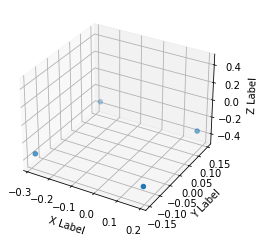


FL before: -0.337. FL after: -0.327185183764

FR before: -0.342. FR after: -0.292226314545

RL before: -0.338. RL after: -0.291379004717

RR before: -0.344. RR after: -0.33336058259
Footstep timestamp:  1628071686.75
Height check index:  222
Height check timestamp:  1628071686.89

FL moving: 0.009814816236000001. FR moving: 0.04977368545500005
RL moving: 0.04662099528300001. RR moving: 0.010639417409999963

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.018354912400000006. FR step_size y: 0.022867035627000015. RL step_size x: 0.018133919716000035. RL step_size x: 0.03973998355899999.


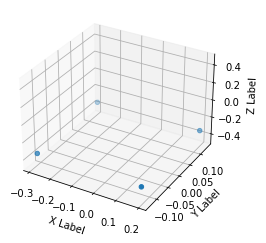


FL before: -0.342. FL after: -0.290308505297

FR before: -0.337. FR after: -0.326542824507

RL before: -0.345. RL after: -0.33148676157

RR before: -0.34. RR after: -0.289937108755
Footstep timestamp:  1628071687.09
Height check index:  238
Height check timestamp:  1628071687.21

FL moving: 0.05169149470300005. FR moving: 0.010457175493000015
RL moving: 0.013513238429999963. RR moving: 0.05006289124500002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.291, 0.128, -0.345]. Coord RR: [-0.284, -0.125, -0.34]

FR step_size x: 0.017551216960000005. FR step_size y: 0.023292885541999986. RL step_size x: 0.018137526511999957. RL step_size x: 0.04028612983199997.


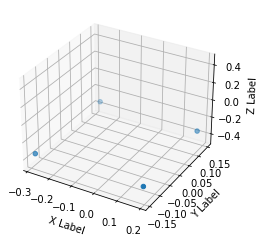


FL before: -0.337. FL after: -0.326342880726

FR before: -0.342. FR after: -0.290033221245

RL before: -0.338. RL after: -0.290024846792

RR before: -0.343. RR after: -0.331989228725
Footstep timestamp:  1628071687.41
Height check index:  255
Height check timestamp:  1628071687.55

FL moving: 0.010657119274000038. FR moving: 0.051966778755000054
RL moving: 0.047975153208. RR moving: 0.011010771275000053

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.283, -0.147, -0.343]

FR step_size x: 0.018053014874999995. FR step_size y: 0.023023751139999993. RL step_size x: 0.018501186609999998. RL step_size x: 0.038768502354999984.


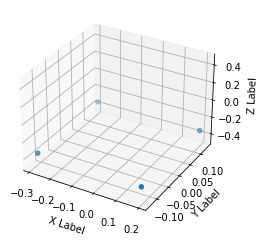


FL before: -0.342. FL after: -0.291480779648

FR before: -0.337. FR after: -0.326940715313

RL before: -0.345. RL after: -0.332493156195

RR before: -0.339. RR after: -0.291471600533
Footstep timestamp:  1628071687.73
Height check index:  271
Height check timestamp:  1628071687.87

FL moving: 0.050519220352000016. FR moving: 0.010059284687000014
RL moving: 0.012506843805. RR moving: 0.04752839946700005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.129, -0.345]. Coord RR: [-0.283, -0.125, -0.339]

FR step_size x: 0.017677012563000027. FR step_size y: 0.022763775109999995. RL step_size x: 0.01880930233. RL step_size x: 0.039527901172.


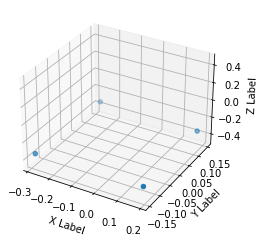


FL before: -0.337. FL after: -0.326236784458

FR before: -0.342. FR after: -0.289626181126

RL before: -0.338. RL after: -0.28909778595

RR before: -0.343. RR after: -0.331536203623
Footstep timestamp:  1628071688.07
Height check index:  287
Height check timestamp:  1628071688.19

FL moving: 0.010763215542000049. FR moving: 0.052373818874
RL moving: 0.048902214050000004. RR moving: 0.011463796377000013

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.343]

FR step_size x: 0.017962833047. FR step_size y: 0.02305146729900001. RL step_size x: 0.01878856873599999. RL step_size x: 0.03833180892499999.


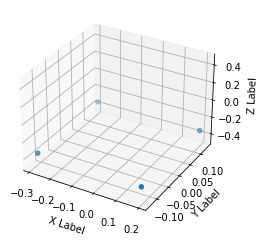


FL before: -0.342. FL after: -0.291473537683

FR before: -0.337. FR after: -0.326903253794

RL before: -0.345. RL after: -0.332400411367

RR before: -0.339. RR after: -0.291493982077
Footstep timestamp:  1628071688.37
Height check index:  302
Height check timestamp:  1628071688.49

FL moving: 0.05052646231700003. FR moving: 0.01009674620600004
RL moving: 0.01259958863299998. RR moving: 0.04750601792300002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.129, -0.345]. Coord RR: [-0.283, -0.125, -0.339]

FR step_size x: 0.018820557476000005. FR step_size y: 0.024364964485. RL step_size x: 0.018404109953999992. RL step_size x: 0.03886605119700001.


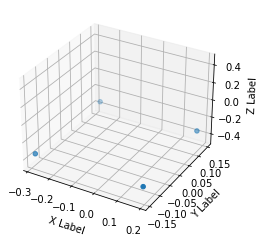


FL before: -0.336. FL after: -0.327069848776

FR before: -0.341. FR after: -0.292244374752

RL before: -0.338. RL after: -0.292044013739

RR before: -0.344. RR after: -0.333156049252
Footstep timestamp:  1628071688.69
Height check index:  319
Height check timestamp:  1628071688.83

FL moving: 0.008930151224000038. FR moving: 0.048755625248000034
RL moving: 0.045955986261000004. RR moving: 0.010843950747999986

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.139, -0.336]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.02014860785. FR step_size y: 0.02556602132300001. RL step_size x: 0.019215194702000005. RL step_size x: 0.040928082942999974.


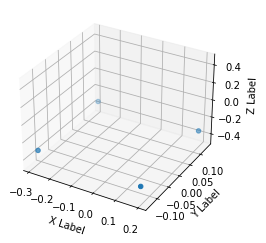


FL before: -0.331. FL after: -0.288776725531

FR before: -0.335. FR after: -0.325802475214

RL before: -0.342. RL after: -0.330540329218

RR before: -0.329. RR after: -0.289331793785
Footstep timestamp:  1628071689.07
Height check index:  337
Height check timestamp:  1628071689.19

FL moving: 0.04222327446900004. FR moving: 0.009197524786
RL moving: 0.011459670782000053. RR moving: 0.039668206215

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.126, -0.331]. Coord FR: [0.191, -0.13, -0.335]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.288, -0.12, -0.329]

FR step_size x: 0.019102783441000026. FR step_size y: 0.024659288168000004. RL step_size x: 0.020355262278999975. RL step_size x: 0.04137896406700001.


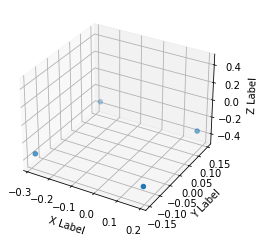


FL before: -0.337. FL after: -0.326115876436

FR before: -0.342. FR after: -0.289664357901

RL before: -0.338. RL after: -0.28918030858

RR before: -0.344. RR after: -0.33164063096
Footstep timestamp:  1628071689.37
Height check index:  352
Height check timestamp:  1628071689.49

FL moving: 0.010884123564000037. FR moving: 0.052335642099000046
RL moving: 0.04881969142000003. RR moving: 0.012359369039999957

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.018605132698999993. FR step_size y: 0.022905763745000002. RL step_size x: 0.016947608470999964. RL step_size x: 0.040491352259999974.


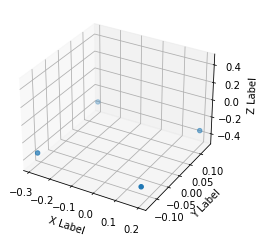


FL before: -0.342. FL after: -0.290199309587

FR before: -0.337. FR after: -0.326499372721

RL before: -0.345. RL after: -0.33161509037

RR before: -0.34. RR after: -0.290642410517
Footstep timestamp:  1628071689.69
Height check index:  369
Height check timestamp:  1628071689.83

FL moving: 0.051800690413000006. FR moving: 0.01050062727900003
RL moving: 0.013384909629999997. RR moving: 0.04935758948300001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.129, -0.345]. Coord RR: [-0.284, -0.124, -0.34]

FR step_size x: 0.018477679728999996. FR step_size y: 0.022853554606. RL step_size x: 0.017072229623999957. RL step_size x: 0.039448058724999985.


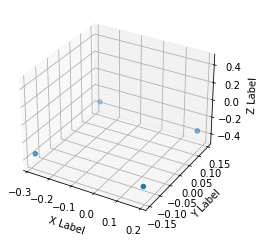


FL before: -0.337. FL after: -0.326370507479

FR before: -0.342. FR after: -0.29022821784

RL before: -0.339. RL after: -0.289734899998

RR before: -0.344. RR after: -0.331889510155
Footstep timestamp:  1628071690.01
Height check index:  384
Height check timestamp:  1628071690.13

FL moving: 0.010629492521000039. FR moving: 0.05177178216
RL moving: 0.04926510000200002. RR moving: 0.012110489844999961

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.145, -0.339]. Coord RR: [-0.283, -0.147, -0.344]

FR step_size x: 0.017128636241. FR step_size y: 0.022490960120999992. RL step_size x: 0.018964838265999984. RL step_size x: 0.03773549628299999.


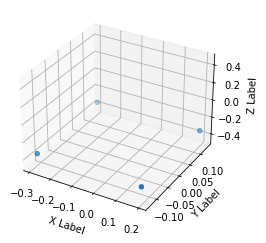


FL before: -0.343. FL after: -0.290925532579

FR before: -0.337. FR after: -0.326619058847

RL before: -0.345. RL after: -0.332040160894

RR before: -0.339. RR after: -0.291001111269
Footstep timestamp:  1628071690.31
Height check index:  399
Height check timestamp:  1628071690.43

FL moving: 0.052074467421000026. FR moving: 0.010380941153000034
RL moving: 0.01295983910599996. RR moving: 0.047998888731

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.343]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.128, -0.345]. Coord RR: [-0.284, -0.126, -0.339]

FR step_size x: 0.018084082484000008. FR step_size y: 0.023183898449000012. RL step_size x: 0.01904805994099995. RL step_size x: 0.039788850306999995.


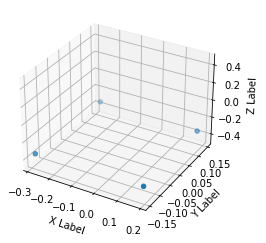


FL before: -0.337. FL after: -0.326837360859

FR before: -0.342. FR after: -0.291449725628

RL before: -0.338. RL after: -0.290756255388

RR before: -0.344. RR after: -0.332682818174
Footstep timestamp:  1628071690.65
Height check index:  417
Height check timestamp:  1628071690.79

FL moving: 0.010162639141000018. FR moving: 0.05055027437200005
RL moving: 0.04724374461200004. RR moving: 0.011317181826

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.148, -0.344]

FR step_size x: 0.018942152261999995. FR step_size y: 0.024367701768999994. RL step_size x: 0.019969295740000004. RL step_size x: 0.04277646565399999.


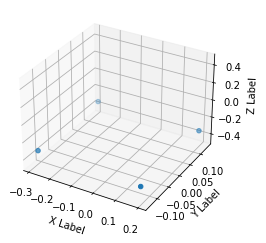


FL before: -0.334. FL after: -0.28863838315

FR before: -0.336. FR after: -0.325651198626

RL before: -0.343. RL after: -0.329368710518

RR before: -0.332. RR after: -0.288562089205
Footstep timestamp:  1628071691.01
Height check index:  434
Height check timestamp:  1628071691.13

FL moving: 0.04536161685000001. FR moving: 0.010348801374000016
RL moving: 0.013631289482000042. RR moving: 0.043437910795000034

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.131, -0.343]. Coord RR: [-0.288, -0.12, -0.332]

FR step_size x: 0.019116984248000013. FR step_size y: 0.02542509067099999. RL step_size x: 0.02070451569599996. RL step_size x: 0.043767126441000004.


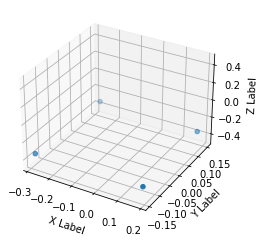


FL before: -0.337. FL after: -0.325534969568

FR before: -0.339. FR after: -0.288333028555

RL before: -0.336. RL after: -0.288691580296

RR before: -0.343. RR after: -0.330835342407
Footstep timestamp:  1628071691.33
Height check index:  450
Height check timestamp:  1628071691.45

FL moving: 0.011465030432000034. FR moving: 0.05066697144500004
RL moving: 0.047308419704000015. RR moving: 0.012164657593000006

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.187, -0.143, -0.339]. Coord RL: [-0.273, 0.148, -0.336]. Coord RR: [-0.283, -0.146, -0.343]

FR step_size x: 0.01748858869099998. FR step_size y: 0.023809159518. RL step_size x: 0.01969745182999999. RL step_size x: 0.03920015716499997.


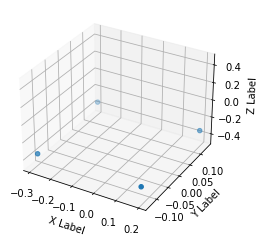


FL before: -0.342. FL after: -0.290958404541

FR before: -0.337. FR after: -0.326700866222

RL before: -0.345. RL after: -0.332065314054

RR before: -0.339. RR after: -0.290301918983
Footstep timestamp:  1628071691.61
Height check index:  464
Height check timestamp:  1628071691.73

FL moving: 0.051041595459. FR moving: 0.010299133778000014
RL moving: 0.012934685945999946. RR moving: 0.04869808101700002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.191, -0.127, -0.337]. Coord RL: [-0.293, 0.129, -0.345]. Coord RR: [-0.283, -0.126, -0.339]

FR step_size x: 0.016914477467000005. FR step_size y: 0.02343435716599998. RL step_size x: 0.01955933332500004. RL step_size x: 0.03813200712199999.


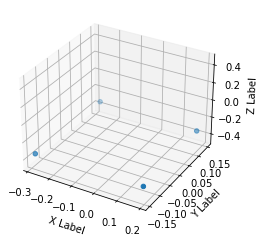


FL before: -0.337. FL after: -0.326815366745

FR before: -0.341. FR after: -0.291503816843

RL before: -0.338. RL after: -0.29123494029

RR before: -0.344. RR after: -0.332980662584
Footstep timestamp:  1628071691.95
Height check index:  482
Height check timestamp:  1628071692.09

FL moving: 0.01018463325500002. FR moving: 0.04949618315700005
RL moving: 0.04676505971. RR moving: 0.011019337415999975

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.139, -0.337]. Coord FR: [0.189, -0.142, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.01895718753300002. FR step_size y: 0.024036225438999997. RL step_size x: 0.018356798410999964. RL step_size x: 0.039486157178999975.


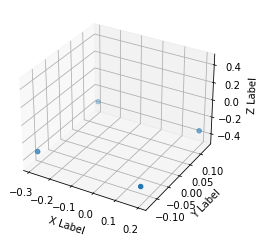


FL before: -0.337. FL after: -0.28896304965

FR before: -0.336. FR after: -0.325465798378

RL before: -0.344. RL after: -0.329222589731

RR before: -0.334. RR after: -0.288780272007
Footstep timestamp:  1628071692.31
Height check index:  499
Height check timestamp:  1628071692.43

FL moving: 0.048036950349999996. FR moving: 0.010534201622000028
RL moving: 0.01477741026899998. RR moving: 0.045219727993

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.287, -0.122, -0.334]

FR step_size x: 0.018719659687000012. FR step_size y: 0.026639684319999996. RL step_size x: 0.01755795669599991. RL step_size x: 0.03884718430100001.


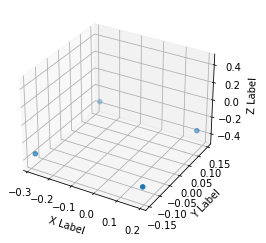


FL before: -0.336. FL after: -0.327570348978

FR before: -0.339. FR after: -0.292797625065

RL before: -0.338. RL after: -0.292649775743

RR before: -0.344. RR after: -0.33367857337
Footstep timestamp:  1628071692.59
Height check index:  513
Height check timestamp:  1628071692.71

FL moving: 0.008429651021999995. FR moving: 0.04620237493500001
RL moving: 0.04535022425700003. RR moving: 0.010321426629999964

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.14, -0.336]. Coord FR: [0.189, -0.144, -0.339]. Coord RL: [-0.275, 0.146, -0.338]. Coord RR: [-0.284, -0.146, -0.344]

FR step_size x: 0.019041140676000018. FR step_size y: 0.027600547313999996. RL step_size x: 0.018442109584999977. RL step_size x: 0.03908060175099999.


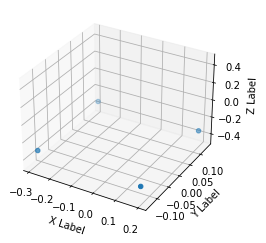


FL before: -0.33. FL after: -0.305282831192

FR before: -0.335. FR after: -0.325348496437

RL before: -0.342. RL after: -0.327499836683

RR before: -0.328. RR after: -0.304917961359
Footstep timestamp:  1628071692.97
Height check index:  533
Height check timestamp:  1628071693.11

FL moving: 0.024717168808000012. FR moving: 0.009651503563000041
RL moving: 0.014500163317000048. RR moving: 0.023082038641000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.126, -0.33]. Coord FR: [0.191, -0.13, -0.335]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.288, -0.121, -0.328]

FR step_size x: 0.019944624543000028. FR step_size y: 0.026228991388999978. RL step_size x: 0.018921412944999993. RL step_size x: 0.042323878525999975.


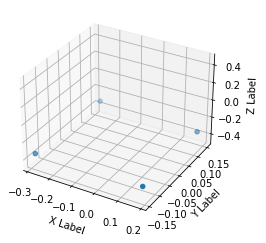


FL before: -0.335. FL after: -0.325309365988

FR before: -0.334. FR after: -0.288451045752

RL before: -0.331. RL after: -0.28819873929

RR before: -0.342. RR after: -0.330073207617
Footstep timestamp:  1628071693.29
Height check index:  548
Height check timestamp:  1628071693.41

FL moving: 0.009690634012000043. FR moving: 0.04554895424800004
RL moving: 0.04280126071000001. RR moving: 0.01192679238300004

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.138, -0.335]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.149, -0.331]. Coord RR: [-0.284, -0.146, -0.342]

FR step_size x: 0.019850197196000008. FR step_size y: 0.025587940931000003. RL step_size x: 0.01826083493199998. RL step_size x: 0.04178593873999997.


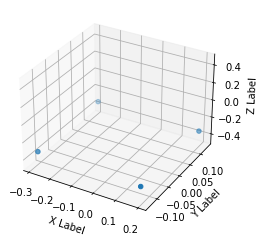


FL before: -0.338. FL after: -0.288648813963

FR before: -0.336. FR after: -0.325703412294

RL before: -0.344. RL after: -0.329762250185

RR before: -0.334. RR after: -0.288468003273
Footstep timestamp:  1628071693.61
Height check index:  564
Height check timestamp:  1628071693.73

FL moving: 0.049351186037000006. FR moving: 0.010296587706000004
RL moving: 0.014237749814999978. RR moving: 0.045531996727000035

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.338]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.286, -0.122, -0.334]

FR step_size x: 0.019160450936000023. FR step_size y: 0.027032879233999996. RL step_size x: 0.019130970001000003. RL step_size x: 0.04214321684899999.


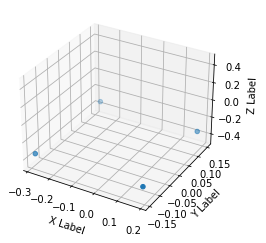


FL before: -0.336. FL after: -0.325327217579

FR before: -0.339. FR after: -0.288345038891

RL before: -0.336. RL after: -0.288861602545

RR before: -0.343. RR after: -0.330834269524
Footstep timestamp:  1628071693.91
Height check index:  580
Height check timestamp:  1628071694.05

FL moving: 0.010672782421000004. FR moving: 0.05065496110900003
RL moving: 0.047138397455000036. RR moving: 0.012165730476000003

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.144, -0.339]. Coord RL: [-0.273, 0.148, -0.336]. Coord RR: [-0.284, -0.147, -0.343]

FR step_size x: 0.01827395439100002. FR step_size y: 0.024163432598000023. RL step_size x: 0.018398057698999992. RL step_size x: 0.039313195347999985.


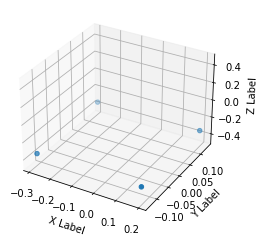


FL before: -0.342. FL after: -0.289752453566

FR before: -0.337. FR after: -0.326332569122

RL before: -0.345. RL after: -0.331011265516

RR before: -0.339. RR after: -0.28938883543
Footstep timestamp:  1628071694.23
Height check index:  596
Height check timestamp:  1628071694.37

FL moving: 0.052247546434000036. FR moving: 0.01066743087800004
RL moving: 0.013988734483999954. RR moving: 0.04961116457000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.129, -0.345]. Coord RR: [-0.284, -0.127, -0.339]

FR step_size x: 0.01867469000800001. FR step_size y: 0.022871169806000013. RL step_size x: 0.016428441525000004. RL step_size x: 0.03687162423099999.


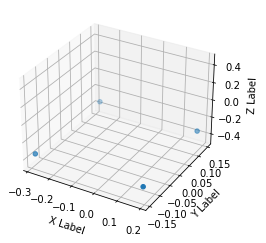


FL before: -0.337. FL after: -0.326400369406

FR before: -0.342. FR after: -0.290316015482

RL before: -0.339. RL after: -0.289685189724

RR before: -0.345. RR after: -0.332059025764
Footstep timestamp:  1628071694.55
Height check index:  611
Height check timestamp:  1628071694.67

FL moving: 0.010599630594000042. FR moving: 0.05168398451800005
RL moving: 0.04931481027600004. RR moving: 0.012940974235999991

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.342]. Coord RL: [-0.275, 0.146, -0.339]. Coord RR: [-0.284, -0.147, -0.345]

FR step_size x: 0.017909457087999986. FR step_size y: 0.023089805959999987. RL step_size x: 0.017792579173999956. RL step_size x: 0.03788919973299998.


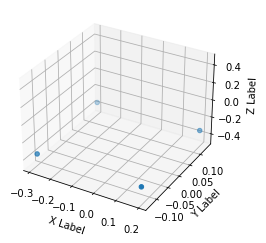


FL before: -0.341. FL after: -0.292086035013

FR before: -0.337. FR after: -0.32722145319

RL before: -0.345. RL after: -0.332789868116

RR before: -0.339. RR after: -0.291475862265
Footstep timestamp:  1628071694.87
Height check index:  627
Height check timestamp:  1628071694.99

FL moving: 0.048913964987000014. FR moving: 0.00977854681000001
RL moving: 0.012210131883999997. RR moving: 0.04752413773500003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.132, -0.341]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.128, -0.345]. Coord RR: [-0.283, -0.127, -0.339]

FR step_size x: 0.018133777857000016. FR step_size y: 0.023112732529000007. RL step_size x: 0.017851066588999986. RL step_size x: 0.038290823699.


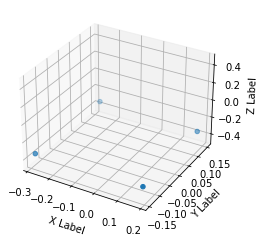


FL before: -0.336. FL after: -0.325523942709

FR before: -0.339. FR after: -0.288328528404

RL before: -0.337. RL after: -0.288863897324

RR before: -0.343. RR after: -0.330751091242
Footstep timestamp:  1628071695.23
Height check index:  646
Height check timestamp:  1628071695.37

FL moving: 0.01047605729100004. FR moving: 0.05067147159600005
RL moving: 0.04813610267600005. RR moving: 0.012248908758000054

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.143, -0.339]. Coord RL: [-0.274, 0.148, -0.337]. Coord RR: [-0.283, -0.146, -0.343]

FR step_size x: 0.018983443379999992. FR step_size y: 0.025318885564. RL step_size x: 0.019643317938000004. RL step_size x: 0.04126453423499998.


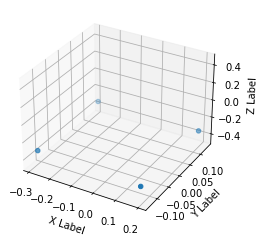


FL before: -0.331. FL after: -0.288245528936

FR before: -0.335. FR after: -0.325579971075

RL before: -0.342. RL after: -0.32987678051

RR before: -0.329. RR after: -0.288959115744
Footstep timestamp:  1628071695.55
Height check index:  661
Height check timestamp:  1628071695.67

FL moving: 0.042754471064000044. FR moving: 0.009420028925000046
RL moving: 0.012123219490000003. RR moving: 0.040040884256

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.126, -0.331]. Coord FR: [0.191, -0.13, -0.335]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.288, -0.121, -0.329]

FR step_size x: 0.02059365952. FR step_size y: 0.026600969076999992. RL step_size x: 0.019438989877999968. RL step_size x: 0.041675573706.


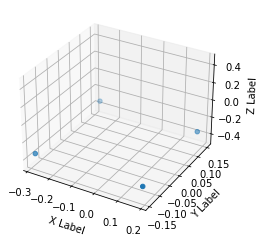


FL before: -0.336. FL after: -0.325724154711

FR before: -0.334. FR after: -0.288871705532

RL before: -0.331. RL after: -0.289138376713

RR before: -0.342. RR after: -0.33105546236
Footstep timestamp:  1628071695.87
Height check index:  677
Height check timestamp:  1628071695.99

FL moving: 0.010275845288999996. FR moving: 0.04512829446800004
RL moving: 0.041861623286999994. RR moving: 0.01094453764000003

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.149, -0.331]. Coord RR: [-0.283, -0.146, -0.342]

FR step_size x: 0.019464421033. FR step_size y: 0.02583470213400002. RL step_size x: 0.018348228216999996. RL step_size x: 0.041542818844000004.


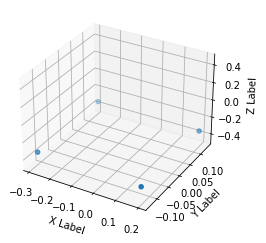


FL before: -0.339. FL after: -0.288759469986

FR before: -0.337. FR after: -0.325852453709

RL before: -0.344. RL after: -0.330492377281

RR before: -0.337. RR after: -0.289359539747
Footstep timestamp:  1628071696.19
Height check index:  694
Height check timestamp:  1628071696.33

FL moving: 0.05024053001400003. FR moving: 0.01114754629100001
RL moving: 0.013507622718999968. RR moving: 0.047640460253000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.339]. Coord FR: [0.192, -0.129, -0.337]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.286, -0.123, -0.337]

FR step_size x: 0.018590958357000004. FR step_size y: 0.024403735279999977. RL step_size x: 0.019613350391999962. RL step_size x: 0.03922677850699999.


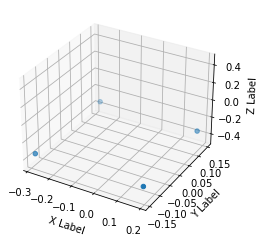


FL before: -0.337. FL after: -0.325914382935

FR before: -0.342. FR after: -0.289159536362

RL before: -0.338. RL after: -0.289346367121

RR before: -0.343. RR after: -0.33151268959
Footstep timestamp:  1628071696.51
Height check index:  709
Height check timestamp:  1628071696.64

FL moving: 0.011085617064999997. FR moving: 0.052840463638000046
RL moving: 0.04865363287900004. RR moving: 0.011487310410000007

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.283, -0.147, -0.343]

FR step_size x: 0.018555169105999997. FR step_size y: 0.022943269968000002. RL step_size x: 0.01879792833299998. RL step_size x: 0.040988685965999985.


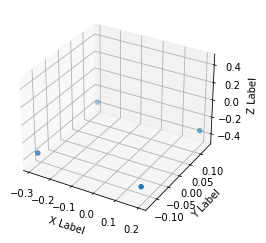


FL before: -0.342. FL after: -0.290830254555

FR before: -0.337. FR after: -0.326774716377

RL before: -0.345. RL after: -0.331893146038

RR before: -0.34. RR after: -0.29050552845
Footstep timestamp:  1628071696.84
Height check index:  726
Height check timestamp:  1628071696.97

FL moving: 0.051169745445000026. FR moving: 0.010225283623000014
RL moving: 0.013106853961999954. RR moving: 0.04949447155000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.128, -0.345]. Coord RR: [-0.284, -0.124, -0.34]

FR step_size x: 0.01871480190800001. FR step_size y: 0.023169220805. RL step_size x: 0.017637383937999962. RL step_size x: 0.040270675301999986.


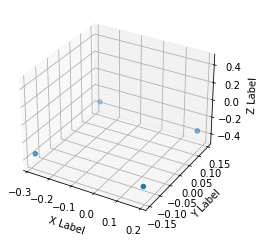


FL before: -0.337. FL after: -0.32695093751

FR before: -0.342. FR after: -0.291311621666

RL before: -0.339. RL after: -0.290474802256

RR before: -0.344. RR after: -0.332461535931
Footstep timestamp:  1628071697.15
Height check index:  741
Height check timestamp:  1628071697.28

FL moving: 0.010049062490000038. FR moving: 0.05068837833400003
RL moving: 0.04852519774400005. RR moving: 0.011538464068999998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.145, -0.339]. Coord RR: [-0.283, -0.147, -0.344]

FR step_size x: 0.018335227965999984. FR step_size y: 0.02324331975000002. RL step_size x: 0.01809845495200002. RL step_size x: 0.037863802730999985.


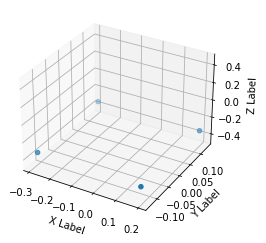


FL before: -0.341. FL after: -0.313706070185

FR before: -0.337. FR after: -0.325389206409

RL before: -0.344. RL after: -0.327283024788

RR before: -0.338. RR after: -0.314440339804
Footstep timestamp:  1628071697.54
Height check index:  761
Height check timestamp:  1628071697.67

FL moving: 0.027293929815000006. FR moving: 0.011610793591000035
RL moving: 0.016716975211999996. RR moving: 0.023559660196000032

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.341]. Coord FR: [0.191, -0.129, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.285, -0.124, -0.338]

FR step_size x: 0.018003169178999995. FR step_size y: 0.022518263578999997. RL step_size x: 0.017948997019999913. RL step_size x: 0.03965926981000001.


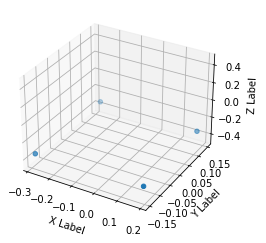


FL before: -0.337. FL after: -0.326521843672

FR before: -0.342. FR after: -0.290801435709

RL before: -0.338. RL after: -0.29004919529

RR before: -0.344. RR after: -0.332470834255
Footstep timestamp:  1628071697.82
Height check index:  774
Height check timestamp:  1628071697.94

FL moving: 0.010478156328000032. FR moving: 0.051198564291000004
RL moving: 0.04795080471000002. RR moving: 0.011529165744999958

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.138, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.148, -0.344]

FR step_size x: 0.018084352016000005. FR step_size y: 0.02159316718599999. RL step_size x: 0.01946239924399995. RL step_size x: 0.039237618684999975.


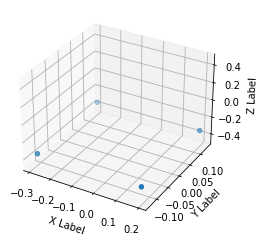


FL before: -0.342. FL after: -0.291463017464

FR before: -0.337. FR after: -0.326905608177

RL before: -0.345. RL after: -0.332254558802

RR before: -0.339. RR after: -0.291400372982
Footstep timestamp:  1628071698.14
Height check index:  791
Height check timestamp:  1628071698.28

FL moving: 0.05053698253600003. FR moving: 0.010094391823000037
RL moving: 0.012745441197999974. RR moving: 0.047599627018000024

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.128, -0.345]. Coord RR: [-0.283, -0.126, -0.339]

FR step_size x: 0.017495725036. FR step_size y: 0.022888617038999998. RL step_size x: 0.019093241930000004. RL step_size x: 0.03939209198999999.


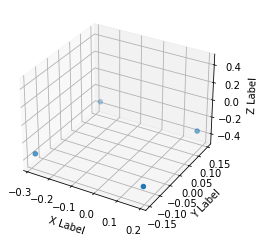


FL before: -0.337. FL after: -0.327624380589

FR before: -0.342. FR after: -0.293669193983

RL before: -0.338. RL after: -0.29311683774

RR before: -0.344. RR after: -0.334046274424
Footstep timestamp:  1628071698.46
Height check index:  807
Height check timestamp:  1628071698.6

FL moving: 0.009375619411000014. FR moving: 0.048330806017000016
RL moving: 0.04488316226. RR moving: 0.009953725575999994

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.018009235262999995. FR step_size y: 0.02297164177899999. RL step_size x: 0.01882400369699999. RL step_size x: 0.03824679779999998.


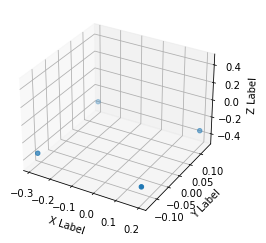


FL before: -0.343. FL after: -0.289884775877

FR before: -0.337. FR after: -0.326286107302

RL before: -0.345. RL after: -0.331192106009

RR before: -0.339. RR after: -0.289424955845
Footstep timestamp:  1628071698.78
Height check index:  822
Height check timestamp:  1628071698.9

FL moving: 0.053115224123000015. FR moving: 0.01071389269800005
RL moving: 0.013807893990999964. RR moving: 0.049575044155000025

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.343]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.13, -0.345]. Coord RR: [-0.283, -0.125, -0.339]

FR step_size x: 0.017496723413000015. FR step_size y: 0.02284215521800001. RL step_size x: 0.017098052978000045. RL step_size x: 0.035532410145.


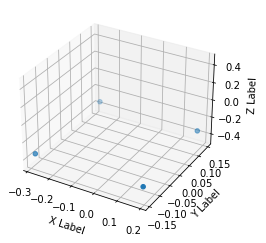


FL before: -0.337. FL after: -0.325945079327

FR before: -0.342. FR after: -0.289221197367

RL before: -0.339. RL after: -0.289490491152

RR before: -0.344. RR after: -0.331636101007
Footstep timestamp:  1628071699.12
Height check index:  839
Height check timestamp:  1628071699.24

FL moving: 0.011054920673000013. FR moving: 0.052778802633
RL moving: 0.04950950884800004. RR moving: 0.012363898993

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.145, -0.339]. Coord RR: [-0.283, -0.146, -0.344]

FR step_size x: 0.017654855847000023. FR step_size y: 0.022288647056000005. RL step_size x: 0.018641572476000012. RL step_size x: 0.036145067572000006.


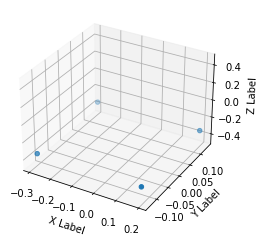


FL before: -0.342. FL after: -0.290948987007

FR before: -0.337. FR after: -0.326714098454

RL before: -0.345. RL after: -0.331867009401

RR before: -0.339. RR after: -0.290416836739
Footstep timestamp:  1628071699.44
Height check index:  856
Height check timestamp:  1628071699.58

FL moving: 0.05105101299300002. FR moving: 0.01028590154600001
RL moving: 0.013132990598999972. RR moving: 0.04858316326100004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.129, -0.345]. Coord RR: [-0.284, -0.126, -0.339]

FR step_size x: 0.017684954882000004. FR step_size y: 0.02362045776800001. RL step_size x: 0.018587614059999924. RL step_size x: 0.03650778055199999.


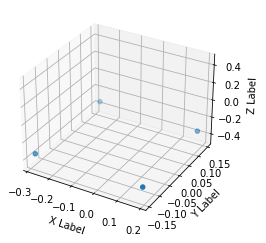


FL before: -0.337. FL after: -0.325220108032

FR before: -0.341. FR after: -0.288228273392

RL before: -0.338. RL after: -0.288860529661

RR before: -0.344. RR after: -0.330248475075
Footstep timestamp:  1628071699.8
Height check index:  873
Height check timestamp:  1628071699.92

FL moving: 0.011779891968. FR moving: 0.052771726608
RL moving: 0.04913947033900001. RR moving: 0.01375152492499998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.283, -0.145, -0.344]

FR step_size x: 0.018156848192000002. FR step_size y: 0.024713272571000006. RL step_size x: 0.019062262059000024. RL step_size x: 0.03708600139599996.


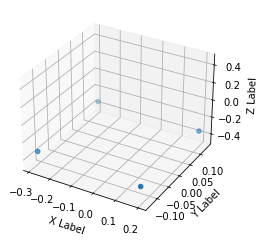


FL before: -0.337. FL after: -0.288214176893

FR before: -0.336. FR after: -0.325538486242

RL before: -0.343. RL after: -0.329890042543

RR before: -0.335. RR after: -0.288896054029
Footstep timestamp:  1628071700.12
Height check index:  889
Height check timestamp:  1628071700.24

FL moving: 0.048785823107000026. FR moving: 0.01046151375800003
RL moving: 0.013109957457000054. RR moving: 0.04610394597100004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.128, -0.337]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.132, -0.343]. Coord RR: [-0.287, -0.122, -0.335]

FR step_size x: 0.01912450933500001. FR step_size y: 0.023947955489. RL step_size x: 0.018623853683999936. RL step_size x: 0.04059020495400001.


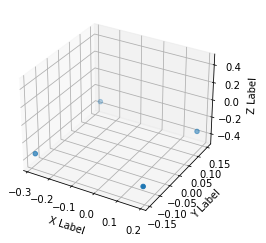


FL before: -0.336. FL after: -0.325458079576

FR before: -0.339. FR after: -0.288314521313

RL before: -0.336. RL after: -0.288743376732

RR before: -0.343. RR after: -0.331057280302
Footstep timestamp:  1628071700.44
Height check index:  906
Height check timestamp:  1628071700.58

FL moving: 0.01054192042400004. FR moving: 0.05068547868700002
RL moving: 0.04725662326800001. RR moving: 0.011942719698000037

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.336]. Coord FR: [0.187, -0.143, -0.339]. Coord RL: [-0.273, 0.148, -0.336]. Coord RR: [-0.284, -0.147, -0.343]

FR step_size x: 0.019771191239000008. FR step_size y: 0.02438437414199998. RL step_size x: 0.01823794102599996. RL step_size x: 0.040092585682.


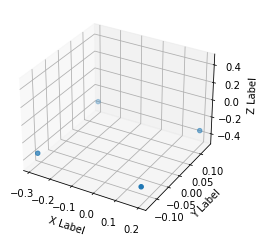


FL before: -0.342. FL after: -0.288428604603

FR before: -0.337. FR after: -0.325731933117

RL before: -0.344. RL after: -0.330216914415

RR before: -0.339. RR after: -0.288919657469
Footstep timestamp:  1628071700.76
Height check index:  921
Height check timestamp:  1628071700.88

FL moving: 0.05357139539700001. FR moving: 0.011268066883000027
RL moving: 0.013783085584999966. RR moving: 0.05008034253100002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.13, -0.344]. Coord RR: [-0.283, -0.125, -0.339]

FR step_size x: 0.019508601665000014. FR step_size y: 0.02412453424899999. RL step_size x: 0.016919715880999997. RL step_size x: 0.037283743620000004.


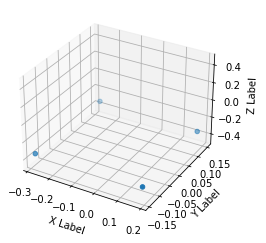


FL before: -0.336. FL after: -0.325644075871

FR before: -0.337. FR after: -0.28842818737

RL before: -0.334. RL after: -0.288258016109

RR before: -0.343. RR after: -0.330502927303
Footstep timestamp:  1628071701.08
Height check index:  937
Height check timestamp:  1628071701.2

FL moving: 0.010355924128999994. FR moving: 0.048571812630000044
RL moving: 0.04574198389100004. RR moving: 0.012497072697000011

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.144, -0.337]. Coord RL: [-0.274, 0.148, -0.334]. Coord RR: [-0.283, -0.145, -0.343]

FR step_size x: 0.018868376613000004. FR step_size y: 0.025712333798000003. RL step_size x: 0.018219899415999996. RL step_size x: 0.03900552022499998.


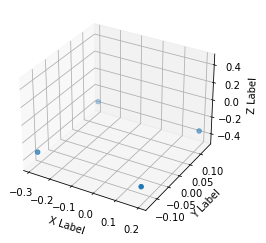


FL before: -0.339. FL after: -0.288729250431

FR before: -0.336. FR after: -0.325814396143

RL before: -0.344. RL after: -0.32998585701

RR before: -0.337. RR after: -0.28861066699
Footstep timestamp:  1628071701.42
Height check index:  955
Height check timestamp:  1628071701.56

FL moving: 0.05027074956900002. FR moving: 0.010185603857000014
RL moving: 0.014014142989999978. RR moving: 0.048389333010000035

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.339]. Coord FR: [0.192, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.286, -0.123, -0.337]

FR step_size x: 0.018930287600000012. FR step_size y: 0.024912654637999992. RL step_size x: 0.01869275665299991. RL step_size x: 0.037681319475.


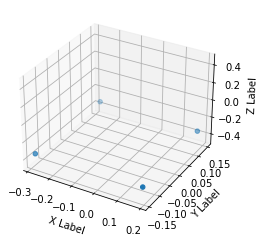


FL before: -0.337. FL after: -0.325384706259

FR before: -0.341. FR after: -0.288512796164

RL before: -0.338. RL after: -0.288517445326

RR before: -0.344. RR after: -0.330172866583
Footstep timestamp:  1628071701.74
Height check index:  971
Height check timestamp:  1628071701.88

FL moving: 0.01161529374100001. FR moving: 0.05248720383600003
RL moving: 0.049482554674000034. RR moving: 0.013827133416999982

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.284, -0.145, -0.344]

FR step_size x: 0.017843238354000007. FR step_size y: 0.02501350116700002. RL step_size x: 0.01802414488799997. RL step_size x: 0.039441323637999987.


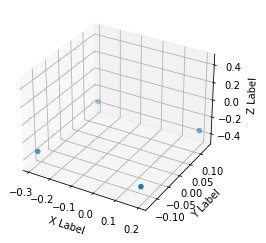


FL before: -0.337. FL after: -0.28863915801

FR before: -0.336. FR after: -0.325930833817

RL before: -0.343. RL after: -0.330602645874

RR before: -0.335. RR after: -0.289259105921
Footstep timestamp:  1628071702.06
Height check index:  986
Height check timestamp:  1628071702.18

FL moving: 0.048360841990000014. FR moving: 0.010069166183000022
RL moving: 0.012397354126000015. RR moving: 0.045740894079000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.289, 0.13, -0.343]. Coord RR: [-0.287, -0.121, -0.335]

FR step_size x: 0.01748705256000002. FR step_size y: 0.02505135464699998. RL step_size x: 0.019511813878999917. RL step_size x: 0.04226558113100001.


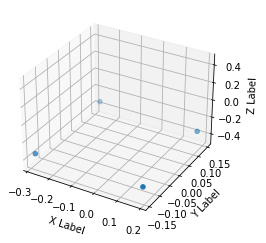


FL before: -0.337. FL after: -0.32556283474

FR before: -0.341. FR after: -0.288328826427

RL before: -0.337. RL after: -0.288839876652

RR before: -0.343. RR after: -0.330913513899
Footstep timestamp:  1628071702.38
Height check index:  1003
Height check timestamp:  1628071702.52

FL moving: 0.011437165260000048. FR moving: 0.05267117357300005
RL moving: 0.04816012334800002. RR moving: 0.012086486101000049

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.147, -0.337]. Coord RR: [-0.283, -0.146, -0.343]

FR step_size x: 0.017910025358000015. FR step_size y: 0.023604864597000008. RL step_size x: 0.017234098196000025. RL step_size x: 0.03810867893699997.


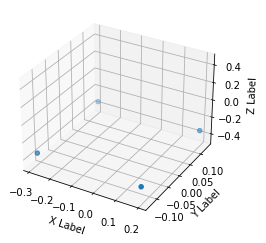


FL before: -0.342. FL after: -0.288232684135

FR before: -0.337. FR after: -0.325575947762

RL before: -0.344. RL after: -0.329783052206

RR before: -0.339. RR after: -0.289069771767
Footstep timestamp:  1628071702.7
Height check index:  1019
Height check timestamp:  1628071702.84

FL moving: 0.053767315865000054. FR moving: 0.011424052238000026
RL moving: 0.014216947793999957. RR moving: 0.04993022823300003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.284, -0.125, -0.339]

FR step_size x: 0.01898199462900002. FR step_size y: 0.023500816345999986. RL step_size x: 0.017387627601999966. RL step_size x: 0.038784260749999994.


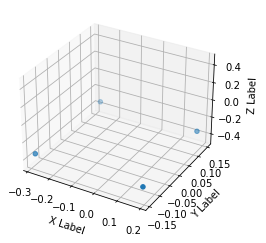


FL before: -0.337. FL after: -0.325766772032

FR before: -0.341. FR after: -0.288530945778

RL before: -0.338. RL after: -0.288348138332

RR before: -0.344. RR after: -0.330869138241
Footstep timestamp:  1628071703.04
Height check index:  1035
Height check timestamp:  1628071703.16

FL moving: 0.011233227968000026. FR moving: 0.052469054222000044
RL moving: 0.04965186166800001. RR moving: 0.013130861758999968

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.273, 0.147, -0.338]. Coord RR: [-0.284, -0.146, -0.344]

FR step_size x: 0.01874562084699999. FR step_size y: 0.02470978569899998. RL step_size x: 0.01791153478600005. RL step_size x: 0.03902368473999998.


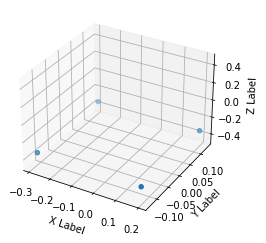


FL before: -0.341. FL after: -0.288984686136

FR before: -0.337. FR after: -0.326012998819

RL before: -0.344. RL after: -0.330279260874

RR before: -0.338. RR after: -0.28872615099
Footstep timestamp:  1628071703.34
Height check index:  1050
Height check timestamp:  1628071703.46

FL moving: 0.052015313864000046. FR moving: 0.010987001181000045
RL moving: 0.01372073912599997. RR moving: 0.04927384901000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.341]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.285, -0.124, -0.338]

FR step_size x: 0.018090860486000004. FR step_size y: 0.024183093785999976. RL step_size x: 0.018008899687999957. RL step_size x: 0.03711137986100002.


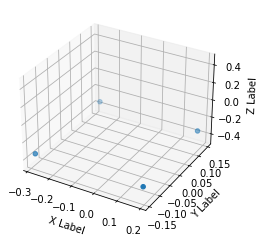


FL before: -0.337. FL after: -0.326013684273

FR before: -0.342. FR after: -0.28916439414

RL before: -0.339. RL after: -0.288806319237

RR before: -0.344. RR after: -0.331198900938
Footstep timestamp:  1628071703.68
Height check index:  1068
Height check timestamp:  1628071703.82

FL moving: 0.01098631572700004. FR moving: 0.05283560586000002
RL moving: 0.050193680763000015. RR moving: 0.012801099061999999

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.145, -0.339]. Coord RR: [-0.283, -0.146, -0.344]

FR step_size x: 0.01758322799199999. FR step_size y: 0.022700083016999995. RL step_size x: 0.017109226465000016. RL step_size x: 0.03857696688199998.


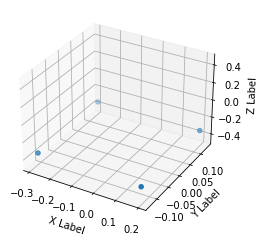


FL before: -0.341. FL after: -0.28928616643

FR before: -0.337. FR after: -0.326148897409

RL before: -0.345. RL after: -0.33084282279

RR before: -0.339. RR after: -0.289224922657
Footstep timestamp:  1628071704.0
Height check index:  1084
Height check timestamp:  1628071704.14

FL moving: 0.051713833570000034. FR moving: 0.010851102591000028
RL moving: 0.014157177209999983. RR moving: 0.04977507734300002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.341]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.129, -0.345]. Coord RR: [-0.283, -0.124, -0.339]

FR step_size x: 0.020397187710000014. FR step_size y: 0.025133476971999996. RL step_size x: 0.01771198082000003. RL step_size x: 0.042458734035.


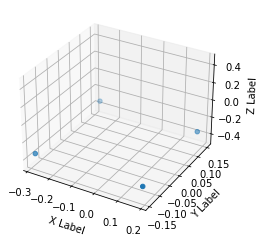


FL before: -0.336. FL after: -0.325080603361

FR before: -0.334. FR after: -0.288606286049

RL before: -0.331. RL after: -0.289267361164

RR before: -0.342. RR after: -0.329996734858
Footstep timestamp:  1628071704.36
Height check index:  1101
Height check timestamp:  1628071704.48

FL moving: 0.010919396639000045. FR moving: 0.045393713951
RL moving: 0.041732638836000036. RR moving: 0.012003265142000008

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.149, -0.331]. Coord RR: [-0.283, -0.146, -0.342]

FR step_size x: 0.019946354389000026. FR step_size y: 0.025881983518. RL step_size x: 0.018865268707999983. RL step_size x: 0.04161478400299998.


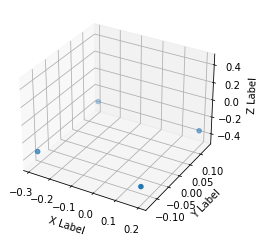


FL before: -0.337. FL after: -0.288937419653

FR before: -0.336. FR after: -0.325531184673

RL before: -0.343. RL after: -0.329047203064

RR before: -0.334. RR after: -0.288830280304
Footstep timestamp:  1628071704.68
Height check index:  1118
Height check timestamp:  1628071704.82

FL moving: 0.048062580347000006. FR moving: 0.010468815327000003
RL moving: 0.013952796936000045. RR moving: 0.04516971969600003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.289, 0.131, -0.343]. Coord RR: [-0.286, -0.122, -0.334]

FR step_size x: 0.018330219865000025. FR step_size y: 0.024915649772000004. RL step_size x: 0.017969202995999967. RL step_size x: 0.040760284780999995.


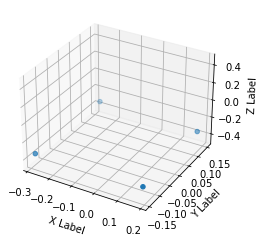


FL before: -0.337. FL after: -0.325612843037

FR before: -0.34. FR after: -0.288431733847

RL before: -0.337. RL after: -0.288179993629

RR before: -0.343. RR after: -0.330547600985
Footstep timestamp:  1628071705.0
Height check index:  1134
Height check timestamp:  1628071705.14

FL moving: 0.011387156963000022. FR moving: 0.05156826615300003
RL moving: 0.048820006371000035. RR moving: 0.012452399015000004

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.187, -0.143, -0.34]. Coord RL: [-0.274, 0.148, -0.337]. Coord RR: [-0.283, -0.146, -0.343]

FR step_size x: 0.018997346163. FR step_size y: 0.02544764649800002. RL step_size x: 0.01909307765899998. RL step_size x: 0.04270600551399997.


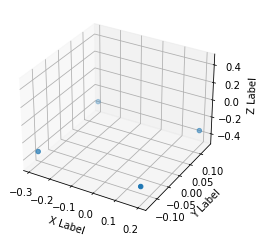


FL before: -0.337. FL after: -0.288953006268

FR before: -0.336. FR after: -0.325316756964

RL before: -0.344. RL after: -0.329082846642

RR before: -0.335. RR after: -0.289855003357
Footstep timestamp:  1628071705.32
Height check index:  1149
Height check timestamp:  1628071705.44

FL moving: 0.048046993732. FR moving: 0.010683243036000045
RL moving: 0.01491715335799998. RR moving: 0.045144996643000035

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.286, -0.121, -0.335]

FR step_size x: 0.018543691874000012. FR step_size y: 0.025164871692999996. RL step_size x: 0.019702250718999947. RL step_size x: 0.04390149021099998.


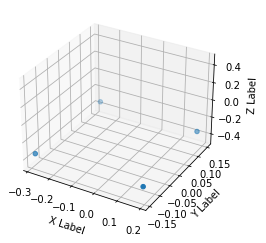


FL before: -0.337. FL after: -0.325905710459

FR before: -0.341. FR after: -0.289215058088

RL before: -0.338. RL after: -0.288783192635

RR before: -0.343. RR after: -0.331157982349
Footstep timestamp:  1628071705.64
Height check index:  1166
Height check timestamp:  1628071705.78

FL moving: 0.011094289541000002. FR moving: 0.051784941912000004
RL moving: 0.049216807365000004. RR moving: 0.011842017651000014

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.273, 0.148, -0.338]. Coord RR: [-0.284, -0.147, -0.343]

FR step_size x: 0.01791167938700003. FR step_size y: 0.02556381595099999. RL step_size x: 0.01937256383899999. RL step_size x: 0.043994022606999986.


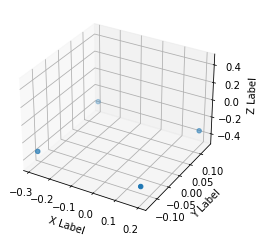


FL before: -0.337. FL after: -0.289179265499

FR before: -0.336. FR after: -0.326030761003

RL before: -0.344. RL after: -0.330917268991

RR before: -0.335. RR after: -0.289534002542
Footstep timestamp:  1628071705.96
Height check index:  1182
Height check timestamp:  1628071706.1

FL moving: 0.047820734500999995. FR moving: 0.00996923899700003
RL moving: 0.013082731008999982. RR moving: 0.04546599745800001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.289, 0.13, -0.344]. Coord RR: [-0.287, -0.121, -0.335]

FR step_size x: 0.01904982471400002. FR step_size y: 0.02589590573300002. RL step_size x: 0.019186938762999983. RL step_size x: 0.04332828724400001.


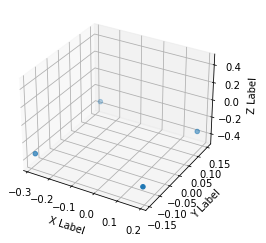


FL before: -0.336. FL after: -0.325459867716

FR before: -0.34. FR after: -0.288419514894

RL before: -0.336. RL after: -0.288130968809

RR before: -0.343. RR after: -0.330435216427
Footstep timestamp:  1628071706.28
Height check index:  1197
Height check timestamp:  1628071706.4

FL moving: 0.010540132284000026. FR moving: 0.05158048510600005
RL moving: 0.047869031191. RR moving: 0.012564783573000005

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.143, -0.34]. Coord RL: [-0.273, 0.148, -0.336]. Coord RR: [-0.284, -0.146, -0.343]

FR step_size x: 0.018740703462999997. FR step_size y: 0.025250846862999998. RL step_size x: 0.01870791244500003. RL step_size x: 0.040185697615.


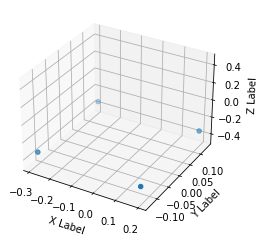


FL before: -0.339. FL after: -0.288736522198

FR before: -0.336. FR after: -0.325822591782

RL before: -0.344. RL after: -0.330692082644

RR before: -0.336. RR after: -0.289175242186
Footstep timestamp:  1628071706.62
Height check index:  1214
Height check timestamp:  1628071706.74

FL moving: 0.05026347780200002. FR moving: 0.010177408218000006
RL moving: 0.013307917355999954. RR moving: 0.04682475781400003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.128, -0.339]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.285, -0.123, -0.336]

FR step_size x: 0.018139006138000013. FR step_size y: 0.023998498201. RL step_size x: 0.01860819458999996. RL step_size x: 0.039774753809.


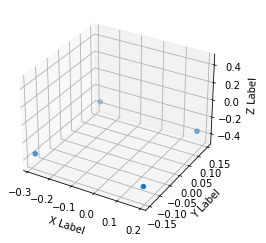


FL before: -0.337. FL after: -0.326917976141

FR before: -0.342. FR after: -0.291370719671

RL before: -0.338. RL after: -0.290711671114

RR before: -0.344. RR after: -0.332957863808
Footstep timestamp:  1628071706.92
Height check index:  1230
Height check timestamp:  1628071707.06

FL moving: 0.010082023859000033. FR moving: 0.05062928032900005
RL moving: 0.04728832888600004. RR moving: 0.011042136191999952

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.147, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.018058975339000027. FR step_size y: 0.023278754710999994. RL step_size x: 0.018215160847000034. RL step_size x: 0.04144449555899998.


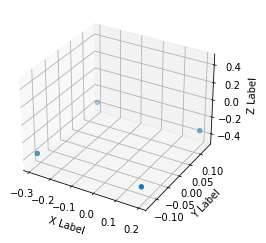


FL before: -0.343. FL after: -0.292840719223

FR before: -0.337. FR after: -0.327609151602

RL before: -0.345. RL after: -0.333096265793

RR before: -0.34. RR after: -0.292290151119
Footstep timestamp:  1628071707.24
Height check index:  1246
Height check timestamp:  1628071707.38

FL moving: 0.05015928077700005. FR moving: 0.009390848398000029
RL moving: 0.011903734206999972. RR moving: 0.04770984888100005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.343]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.291, 0.128, -0.345]. Coord RR: [-0.284, -0.125, -0.34]

FR step_size x: 0.018104035139000024. FR step_size y: 0.023086206435999984. RL step_size x: 0.018257708073000034. RL step_size x: 0.04024558377199999.


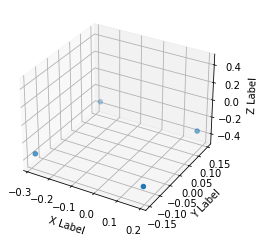


FL before: -0.337. FL after: -0.326004415751

FR before: -0.342. FR after: -0.28959184885

RL before: -0.338. RL after: -0.289647251368

RR before: -0.344. RR after: -0.331915974617
Footstep timestamp:  1628071707.56
Height check index:  1261
Height check timestamp:  1628071707.68

FL moving: 0.010995584249000045. FR moving: 0.052408151150000026
RL moving: 0.04835274863200001. RR moving: 0.012084025382999963

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.018823151588999998. FR step_size y: 0.023479458450999996. RL step_size x: 0.017779540300000007. RL step_size x: 0.038355099439999985.


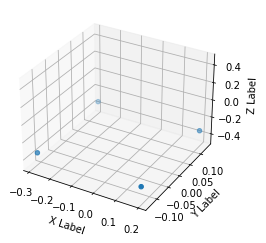


FL before: -0.341. FL after: -0.290349841118

FR before: -0.336. FR after: -0.326465964317

RL before: -0.344. RL after: -0.331581532955

RR before: -0.339. RR after: -0.290003538132
Footstep timestamp:  1628071707.91
Height check index:  1279
Height check timestamp:  1628071708.04

FL moving: 0.05065015888200003. FR moving: 0.009534035683000042
RL moving: 0.012418467044999992. RR moving: 0.048996461867999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.341]. Coord FR: [0.192, -0.128, -0.336]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.285, -0.124, -0.339]

FR step_size x: 0.01851138615600001. FR step_size y: 0.02420014071399998. RL step_size x: 0.016995412110999975. RL step_size x: 0.038337939143000016.


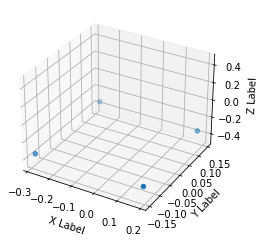


FL before: -0.337. FL after: -0.326491177082

FR before: -0.342. FR after: -0.290859013796

RL before: -0.339. RL after: -0.290897369385

RR before: -0.344. RR after: -0.332576006651
Footstep timestamp:  1628071708.22
Height check index:  1294
Height check timestamp:  1628071708.35

FL moving: 0.010508822918000038. FR moving: 0.05114098620400004
RL moving: 0.04810263061500003. RR moving: 0.011423993348999961

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.275, 0.145, -0.339]. Coord RR: [-0.283, -0.147, -0.344]

FR step_size x: 0.017860804795999996. FR step_size y: 0.02155474996500001. RL step_size x: 0.018323747635. RL step_size x: 0.03673603069699999.


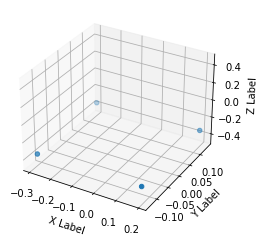


FL before: -0.34. FL after: -0.291357636452

FR before: -0.336. FR after: -0.326846659184

RL before: -0.344. RL after: -0.332338452339

RR before: -0.339. RR after: -0.291480362415
Footstep timestamp:  1628071708.55
Height check index:  1311
Height check timestamp:  1628071708.68

FL moving: 0.048642363548. FR moving: 0.009153340816
RL moving: 0.011661547660999971. RR moving: 0.047519637584999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.133, -0.34]. Coord FR: [0.192, -0.127, -0.336]. Coord RL: [-0.293, 0.127, -0.344]. Coord RR: [-0.283, -0.128, -0.339]

FR step_size x: 0.018469813943000013. FR step_size y: 0.02088742494599999. RL step_size x: 0.019133905172000032. RL step_size x: 0.037256250978000005.


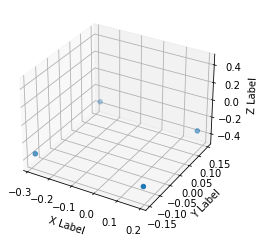


FL before: -0.337. FL after: -0.326222300529

FR before: -0.342. FR after: -0.289715528488

RL before: -0.339. RL after: -0.289890676737

RR before: -0.344. RR after: -0.332055389881
Footstep timestamp:  1628071708.87
Height check index:  1326
Height check timestamp:  1628071708.99

FL moving: 0.010777699471000046. FR moving: 0.05228447151200005
RL moving: 0.04910932326300005. RR moving: 0.011944610118999999

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.145, -0.339]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.019052942394999994. FR step_size y: 0.02381668663. RL step_size x: 0.01719811391799997. RL step_size x: 0.03824805152399999.


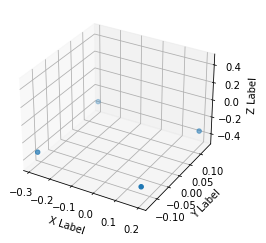


FL before: -0.34. FL after: -0.290939867496

FR before: -0.337. FR after: -0.326714783907

RL before: -0.344. RL after: -0.331696301699

RR before: -0.337. RR after: -0.290363013744
Footstep timestamp:  1628071709.21
Height check index:  1344
Height check timestamp:  1628071709.35

FL moving: 0.04906013250400004. FR moving: 0.010285216093000038
RL moving: 0.012303698300999977. RR moving: 0.046636986256000046

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.34]. Coord FR: [0.192, -0.129, -0.337]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.286, -0.123, -0.337]

FR step_size x: 0.019758181213999998. FR step_size y: 0.023786126852000017. RL step_size x: 0.018935854196999946. RL step_size x: 0.039147832155999984.


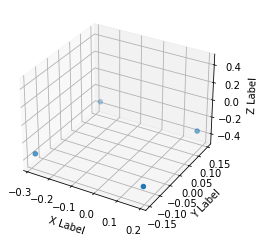


FL before: -0.337. FL after: -0.326858192682

FR before: -0.342. FR after: -0.291443228722

RL before: -0.338. RL after: -0.291274547577

RR before: -0.344. RR after: -0.332776665688
Footstep timestamp:  1628071709.53
Height check index:  1359
Height check timestamp:  1628071709.65

FL moving: 0.010141807318000018. FR moving: 0.05055677127800001
RL moving: 0.046725452423000025. RR moving: 0.011223334311999955

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.01826669752600002. FR step_size y: 0.02302357232499999. RL step_size x: 0.017160259246999987. RL step_size x: 0.04058134037199998.


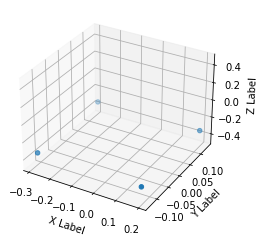


FL before: -0.342. FL after: -0.289306133986

FR before: -0.337. FR after: -0.326225340366

RL before: -0.345. RL after: -0.33074387908

RR before: -0.339. RR after: -0.289106577635
Footstep timestamp:  1628071709.87
Height check index:  1376
Height check timestamp:  1628071709.99

FL moving: 0.052693866014. FR moving: 0.010774659634000039
RL moving: 0.014256120919999948. RR moving: 0.04989342236500005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.129, -0.345]. Coord RR: [-0.284, -0.124, -0.339]

FR step_size x: 0.01832560050500001. FR step_size y: 0.024425254583999995. RL step_size x: 0.018114565848999953. RL step_size x: 0.041731214642.


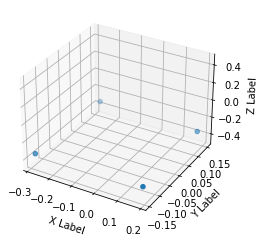


FL before: -0.336. FL after: -0.325538814068

FR before: -0.339. FR after: -0.288314402103

RL before: -0.336. RL after: -0.288207888603

RR before: -0.343. RR after: -0.330227077007
Footstep timestamp:  1628071710.19
Height check index:  1393
Height check timestamp:  1628071710.33

FL moving: 0.010461185932000017. FR moving: 0.050685597897
RL moving: 0.047792111397000014. RR moving: 0.012772922993000035

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.143, -0.339]. Coord RL: [-0.273, 0.148, -0.336]. Coord RR: [-0.283, -0.146, -0.343]

FR step_size x: 0.01857132196400002. FR step_size y: 0.025183702231. RL step_size x: 0.020239347458000045. RL step_size x: 0.04264113330799997.


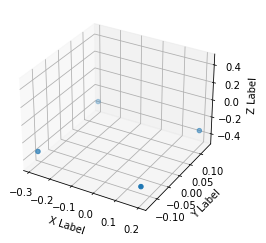


FL before: -0.337. FL after: -0.288694560528

FR before: -0.336. FR after: -0.325965225697

RL before: -0.343. RL after: -0.330061346292

RR before: -0.335. RR after: -0.288597553968
Footstep timestamp:  1628071710.53
Height check index:  1409
Height check timestamp:  1628071710.65

FL moving: 0.048305439472. FR moving: 0.010034774303000038
RL moving: 0.012938653708000014. RR moving: 0.046402446032

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.29, 0.13, -0.343]. Coord RR: [-0.287, -0.121, -0.335]

FR step_size x: 0.018156114697000014. FR step_size y: 0.024430169939999996. RL step_size x: 0.021078356026999978. RL step_size x: 0.04301376843400001.


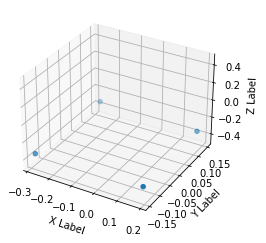


FL before: -0.337. FL after: -0.32623526454

FR before: -0.341. FR after: -0.289697527885

RL before: -0.337. RL after: -0.289057314396

RR before: -0.343. RR after: -0.331792891026
Footstep timestamp:  1628071710.85
Height check index:  1425
Height check timestamp:  1628071710.97

FL moving: 0.010764735460000008. FR moving: 0.05130247211500005
RL moving: 0.047942685604. RR moving: 0.011207108974000013

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.273, 0.147, -0.337]. Coord RR: [-0.283, -0.147, -0.343]

FR step_size x: 0.018840138913000015. FR step_size y: 0.02487222325799998. RL step_size x: 0.019846463441999973. RL step_size x: 0.04063595855299999.


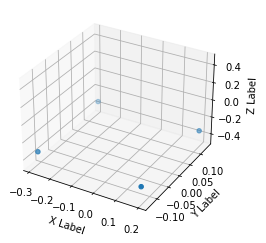


FL before: -0.337. FL after: -0.289666682482

FR before: -0.336. FR after: -0.326172530651

RL before: -0.343. RL after: -0.331204801798

RR before: -0.335. RR after: -0.289962679148
Footstep timestamp:  1628071711.17
Height check index:  1442
Height check timestamp:  1628071711.31

FL moving: 0.04733331751800002. FR moving: 0.009827469349000029
RL moving: 0.011795198202000035. RR moving: 0.04503732085200002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.337]. Coord FR: [0.192, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.343]. Coord RR: [-0.286, -0.122, -0.335]

FR step_size x: 0.02047491216700001. FR step_size y: 0.02616877782400001. RL step_size x: 0.01838841533699992. RL step_size x: 0.042670062302999995.


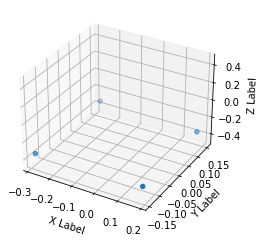


FL before: -0.336. FL after: -0.325471580029

FR before: -0.334. FR after: -0.288389205933

RL before: -0.331. RL after: -0.288130134344

RR before: -0.342. RR after: -0.330486744642
Footstep timestamp:  1628071711.51
Height check index:  1458
Height check timestamp:  1628071711.63

FL moving: 0.010528419971000014. FR moving: 0.04561079406700003
RL moving: 0.04286986565600004. RR moving: 0.011513255358000019

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.15, -0.331]. Coord RR: [-0.284, -0.146, -0.342]

FR step_size x: 0.02093881440199999. FR step_size y: 0.025748588323000005. RL step_size x: 0.01748078894599997. RL step_size x: 0.04213477289699999.


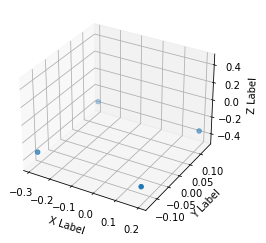


FL before: -0.339. FL after: -0.288734525442

FR before: -0.336. FR after: -0.325774490833

RL before: -0.344. RL after: -0.330063134432

RR before: -0.337. RR after: -0.288487583399
Footstep timestamp:  1628071711.83
Height check index:  1474
Height check timestamp:  1628071711.95

FL moving: 0.05026547455800001. FR moving: 0.010225509167000046
RL moving: 0.013936865567999945. RR moving: 0.04851241660100003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.339]. Coord FR: [0.192, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.286, -0.123, -0.337]

FR step_size x: 0.01973275983299999. FR step_size y: 0.026271700143999988. RL step_size x: 0.01760199165299997. RL step_size x: 0.040986635446999986.


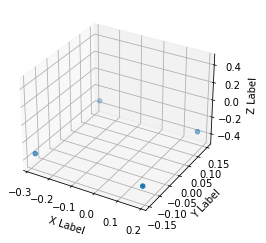


FL before: -0.335. FL after: -0.325180649757

FR before: -0.33. FR after: -0.288227438927

RL before: -0.328. RL after: -0.288839071989

RR before: -0.342. RR after: -0.330375909805
Footstep timestamp:  1628071712.15
Height check index:  1491
Height check timestamp:  1628071712.29

FL moving: 0.009819350243000013. FR moving: 0.041772561073000036
RL moving: 0.03916092801100002. RR moving: 0.011624090195000047

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.184, 0.139, -0.335]. Coord FR: [0.186, -0.144, -0.33]. Coord RL: [-0.275, 0.149, -0.328]. Coord RR: [-0.283, -0.146, -0.342]

FR step_size x: 0.018125896454000007. FR step_size y: 0.024706430912000005. RL step_size x: 0.018473027468000003. RL step_size x: 0.04233798205799999.


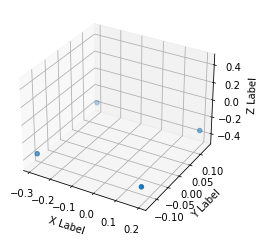


FL before: -0.341. FL after: -0.288695514202

FR before: -0.337. FR after: -0.325842320919

RL before: -0.345. RL after: -0.330563127995

RR before: -0.34. RR after: -0.289379954338
Footstep timestamp:  1628071712.45
Height check index:  1506
Height check timestamp:  1628071712.59

FL moving: 0.05230448579800001. FR moving: 0.011157679081000016
RL moving: 0.01443687200499999. RR moving: 0.05062004566200001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.132, -0.341]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.127, -0.345]. Coord RR: [-0.284, -0.126, -0.34]

FR step_size x: 0.018910366774000015. FR step_size y: 0.024481210470000014. RL step_size x: 0.018859023808999953. RL step_size x: 0.04282585394299998.


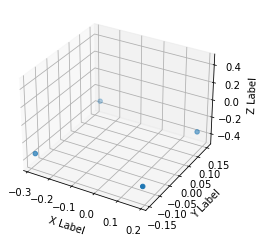


FL before: -0.336. FL after: -0.325470209122

FR before: -0.334. FR after: -0.288362056017

RL before: -0.331. RL after: -0.288110435009

RR before: -0.342. RR after: -0.330298006535
Footstep timestamp:  1628071712.81
Height check index:  1523
Height check timestamp:  1628071712.93

FL moving: 0.010529790878000045. FR moving: 0.04563794398300003
RL moving: 0.042889564990999995. RR moving: 0.011701993465000005

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.15, -0.331]. Coord RR: [-0.284, -0.146, -0.342]

FR step_size x: 0.019513550162000015. FR step_size y: 0.02586125600299999. RL step_size x: 0.01755550336799999. RL step_size x: 0.04249117886999999.


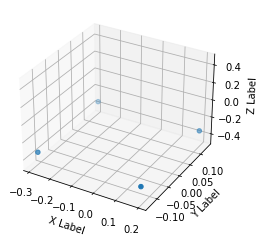


FL before: -0.34. FL after: -0.288520276546

FR before: -0.336. FR after: -0.325743407011

RL before: -0.344. RL after: -0.329788506031

RR before: -0.337. RR after: -0.288341611624
Footstep timestamp:  1628071713.13
Height check index:  1540
Height check timestamp:  1628071713.27

FL moving: 0.05147972345400004. FR moving: 0.010256592989000002
RL moving: 0.014211493968999955. RR moving: 0.048658388376000006

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.34]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.285, -0.123, -0.337]

FR step_size x: 0.018842670798000005. FR step_size y: 0.024171368598999987. RL step_size x: 0.017499995230999932. RL step_size x: 0.03853414273299999.


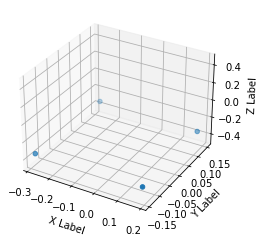


FL before: -0.336. FL after: -0.326056092978

FR before: -0.337. FR after: -0.289691537619

RL before: -0.335. RL after: -0.289863556623

RR before: -0.343. RR after: -0.3319465518
Footstep timestamp:  1628071713.45
Height check index:  1556
Height check timestamp:  1628071713.59

FL moving: 0.009943907022000043. FR moving: 0.047308462381000005
RL moving: 0.04513644337700001. RR moving: 0.011053448200000038

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.144, -0.337]. Coord RL: [-0.274, 0.148, -0.335]. Coord RR: [-0.283, -0.145, -0.343]

FR step_size x: 0.019250800014000008. FR step_size y: 0.026445441127000008. RL step_size x: 0.019378881931000014. RL step_size x: 0.04174505400699999.


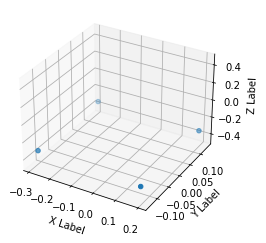


FL before: -0.334. FL after: -0.288184553385

FR before: -0.336. FR after: -0.325654119253

RL before: -0.343. RL after: -0.329745233059

RR before: -0.332. RR after: -0.288989692926
Footstep timestamp:  1628071713.79
Height check index:  1572
Height check timestamp:  1628071713.91

FL moving: 0.04581544661500003. FR moving: 0.010345880747000047
RL moving: 0.013254766941000029. RR moving: 0.043010307074

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.131, -0.343]. Coord RR: [-0.288, -0.12, -0.332]

FR step_size x: 0.02014407658600001. FR step_size y: 0.025446771859999995. RL step_size x: 0.018954076290999988. RL step_size x: 0.04367333853300001.


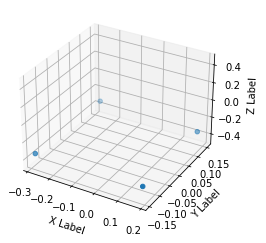


FL before: -0.336. FL after: -0.325603783131

FR before: -0.334. FR after: -0.288464337587

RL before: -0.331. RL after: -0.288266032934

RR before: -0.342. RR after: -0.33035415411
Footstep timestamp:  1628071714.11
Height check index:  1588
Height check timestamp:  1628071714.23

FL moving: 0.010396216868999997. FR moving: 0.045535662413
RL moving: 0.04273396706600002. RR moving: 0.011645845890000006

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.149, -0.331]. Coord RR: [-0.284, -0.146, -0.342]

FR step_size x: 0.01968565857399998. FR step_size y: 0.026651881813999995. RL step_size x: 0.017801491737999997. RL step_size x: 0.04182293832299999.


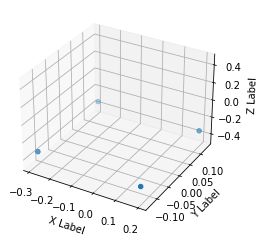


FL before: -0.337. FL after: -0.288430273533

FR before: -0.336. FR after: -0.325713127851

RL before: -0.343. RL after: -0.330352783203

RR before: -0.334. RR after: -0.28901514411
Footstep timestamp:  1628071714.43
Height check index:  1605
Height check timestamp:  1628071714.57

FL moving: 0.04856972646700003. FR moving: 0.010286872149000037
RL moving: 0.012647216797000038. RR moving: 0.04498485589000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.343]. Coord RR: [-0.286, -0.122, -0.334]

FR step_size x: 0.019434498191000016. FR step_size y: 0.025135501503000007. RL step_size x: 0.01846447086299996. RL step_size x: 0.03942271184900001.


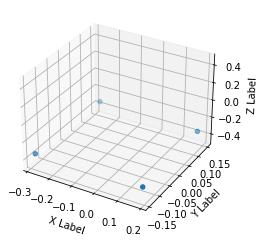


FL before: -0.337. FL after: -0.325514018536

FR before: -0.34. FR after: -0.288441836834

RL before: -0.337. RL after: -0.288306891918

RR before: -0.344. RR after: -0.330375552177
Footstep timestamp:  1628071714.75
Height check index:  1621
Height check timestamp:  1628071714.89

FL moving: 0.011485981464000039. FR moving: 0.05155816316600004
RL moving: 0.048693108082. RR moving: 0.013624447822999985

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.187, -0.143, -0.34]. Coord RL: [-0.274, 0.147, -0.337]. Coord RR: [-0.283, -0.145, -0.344]

FR step_size x: 0.019550000429000014. FR step_size y: 0.024664515972000006. RL step_size x: 0.019294541358999995. RL step_size x: 0.03988481742099999.


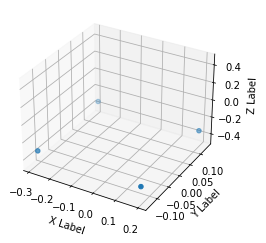


FL before: -0.334. FL after: -0.288894027472

FR before: -0.336. FR after: -0.326104402542

RL before: -0.342. RL after: -0.330204039812

RR before: -0.332. RR after: -0.288812786341
Footstep timestamp:  1628071715.09
Height check index:  1637
Height check timestamp:  1628071715.21

FL moving: 0.04510597252800003. FR moving: 0.009895597458000005
RL moving: 0.011795960187999999. RR moving: 0.04318721365900002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.192, -0.13, -0.336]. Coord RL: [-0.289, 0.131, -0.342]. Coord RR: [-0.288, -0.121, -0.332]

FR step_size x: 0.02077642023500001. FR step_size y: 0.02606201100399999. RL step_size x: 0.01898164343899994. RL step_size x: 0.040822420597.


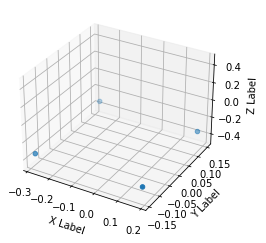


FL before: -0.336. FL after: -0.325042128563

FR before: -0.337. FR after: -0.291544109583

RL before: -0.335. RL after: -0.291633069515

RR before: -0.343. RR after: -0.329129815102
Footstep timestamp:  1628071715.41
Height check index:  1654
Height check timestamp:  1628071715.55

FL moving: 0.010957871437. FR moving: 0.045455890417000044
RL moving: 0.04336693048500001. RR moving: 0.013870184898000015

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.337]. Coord RL: [-0.275, 0.148, -0.335]. Coord RR: [-0.283, -0.145, -0.343]

FR step_size x: 0.019638332486000026. FR step_size y: 0.025447078227999992. RL step_size x: 0.01700153780000002. RL step_size x: 0.03903757262299999.


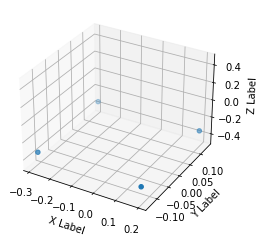


FL before: -0.34. FL after: -0.288422554731

FR before: -0.337. FR after: -0.325724631548

RL before: -0.344. RL after: -0.330072343349

RR before: -0.337. RR after: -0.289137065411
Footstep timestamp:  1628071715.71
Height check index:  1669
Height check timestamp:  1628071715.85

FL moving: 0.051577445269000044. FR moving: 0.011275368452
RL moving: 0.013927656650999987. RR moving: 0.04786293458900004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.34]. Coord FR: [0.192, -0.129, -0.337]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.285, -0.123, -0.337]

FR step_size x: 0.020219923495999992. FR step_size y: 0.024337978481999978. RL step_size x: 0.017494571208999943. RL step_size x: 0.03847404634900001.


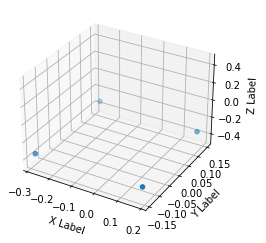


FL before: -0.336. FL after: -0.325523525476

FR before: -0.337. FR after: -0.288400113583

RL before: -0.334. RL after: -0.289002239704

RR before: -0.343. RR after: -0.330887287855
Footstep timestamp:  1628071716.05
Height check index:  1685
Height check timestamp:  1628071716.17

FL moving: 0.010476474524000023. FR moving: 0.04859988641700003
RL moving: 0.044997760296. RR moving: 0.012112712145000037

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.138, -0.336]. Coord FR: [0.186, -0.144, -0.337]. Coord RL: [-0.274, 0.148, -0.334]. Coord RR: [-0.283, -0.145, -0.343]

FR step_size x: 0.019894555926000007. FR step_size y: 0.02381716144099999. RL step_size x: 0.01719684529300003. RL step_size x: 0.04014310467199998.


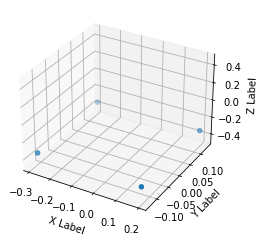


FL before: -0.342. FL after: -0.288745552301

FR before: -0.337. FR after: -0.325930863619

RL before: -0.345. RL after: -0.330472677946

RR before: -0.34. RR after: -0.289432942867
Footstep timestamp:  1628071716.37
Height check index:  1701
Height check timestamp:  1628071716.49

FL moving: 0.05325444769900001. FR moving: 0.011069136381000044
RL moving: 0.01452732205399998. RR moving: 0.050567057133000026

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.128, -0.345]. Coord RR: [-0.284, -0.124, -0.34]

FR step_size x: 0.016933697939000014. FR step_size y: 0.023510293483999994. RL step_size x: 0.017390429018999953. RL step_size x: 0.040912259698.


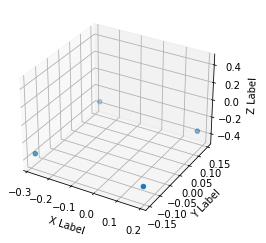


FL before: -0.337. FL after: -0.32610142231

FR before: -0.342. FR after: -0.289647787809

RL before: -0.339. RL after: -0.289800524712

RR before: -0.343. RR after: -0.331662833691
Footstep timestamp:  1628071716.69
Height check index:  1718
Height check timestamp:  1628071716.83

FL moving: 0.010898577690000022. FR moving: 0.052352212191
RL moving: 0.049199475288000005. RR moving: 0.011337166309000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.146, -0.339]. Coord RR: [-0.282, -0.147, -0.343]

FR step_size x: 0.017245657085999982. FR step_size y: 0.022586923598999997. RL step_size x: 0.01883857870100003. RL step_size x: 0.03826752531599997.


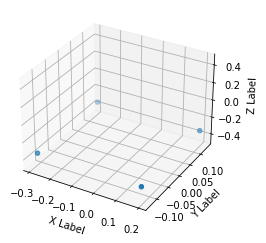


FL before: -0.342. FL after: -0.289703160524

FR before: -0.336. FR after: -0.326279431581

RL before: -0.345. RL after: -0.331263363361

RR before: -0.339. RR after: -0.289396584034
Footstep timestamp:  1628071717.01
Height check index:  1733
Height check timestamp:  1628071717.13

FL moving: 0.052296839476. FR moving: 0.009720568419000042
RL moving: 0.013736636638999988. RR moving: 0.04960341596600004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.192, -0.128, -0.336]. Coord RL: [-0.291, 0.129, -0.345]. Coord RR: [-0.284, -0.125, -0.339]

FR step_size x: 0.019106644869000017. FR step_size y: 0.024297255635000015. RL step_size x: 0.017404031752999927. RL step_size x: 0.039428376317.


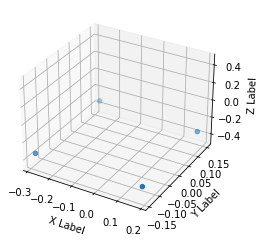


FL before: -0.335. FL after: -0.325448930264

FR before: -0.331. FR after: -0.288481920958

RL before: -0.329. RL after: -0.288442879915

RR before: -0.342. RR after: -0.329930961132
Footstep timestamp:  1628071717.37
Height check index:  1751
Height check timestamp:  1628071717.49

FL moving: 0.009551069736000006. FR moving: 0.042518079042
RL moving: 0.04055712008500001. RR moving: 0.012069038868000037

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.335]. Coord FR: [0.186, -0.145, -0.331]. Coord RL: [-0.275, 0.149, -0.329]. Coord RR: [-0.283, -0.144, -0.342]

FR step_size x: 0.019883098960000012. FR step_size y: 0.02677743697099999. RL step_size x: 0.017672835110999985. RL step_size x: 0.039575675904999996.


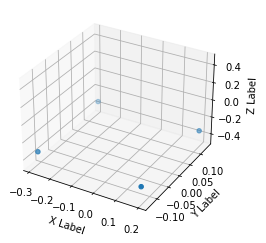


FL before: -0.337. FL after: -0.288619786501

FR before: -0.336. FR after: -0.325612396002

RL before: -0.343. RL after: -0.329320967197

RR before: -0.335. RR after: -0.288566589355
Footstep timestamp:  1628071717.69
Height check index:  1768
Height check timestamp:  1628071717.83

FL moving: 0.04838021349900001. FR moving: 0.010387603998000039
RL moving: 0.013679032803000035. RR moving: 0.046433410645000006

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.337]. Coord FR: [0.192, -0.129, -0.336]. Coord RL: [-0.29, 0.131, -0.343]. Coord RR: [-0.286, -0.122, -0.335]

FR step_size x: 0.019239337682000007. FR step_size y: 0.024280308962000008. RL step_size x: 0.019207085132999957. RL step_size x: 0.040908715247999994.


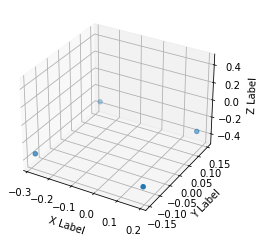


FL before: -0.337. FL after: -0.325138986111

FR before: -0.342. FR after: -0.28863710165

RL before: -0.338. RL after: -0.289190798998

RR before: -0.344. RR after: -0.329955607653
Footstep timestamp:  1628071718.01
Height check index:  1783
Height check timestamp:  1628071718.13

FL moving: 0.011861013889000016. FR moving: 0.05336289835000002
RL moving: 0.048809201002000036. RR moving: 0.014044392346999945

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.138, -0.337]. Coord FR: [0.188, -0.143, -0.342]. Coord RL: [-0.273, 0.147, -0.338]. Coord RR: [-0.283, -0.147, -0.344]

FR step_size x: 0.01837771117600001. FR step_size y: 0.024238627910999982. RL step_size x: 0.019076818466000012. RL step_size x: 0.042715780674999995.


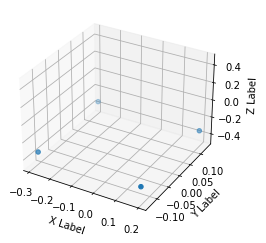


FL before: -0.339. FL after: -0.288742303848

FR before: -0.337. FR after: -0.325886547565

RL before: -0.344. RL after: -0.330002576113

RR before: -0.337. RR after: -0.288610249758
Footstep timestamp:  1628071718.33
Height check index:  1799
Height check timestamp:  1628071718.45

FL moving: 0.05025769615200004. FR moving: 0.011113452435000004
RL moving: 0.013997423886999982. RR moving: 0.04838975024200004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.339]. Coord FR: [0.191, -0.129, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.285, -0.122, -0.337]

FR step_size x: 0.017723489285000005. FR step_size y: 0.023656397342999985. RL step_size x: 0.018782866000999987. RL step_size x: 0.04161341893699999.


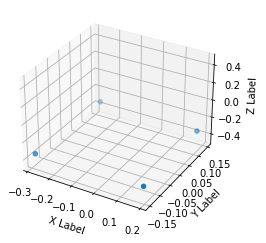


FL before: -0.337. FL after: -0.325605124235

FR before: -0.342. FR after: -0.288779318333

RL before: -0.338. RL after: -0.288954585791

RR before: -0.344. RR after: -0.331166863441
Footstep timestamp:  1628071718.65
Height check index:  1816
Height check timestamp:  1628071718.79

FL moving: 0.011394875765000034. FR moving: 0.053220681667
RL moving: 0.04904541420900005. RR moving: 0.01283313655899998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.189, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.148, -0.344]

FR step_size x: 0.017822361827000005. FR step_size y: 0.024357971310000004. RL step_size x: 0.019761007309000045. RL step_size x: 0.04094415181899998.


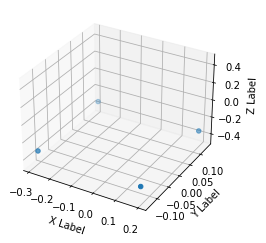


FL before: -0.334. FL after: -0.288304150105

FR before: -0.336. FR after: -0.325431406498

RL before: -0.343. RL after: -0.329632222652

RR before: -0.332. RR after: -0.288959026337
Footstep timestamp:  1628071718.97
Height check index:  1832
Height check timestamp:  1628071719.11

FL moving: 0.04569584989500003. FR moving: 0.010568593502000012
RL moving: 0.013367777348000043. RR moving: 0.043040973663000026

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.132, -0.343]. Coord RR: [-0.287, -0.121, -0.332]

FR step_size x: 0.01985755705800002. FR step_size y: 0.02622079777700001. RL step_size x: 0.01867866015499997. RL step_size x: 0.042332223177.


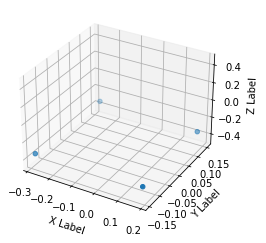


FL before: -0.336. FL after: -0.325303971767

FR before: -0.337. FR after: -0.28822478652

RL before: -0.334. RL after: -0.288556277752

RR before: -0.343. RR after: -0.330487728119
Footstep timestamp:  1628071719.32
Height check index:  1848
Height check timestamp:  1628071719.44

FL moving: 0.010696028233000032. FR moving: 0.048775213480000024
RL moving: 0.04544372224800003. RR moving: 0.012512271881000014

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.337]. Coord RL: [-0.274, 0.149, -0.334]. Coord RR: [-0.283, -0.146, -0.343]

FR step_size x: 0.020454737304999998. FR step_size y: 0.02625111508400002. RL step_size x: 0.020279835939000013. RL step_size x: 0.04341404706299998.


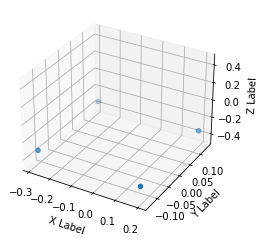


FL before: -0.33. FL after: -0.288854181767

FR before: -0.335. FR after: -0.325521290302

RL before: -0.342. RL after: -0.329210460186

RR before: -0.328. RR after: -0.288818329573
Footstep timestamp:  1628071719.64
Height check index:  1865
Height check timestamp:  1628071719.78

FL moving: 0.04114581823300001. FR moving: 0.00947870969800002
RL moving: 0.01278953981400005. RR moving: 0.03918167042699999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.199, 0.126, -0.33]. Coord FR: [0.191, -0.13, -0.335]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.288, -0.12, -0.328]

FR step_size x: 0.019376500845000033. FR step_size y: 0.025100526451999977. RL step_size x: 0.01955518913199994. RL step_size x: 0.04135980117299998.


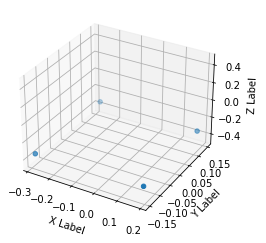


FL before: -0.337. FL after: -0.325279355049

FR before: -0.342. FR after: -0.288526028395

RL before: -0.339. RL after: -0.28833475709

RR before: -0.344. RR after: -0.329956233501
Footstep timestamp:  1628071719.96
Height check index:  1881
Height check timestamp:  1628071720.1

FL moving: 0.011720644951000003. FR moving: 0.053473971605000004
RL moving: 0.05066524291000002. RR moving: 0.014043766498999966

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.146, -0.339]. Coord RR: [-0.284, -0.148, -0.344]

FR step_size x: 0.019238730073000004. FR step_size y: 0.024263646959999996. RL step_size x: 0.018816499232999995. RL step_size x: 0.04052631580899997.


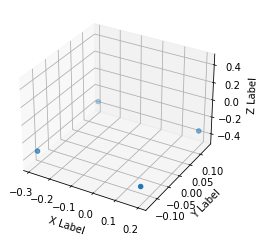


FL before: -0.334. FL after: -0.288314163685

FR before: -0.336. FR after: -0.325438648462

RL before: -0.343. RL after: -0.329550266266

RR before: -0.332. RR after: -0.289015740156
Footstep timestamp:  1628071720.3
Height check index:  1897
Height check timestamp:  1628071720.42

FL moving: 0.045685836315000006. FR moving: 0.01056135153800003
RL moving: 0.013449733734000047. RR moving: 0.042984259844000006

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.132, -0.343]. Coord RR: [-0.288, -0.122, -0.332]

FR step_size x: 0.020161928176999994. FR step_size y: 0.02542869675199999. RL step_size x: 0.018974252462999996. RL step_size x: 0.03872845387500001.


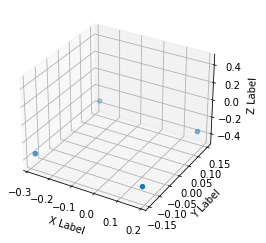


FL before: -0.336. FL after: -0.32521045208

FR before: -0.334. FR after: -0.289258867502

RL before: -0.331. RL after: -0.289298176765

RR before: -0.343. RR after: -0.329634219408
Footstep timestamp:  1628071720.62
Height check index:  1913
Height check timestamp:  1628071720.74

FL moving: 0.010789547920000031. FR moving: 0.04474113249799999
RL moving: 0.04170182323499999. RR moving: 0.013365780592000054

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.275, 0.148, -0.331]. Coord RR: [-0.283, -0.145, -0.343]

FR step_size x: 0.020364838601000024. FR step_size y: 0.02656837570699999. RL step_size x: 0.01875167918199999. RL step_size x: 0.04009353595899999.


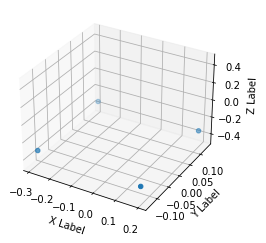


FL before: -0.33. FL after: -0.289013952017

FR before: -0.335. FR after: -0.326001524925

RL before: -0.342. RL after: -0.330282896757

RR before: -0.328. RR after: -0.288650542498
Footstep timestamp:  1628071720.94
Height check index:  1930
Height check timestamp:  1628071721.08

FL moving: 0.04098604798300004. FR moving: 0.008998475075000012
RL moving: 0.011717103243000015. RR moving: 0.03934945750200003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.126, -0.33]. Coord FR: [0.191, -0.13, -0.335]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.288, -0.121, -0.328]

FR step_size x: 0.019210250616000013. FR step_size y: 0.02575137937099997. RL step_size x: 0.019389070987999968. RL step_size x: 0.038838288307999985.


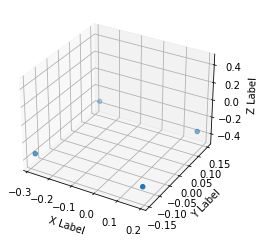


FL before: -0.336. FL after: -0.325677037239

FR before: -0.337. FR after: -0.288392901421

RL before: -0.334. RL after: -0.288896918297

RR before: -0.343. RR after: -0.33093085885
Footstep timestamp:  1628071721.26
Height check index:  1945
Height check timestamp:  1628071721.38

FL moving: 0.010322962761000032. FR moving: 0.04860709857900003
RL moving: 0.045103081703000036. RR moving: 0.012069141150000018

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.138, -0.336]. Coord FR: [0.187, -0.143, -0.337]. Coord RL: [-0.275, 0.147, -0.334]. Coord RR: [-0.283, -0.145, -0.343]

FR step_size x: 0.018636499642999987. FR step_size y: 0.023499396204999995. RL step_size x: 0.01638692450599999. RL step_size x: 0.03968213927799999.


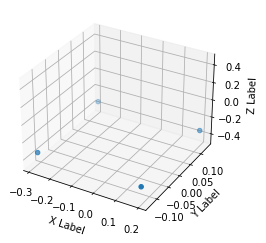


FL before: -0.341. FL after: -0.289369910955

FR before: -0.337. FR after: -0.32617855072

RL before: -0.344. RL after: -0.330631613731

RR before: -0.339. RR after: -0.289173275232
Footstep timestamp:  1628071721.58
Height check index:  1961
Height check timestamp:  1628071721.7

FL moving: 0.05163008904500005. FR moving: 0.010821449280000006
RL moving: 0.013368386268999999. RR moving: 0.04982672476800004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.341]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.129, -0.344]. Coord RR: [-0.285, -0.123, -0.339]

FR step_size x: 0.018951745271999998. FR step_size y: 0.02422010827099999. RL step_size x: 0.018400740623999934. RL step_size x: 0.041284326791999976.


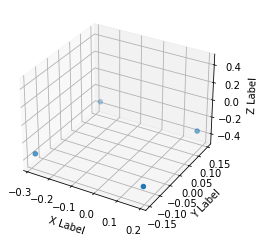


FL before: -0.337. FL after: -0.326170653105

FR before: -0.342. FR after: -0.289646923542

RL before: -0.338. RL after: -0.2891972363

RR before: -0.344. RR after: -0.331641107798
Footstep timestamp:  1628071721.9
Height check index:  1978
Height check timestamp:  1628071722.04

FL moving: 0.010829346895000036. FR moving: 0.052353076458000025
RL moving: 0.04880276370000003. RR moving: 0.012358892201999983

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.018735756278000004. FR step_size y: 0.023722034454999985. RL step_size x: 0.01789591837000004. RL step_size x: 0.03909562754599999.


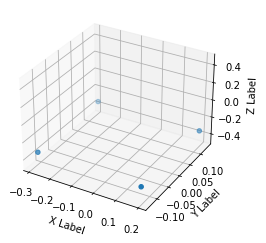


FL before: -0.34. FL after: -0.289819031954

FR before: -0.337. FR after: -0.326390624046

RL before: -0.343. RL after: -0.330910205841

RR before: -0.337. RR after: -0.289428055286
Footstep timestamp:  1628071722.22
Height check index:  1994
Height check timestamp:  1628071722.36

FL moving: 0.05018096804600003. FR moving: 0.010609375954000022
RL moving: 0.012089794159000022. RR moving: 0.047571944714

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.34]. Coord FR: [0.192, -0.129, -0.337]. Coord RL: [-0.29, 0.131, -0.343]. Coord RR: [-0.285, -0.123, -0.337]

FR step_size x: 0.020298705935000022. FR step_size y: 0.023595811248000004. RL step_size x: 0.016791296004999956. RL step_size x: 0.03902929341699998.


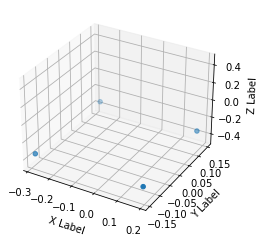


FL before: -0.337. FL after: -0.326078236103

FR before: -0.341. FR after: -0.289809525013

RL before: -0.338. RL after: -0.289785891771

RR before: -0.344. RR after: -0.331834375858
Footstep timestamp:  1628071722.54
Height check index:  2009
Height check timestamp:  1628071722.66

FL moving: 0.010921763897000003. FR moving: 0.05119047498700002
RL moving: 0.04821410822900002. RR moving: 0.012165624141999953

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.019886556029000024. FR step_size y: 0.025107452988999995. RL step_size x: 0.01758709383000001. RL step_size x: 0.04167862462999998.


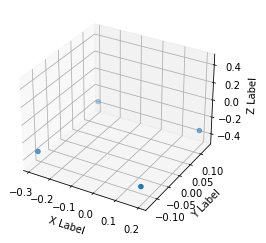


FL before: -0.337. FL after: -0.288593739271

FR before: -0.336. FR after: -0.325843662024

RL before: -0.343. RL after: -0.329608440399

RR before: -0.335. RR after: -0.288598805666
Footstep timestamp:  1628071722.9
Height check index:  2027
Height check timestamp:  1628071723.03

FL moving: 0.048406260729000006. FR moving: 0.010156337976000018
RL moving: 0.013391559601000025. RR moving: 0.04640119433400003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.289, 0.13, -0.343]. Coord RR: [-0.286, -0.121, -0.335]

FR step_size x: 0.019581917406000016. FR step_size y: 0.025878205179999975. RL step_size x: 0.01730929017099997. RL step_size x: 0.04332575404700001.


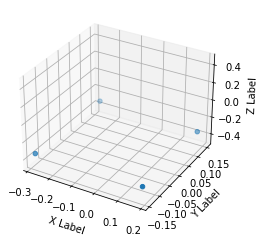


FL before: -0.336. FL after: -0.3253878057

FR before: -0.334. FR after: -0.288217395544

RL before: -0.331. RL after: -0.288792490959

RR before: -0.342. RR after: -0.330511957407
Footstep timestamp:  1628071723.22
Height check index:  2043
Height check timestamp:  1628071723.35

FL moving: 0.010612194300000044. FR moving: 0.04578260445600002
RL moving: 0.04220750904100001. RR moving: 0.011488042593000014

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.149, -0.331]. Coord RR: [-0.283, -0.145, -0.342]

FR step_size x: 0.020271467924000003. FR step_size y: 0.026395060301. RL step_size x: 0.019631814242. RL step_size x: 0.04126245552299998.


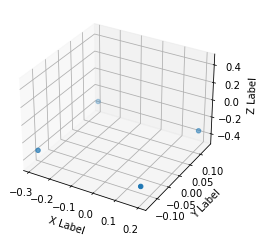


FL before: -0.33. FL after: -0.288318425417

FR before: -0.335. FR after: -0.325464487076

RL before: -0.342. RL after: -0.329480499029

RR before: -0.328. RR after: -0.289040356874
Footstep timestamp:  1628071723.54
Height check index:  2059
Height check timestamp:  1628071723.66

FL moving: 0.041681574583000036. FR moving: 0.009535512924000011
RL moving: 0.01251950097100002. RR moving: 0.03895964312600003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.126, -0.33]. Coord FR: [0.191, -0.13, -0.335]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.288, -0.12, -0.328]

FR step_size x: 0.01875779175800002. FR step_size y: 0.025331390142000004. RL step_size x: 0.019995488642999992. RL step_size x: 0.038591999889.


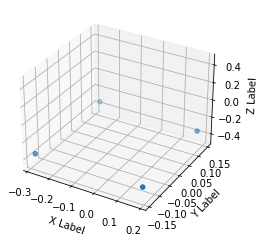


FL before: -0.337. FL after: -0.325956910849

FR before: -0.341. FR after: -0.288915127516

RL before: -0.338. RL after: -0.288676410913

RR before: -0.344. RR after: -0.331055104733
Footstep timestamp:  1628071723.86
Height check index:  2075
Height check timestamp:  1628071723.99

FL moving: 0.011043089150999996. FR moving: 0.05208487248400001
RL moving: 0.04932358908700002. RR moving: 0.01294489526699999

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.283, -0.145, -0.344]

FR step_size x: 0.018497278094000008. FR step_size y: 0.024085903883. RL step_size x: 0.01731465387300002. RL step_size x: 0.037020838617999985.


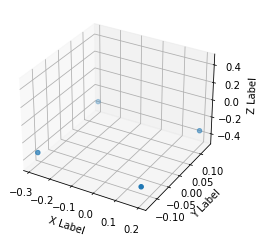


FL before: -0.341. FL after: -0.289169251919

FR before: -0.337. FR after: -0.325936704874

RL before: -0.344. RL after: -0.330906748772

RR before: -0.338. RR after: -0.289518356323
Footstep timestamp:  1628071724.19
Height check index:  2092
Height check timestamp:  1628071724.32

FL moving: 0.05183074808100002. FR moving: 0.011063295126000017
RL moving: 0.01309325122799998. RR moving: 0.04848164367700003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.341]. Coord FR: [0.192, -0.129, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.284, -0.124, -0.338]

FR step_size x: 0.02005721771700003. FR step_size y: 0.025325925469000005. RL step_size x: 0.01618701124199995. RL step_size x: 0.03989967024300001.


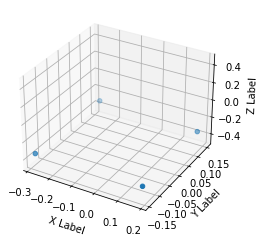


FL before: -0.335. FL after: -0.325089663267

FR before: -0.33. FR after: -0.290072202682

RL before: -0.328. RL after: -0.290157139301

RR before: -0.342. RR after: -0.32930290699
Footstep timestamp:  1628071724.55
Height check index:  2109
Height check timestamp:  1628071724.67

FL moving: 0.009910336733000014. FR moving: 0.039927797318
RL moving: 0.037842860699. RR moving: 0.012697093010000049

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.335]. Coord FR: [0.186, -0.144, -0.33]. Coord RL: [-0.275, 0.149, -0.328]. Coord RR: [-0.283, -0.145, -0.342]

FR step_size x: 0.018920394539999996. FR step_size y: 0.024181746125999992. RL step_size x: 0.01699071955699999. RL step_size x: 0.038953706859999965.


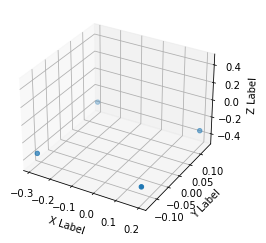


FL before: -0.343. FL after: -0.289382368326

FR before: -0.337. FR after: -0.325378775597

RL before: -0.345. RL after: -0.328851550817

RR before: -0.339. RR after: -0.289453923702
Footstep timestamp:  1628071724.83
Height check index:  2124
Height check timestamp:  1628071724.96

FL moving: 0.05361763167400002. FR moving: 0.011621224403000008
RL moving: 0.016148449182999958. RR moving: 0.04954607629800001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.343]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.129, -0.345]. Coord RR: [-0.284, -0.126, -0.339]

FR step_size x: 0.018136311054000015. FR step_size y: 0.022161263585000007. RL step_size x: 0.01776708364499996. RL step_size x: 0.039196754694.


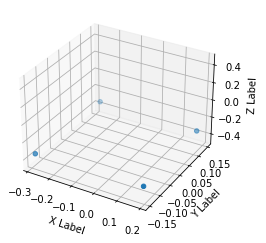


FL before: -0.337. FL after: -0.32672303915

FR before: -0.342. FR after: -0.291422218084

RL before: -0.338. RL after: -0.291242897511

RR before: -0.344. RR after: -0.332864433527
Footstep timestamp:  1628071725.14
Height check index:  2139
Height check timestamp:  1628071725.27

FL moving: 0.010276960850000016. FR moving: 0.05057778191600004
RL moving: 0.046757102489. RR moving: 0.011135566472999958

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.139, -0.337]. Coord FR: [0.189, -0.142, -0.342]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.284, -0.148, -0.344]

FR step_size x: 0.01911345601. FR step_size y: 0.024317246437000006. RL step_size x: 0.018260507106000023. RL step_size x: 0.04089842015499999.


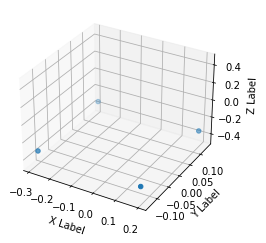


FL before: -0.334. FL after: -0.288244187832

FR before: -0.336. FR after: -0.325443267822

RL before: -0.343. RL after: -0.329572767019

RR before: -0.332. RR after: -0.288883805275
Footstep timestamp:  1628071725.51
Height check index:  2157
Height check timestamp:  1628071725.63

FL moving: 0.04575581216800001. FR moving: 0.010556732178000017
RL moving: 0.013427232981000015. RR moving: 0.043116194725

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.132, -0.343]. Coord RR: [-0.287, -0.121, -0.332]

FR step_size x: 0.01998224997600001. FR step_size y: 0.025549709081999994. RL step_size x: 0.018452996968999935. RL step_size x: 0.039742669581999984.


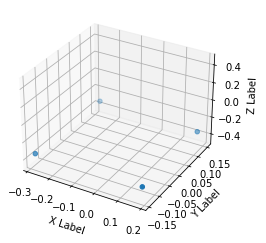


FL before: -0.336. FL after: -0.325376838446

FR before: -0.334. FR after: -0.288791030645

RL before: -0.332. RL after: -0.288607776165

RR before: -0.343. RR after: -0.329958736897
Footstep timestamp:  1628071725.83
Height check index:  2173
Height check timestamp:  1628071725.95

FL moving: 0.010623161554000005. FR moving: 0.04520896935500002
RL moving: 0.04339222383500002. RR moving: 0.013041263103000023

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.138, -0.336]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.148, -0.332]. Coord RR: [-0.283, -0.144, -0.343]

FR step_size x: 0.01873989677400001. FR step_size y: 0.023780310869999988. RL step_size x: 0.018103327989999918. RL step_size x: 0.03721051347299997.


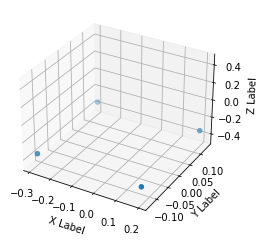


FL before: -0.343. FL after: -0.292229384184

FR before: -0.337. FR after: -0.327222377062

RL before: -0.345. RL after: -0.332718104124

RR before: -0.339. RR after: -0.291459530592
Footstep timestamp:  1628071726.11
Height check index:  2187
Height check timestamp:  1628071726.23

FL moving: 0.05077061581600001. FR moving: 0.009777622937999997
RL moving: 0.012281895875999982. RR moving: 0.047540469408

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.343]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.129, -0.345]. Coord RR: [-0.283, -0.126, -0.339]

FR step_size x: 0.01930469620200001. FR step_size y: 0.024909125089999984. RL step_size x: 0.01779257917400001. RL step_size x: 0.03982695460300001.


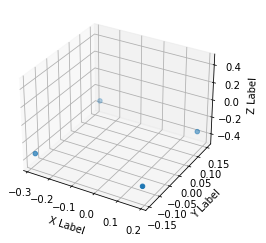


FL before: -0.335. FL after: -0.324859112501

FR before: -0.33. FR after: -0.305135756731

RL before: -0.328. RL after: -0.30479618907

RR before: -0.342. RR after: -0.328426361084
Footstep timestamp:  1628071726.49
Height check index:  2207
Height check timestamp:  1628071726.63

FL moving: 0.010140887498999995. FR moving: 0.024864243268999997
RL moving: 0.023203810930000013. RR moving: 0.013573638916000053

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.335]. Coord FR: [0.186, -0.144, -0.33]. Coord RL: [-0.275, 0.149, -0.328]. Coord RR: [-0.284, -0.145, -0.342]

FR step_size x: 0.020209076761999983. FR step_size y: 0.025945224047000004. RL step_size x: 0.01744623517999999. RL step_size x: 0.04079802358099999.


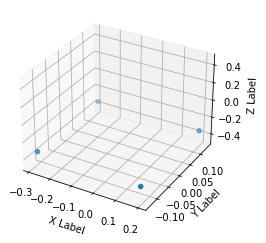


FL before: -0.337. FL after: -0.288731634617

FR before: -0.336. FR after: -0.325793921947

RL before: -0.343. RL after: -0.330079853535

RR before: -0.335. RR after: -0.288602828979
Footstep timestamp:  1628071726.79
Height check index:  2221
Height check timestamp:  1628071726.91

FL moving: 0.048268365383. FR moving: 0.010206078053
RL moving: 0.012920146465000004. RR moving: 0.046397171020999994

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.128, -0.337]. Coord FR: [0.191, -0.129, -0.336]. Coord RL: [-0.289, 0.131, -0.343]. Coord RR: [-0.287, -0.122, -0.335]

FR step_size x: 0.018681721330000012. FR step_size y: 0.024605586408999985. RL step_size x: 0.019282365798999945. RL step_size x: 0.04071969401799999.


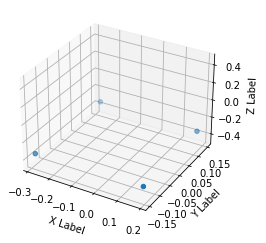


FL before: -0.337. FL after: -0.325829744339

FR before: -0.342. FR after: -0.289043903351

RL before: -0.338. RL after: -0.2892614007

RR before: -0.343. RR after: -0.331432253122
Footstep timestamp:  1628071727.11
Height check index:  2237
Height check timestamp:  1628071727.23

FL moving: 0.011170255660999995. FR moving: 0.05295609664900003
RL moving: 0.04873859930000002. RR moving: 0.011567746878000051

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.147, -0.338]. Coord RR: [-0.284, -0.147, -0.343]

FR step_size x: 0.018794094324000005. FR step_size y: 0.022649433971. RL step_size x: 0.017385732411999977. RL step_size x: 0.03880846524199999.


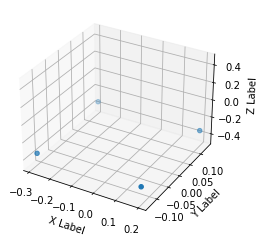


FL before: -0.342. FL after: -0.29138687253

FR before: -0.337. FR after: -0.326915234327

RL before: -0.345. RL after: -0.332316875458

RR before: -0.339. RR after: -0.291372895241
Footstep timestamp:  1628071727.43
Height check index:  2254
Height check timestamp:  1628071727.57

FL moving: 0.05061312747000002. FR moving: 0.01008476567300004
RL moving: 0.01268312454199999. RR moving: 0.047627104759000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.13, -0.345]. Coord RR: [-0.284, -0.126, -0.339]

FR step_size x: 0.019482211708999997. FR step_size y: 0.02302707862799999. RL step_size x: 0.016843753813999995. RL step_size x: 0.03735626959800001.


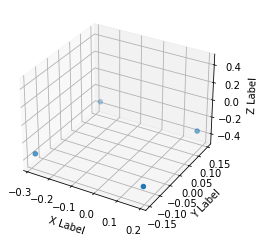


FL before: -0.337. FL after: -0.326434403658

FR before: -0.342. FR after: -0.290242880583

RL before: -0.338. RL after: -0.289658159018

RR before: -0.344. RR after: -0.331877619028
Footstep timestamp:  1628071727.75
Height check index:  2270
Height check timestamp:  1628071727.89

FL moving: 0.010565596341999994. FR moving: 0.05175711941700001
RL moving: 0.048341840982000006. RR moving: 0.012122380971999969

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.018556152582000024. FR step_size y: 0.023653593420999985. RL step_size x: 0.01791821050600001. RL step_size x: 0.038481893420999974.


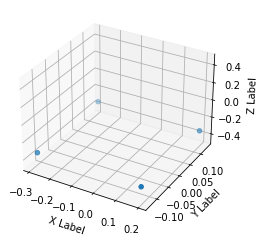


FL before: -0.342. FL after: -0.289421319962

FR before: -0.337. FR after: -0.326176702976

RL before: -0.344. RL after: -0.330769747496

RR before: -0.338. RR after: -0.289039820433
Footstep timestamp:  1628071728.09
Height check index:  2286
Height check timestamp:  1628071728.21

FL moving: 0.052578680038000036. FR moving: 0.010823297024000034
RL moving: 0.01323025250399995. RR moving: 0.048960179566999995

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.285, -0.124, -0.338]

FR step_size x: 0.018989802836999997. FR step_size y: 0.024146138906999987. RL step_size x: 0.018178176879999952. RL step_size x: 0.039317273259.


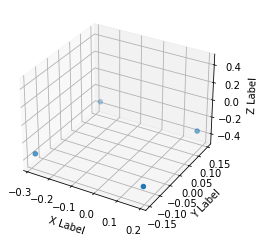


FL before: -0.337. FL after: -0.326378941536

FR before: -0.342. FR after: -0.29020819068

RL before: -0.338. RL after: -0.289531856775

RR before: -0.344. RR after: -0.331965744495
Footstep timestamp:  1628071728.41
Height check index:  2303
Height check timestamp:  1628071728.55

FL moving: 0.010621058464000022. FR moving: 0.05179180932000005
RL moving: 0.04846814322500004. RR moving: 0.01203425550499998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.01871414959400003. FR step_size y: 0.02278437888599999. RL step_size x: 0.018055729626999972. RL step_size x: 0.03805448341299998.


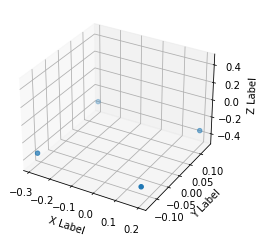


FL before: -0.342. FL after: -0.28871718049

FR before: -0.337. FR after: -0.325836658478

RL before: -0.344. RL after: -0.330134302378

RR before: -0.339. RR after: -0.288628637791
Footstep timestamp:  1628071728.73
Height check index:  2319
Height check timestamp:  1628071728.87

FL moving: 0.053282819510000023. FR moving: 0.011163341522000048
RL moving: 0.013865697621999962. RR moving: 0.050371362209000015

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.283, -0.125, -0.339]

FR step_size x: 0.01908733093699999. FR step_size y: 0.024235339283999985. RL step_size x: 0.016971231222000005. RL step_size x: 0.03936051845499999.


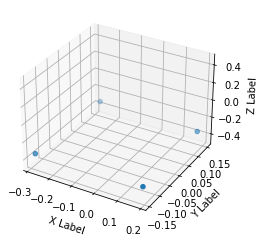


FL before: -0.336. FL after: -0.325881332159

FR before: -0.339. FR after: -0.288849264383

RL before: -0.336. RL after: -0.28856921196

RR before: -0.343. RR after: -0.331006914377
Footstep timestamp:  1628071729.07
Height check index:  2335
Height check timestamp:  1628071729.19

FL moving: 0.010118667841000017. FR moving: 0.05015073561700001
RL moving: 0.047430788040000005. RR moving: 0.011993085623

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.143, -0.339]. Coord RL: [-0.273, 0.148, -0.336]. Coord RR: [-0.283, -0.146, -0.343]

FR step_size x: 0.018854727149000022. FR step_size y: 0.025401318788000005. RL step_size x: 0.020431155204999996. RL step_size x: 0.04103277647499998.


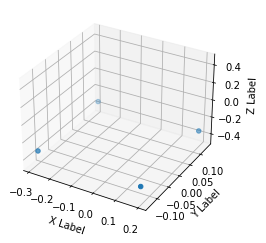


FL before: -0.334. FL after: -0.288393557072

FR before: -0.336. FR after: -0.325726926327

RL before: -0.343. RL after: -0.330235183239

RR before: -0.332. RR after: -0.289020627737
Footstep timestamp:  1628071729.39
Height check index:  2352
Height check timestamp:  1628071729.53

FL moving: 0.045606442928000035. FR moving: 0.01027307367300001
RL moving: 0.012764816761000053. RR moving: 0.042979372263000026

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.132, -0.343]. Coord RR: [-0.287, -0.121, -0.332]

FR step_size x: 0.018323333501999994. FR step_size y: 0.023497252940999996. RL step_size x: 0.019185895681999965. RL step_size x: 0.03929554533900001.


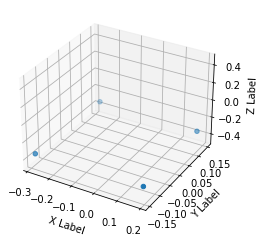


FL before: -0.337. FL after: -0.326237916946

FR before: -0.342. FR after: -0.289764046669

RL before: -0.339. RL after: -0.289226382971

RR before: -0.344. RR after: -0.331702768803
Footstep timestamp:  1628071729.71
Height check index:  2367
Height check timestamp:  1628071729.84

FL moving: 0.010762083054000005. FR moving: 0.05223595333100001
RL moving: 0.04977361702900002. RR moving: 0.012297231196999991

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.138, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.146, -0.339]. Coord RR: [-0.283, -0.147, -0.344]

FR step_size x: 0.017372583150999987. FR step_size y: 0.021927236317999976. RL step_size x: 0.017339017629999953. RL step_size x: 0.038609730482000004.


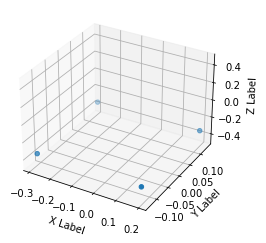


FL before: -0.343. FL after: -0.290249943733

FR before: -0.337. FR after: -0.326421707869

RL before: -0.345. RL after: -0.331591486931

RR before: -0.339. RR after: -0.290374666452
Footstep timestamp:  1628071730.04
Height check index:  2383
Height check timestamp:  1628071730.16

FL moving: 0.05275005626700002. FR moving: 0.010578292131000033
RL moving: 0.013408513068999983. RR moving: 0.04862533354800003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.343]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.291, 0.129, -0.345]. Coord RR: [-0.283, -0.126, -0.339]

FR step_size x: 0.018225300789000004. FR step_size y: 0.023017094850000003. RL step_size x: 0.01704470682199999. RL step_size x: 0.03492605209300001.


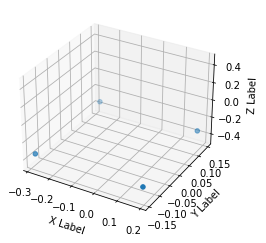


FL before: -0.337. FL after: -0.326423406601

FR before: -0.342. FR after: -0.29034358263

RL before: -0.339. RL after: -0.289884328842

RR before: -0.345. RR after: -0.332031190395
Footstep timestamp:  1628071730.36
Height check index:  2399
Height check timestamp:  1628071730.48

FL moving: 0.010576593399000023. FR moving: 0.05165641737000004
RL moving: 0.04911567115800003. RR moving: 0.012968809604999965

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.275, 0.145, -0.339]. Coord RR: [-0.284, -0.145, -0.345]

FR step_size x: 0.01867661357. FR step_size y: 0.02375979399700001. RL step_size x: 0.016858533382999974. RL step_size x: 0.03658966064499998.


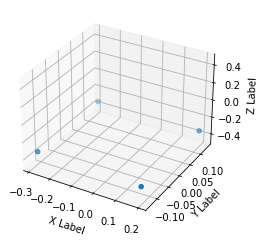


FL before: -0.337. FL after: -0.288592100143

FR before: -0.336. FR after: -0.325350612402

RL before: -0.343. RL after: -0.329183489084

RR before: -0.335. RR after: -0.289428204298
Footstep timestamp:  1628071730.72
Height check index:  2418
Height check timestamp:  1628071730.86

FL moving: 0.048407899857. FR moving: 0.010649387598000049
RL moving: 0.013816510916000002. RR moving: 0.04557179570200004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.128, -0.337]. Coord FR: [0.192, -0.129, -0.336]. Coord RL: [-0.289, 0.131, -0.343]. Coord RR: [-0.286, -0.122, -0.335]

FR step_size x: 0.020539791821999998. FR step_size y: 0.025934367656999996. RL step_size x: 0.017827850579999915. RL step_size x: 0.042556604862.


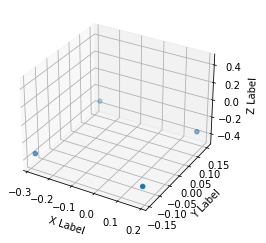


FL before: -0.335. FL after: -0.325464606285

FR before: -0.334. FR after: -0.28839635849

RL before: -0.331. RL after: -0.28816947341

RR before: -0.342. RR after: -0.330426692963
Footstep timestamp:  1628071731.04
Height check index:  2433
Height check timestamp:  1628071731.16

FL moving: 0.009535393715000007. FR moving: 0.045603641510000015
RL moving: 0.04283052659000003. RR moving: 0.011573307037000047

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.335]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.15, -0.331]. Coord RR: [-0.283, -0.146, -0.342]

FR step_size x: 0.020533785938999988. FR step_size y: 0.025522597313000023. RL step_size x: 0.017881583452000027. RL step_size x: 0.042196076273999975.


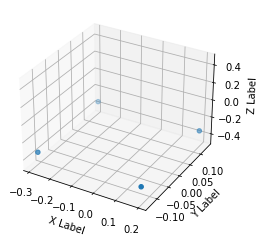


FL before: -0.34. FL after: -0.289063632488

FR before: -0.337. FR after: -0.32602545619

RL before: -0.344. RL after: -0.330409675837

RR before: -0.337. RR after: -0.28878736496
Footstep timestamp:  1628071731.34
Height check index:  2448
Height check timestamp:  1628071731.46

FL moving: 0.050936367512000036. FR moving: 0.010974543810000015
RL moving: 0.01359032416299999. RR moving: 0.04821263504000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.34]. Coord FR: [0.192, -0.129, -0.337]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.285, -0.123, -0.337]

FR step_size x: 0.018815816879000025. FR step_size y: 0.023784415244999996. RL step_size x: 0.01767278909699993. RL step_size x: 0.03761657393000001.


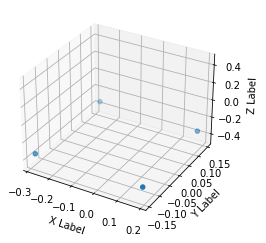


FL before: -0.337. FL after: -0.325488984585

FR before: -0.341. FR after: -0.288337856531

RL before: -0.338. RL after: -0.288809269667

RR before: -0.344. RR after: -0.330819100142
Footstep timestamp:  1628071731.68
Height check index:  2466
Height check timestamp:  1628071731.82

FL moving: 0.011511015415000048. FR moving: 0.052662143469
RL moving: 0.04919073033300003. RR moving: 0.013180899857999973

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.283, -0.145, -0.344]

FR step_size x: 0.01788907432600001. FR step_size y: 0.023337016225000007. RL step_size x: 0.01686726141. RL step_size x: 0.03592704868299998.


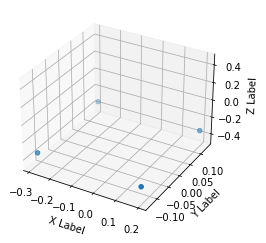


FL before: -0.342. FL after: -0.28931966424

FR before: -0.337. FR after: -0.326091974974

RL before: -0.344. RL after: -0.330567091703

RR before: -0.339. RR after: -0.289111286402
Footstep timestamp:  1628071732.0
Height check index:  2482
Height check timestamp:  1628071732.14

FL moving: 0.05268033576000003. FR moving: 0.010908025026000023
RL moving: 0.013432908296999946. RR moving: 0.04988871359800001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.13, -0.342]. Coord FR: [0.192, -0.129, -0.337]. Coord RL: [-0.29, 0.13, -0.344]. Coord RR: [-0.284, -0.125, -0.339]

FR step_size x: 0.018765197635000008. FR step_size y: 0.021897378920999994. RL step_size x: 0.017169593810999972. RL step_size x: 0.038662369251.


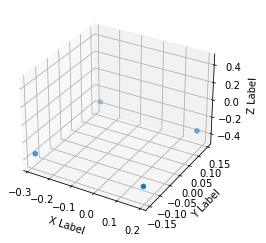


FL before: -0.336. FL after: -0.325699329376

FR before: -0.341. FR after: -0.288793504238

RL before: -0.338. RL after: -0.288421720266

RR before: -0.344. RR after: -0.331097990274
Footstep timestamp:  1628071732.32
Height check index:  2497
Height check timestamp:  1628071732.44

FL moving: 0.01030067062400003. FR moving: 0.05220649576200004
RL moving: 0.04957827973400003. RR moving: 0.012902009725999974

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.336]. Coord FR: [0.189, -0.142, -0.341]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.01682761990999998. FR step_size y: 0.023164209485000004. RL step_size x: 0.01942729210899996. RL step_size x: 0.038357602835000004.


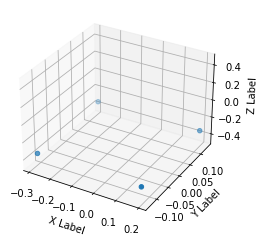


FL before: -0.343. FL after: -0.290230125189

FR before: -0.337. FR after: -0.32633343339

RL before: -0.345. RL after: -0.331712394953

RR before: -0.339. RR after: -0.290323019028
Footstep timestamp:  1628071732.64
Height check index:  2514
Height check timestamp:  1628071732.78

FL moving: 0.05276987481100004. FR moving: 0.010666566610000039
RL moving: 0.013287605046999995. RR moving: 0.04867698097200002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.343]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.291, 0.13, -0.345]. Coord RR: [-0.283, -0.125, -0.339]

FR step_size x: 0.017094764590000006. FR step_size y: 0.023723929404999983. RL step_size x: 0.016794963360000026. RL step_size x: 0.03545893251900001.


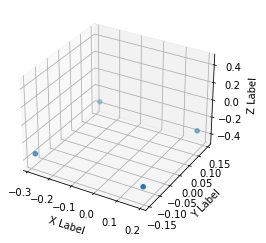


FL before: -0.337. FL after: -0.326040774584

FR before: -0.342. FR after: -0.289669930935

RL before: -0.339. RL after: -0.289962023497

RR before: -0.344. RR after: -0.331796228886
Footstep timestamp:  1628071732.96
Height check index:  2530
Height check timestamp:  1628071733.1

FL moving: 0.010959225416000029. FR moving: 0.05233006906500004
RL moving: 0.049037976503000014. RR moving: 0.01220377111399995

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.189, -0.142, -0.342]. Coord RL: [-0.275, 0.145, -0.339]. Coord RR: [-0.284, -0.146, -0.344]

FR step_size x: 0.016869194150000016. FR step_size y: 0.022771325468999987. RL step_size x: 0.016147610187999928. RL step_size x: 0.03598000740999999.


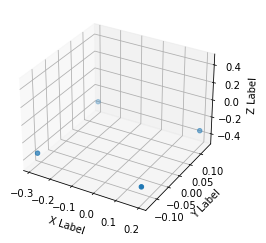


FL before: -0.343. FL after: -0.291000902653

FR before: -0.337. FR after: -0.32672226429

RL before: -0.345. RL after: -0.331821531057

RR before: -0.339. RR after: -0.290447771549
Footstep timestamp:  1628071733.28
Height check index:  2545
Height check timestamp:  1628071733.4

FL moving: 0.051999097347000034. FR moving: 0.010277735710000013
RL moving: 0.013178468942999955. RR moving: 0.048552228451000046

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.343]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.13, -0.345]. Coord RR: [-0.284, -0.125, -0.339]

FR step_size x: 0.018421057344000014. FR step_size y: 0.02463723850300001. RL step_size x: 0.016836912154999994. RL step_size x: 0.03768722236199998.


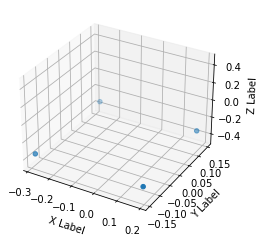


FL before: -0.336. FL after: -0.326858878136

FR before: -0.341. FR after: -0.291535317898

RL before: -0.338. RL after: -0.290815621614

RR before: -0.345. RR after: -0.3328820467
Footstep timestamp:  1628071733.6
Height check index:  2561
Height check timestamp:  1628071733.72

FL moving: 0.009141121864000012. FR moving: 0.049464682102
RL moving: 0.04718437838600004. RR moving: 0.012117953299999984

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.139, -0.336]. Coord FR: [0.189, -0.143, -0.341]. Coord RL: [-0.275, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.345]

FR step_size x: 0.018251677156000012. FR step_size y: 0.02399528992199998. RL step_size x: 0.016613122462999952. RL step_size x: 0.040077688574999965.


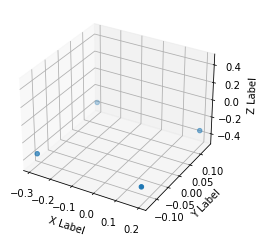


FL before: -0.342. FL after: -0.291471451521

FR before: -0.337. FR after: -0.326969832182

RL before: -0.345. RL after: -0.332325190306

RR before: -0.34. RR after: -0.291607171297
Footstep timestamp:  1628071733.92
Height check index:  2578
Height check timestamp:  1628071734.06

FL moving: 0.05052854847900001. FR moving: 0.010030167818000035
RL moving: 0.012674809693999978. RR moving: 0.048392828703000046

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.127, -0.345]. Coord RR: [-0.284, -0.126, -0.34]

FR step_size x: 0.01814748692500001. FR step_size y: 0.023940788029999993. RL step_size x: 0.01781963801299996. RL step_size x: 0.039023286224.


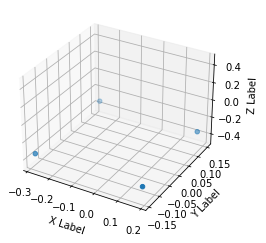


FL before: -0.336. FL after: -0.325242072344

FR before: -0.334. FR after: -0.288540661335

RL before: -0.332. RL after: -0.289300471544

RR before: -0.343. RR after: -0.330112576485
Footstep timestamp:  1628071734.28
Height check index:  2595
Height check timestamp:  1628071734.4

FL moving: 0.010757927656000033. FR moving: 0.045459338665000015
RL moving: 0.042699528456. RR moving: 0.012887423515000052

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.138, -0.336]. Coord FR: [0.186, -0.143, -0.334]. Coord RL: [-0.275, 0.148, -0.332]. Coord RR: [-0.283, -0.144, -0.343]

FR step_size x: 0.020056831598000008. FR step_size y: 0.024617773055999992. RL step_size x: 0.018955825091000023. RL step_size x: 0.04076435846099999.


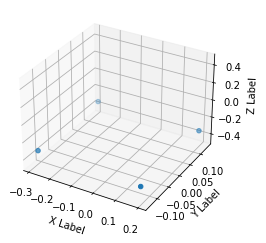


FL before: -0.334. FL after: -0.288631111383

FR before: -0.336. FR after: -0.325646311045

RL before: -0.343. RL after: -0.329320311546

RR before: -0.332. RR after: -0.28866392374
Footstep timestamp:  1628071734.62
Height check index:  2612
Height check timestamp:  1628071734.74

FL moving: 0.045368888617. FR moving: 0.010353688954999996
RL moving: 0.013679688454000027. RR moving: 0.04333607626000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.131, -0.343]. Coord RR: [-0.288, -0.12, -0.332]

FR step_size x: 0.019690455437000015. FR step_size y: 0.025101795077. RL step_size x: 0.019964345216999968. RL step_size x: 0.043609636068.


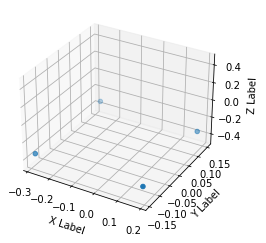


FL before: -0.336. FL after: -0.325519055128

FR before: -0.337. FR after: -0.288438767195

RL before: -0.333. RL after: -0.288172394037

RR before: -0.343. RR after: -0.33057436347
Footstep timestamp:  1628071734.92
Height check index:  2628
Height check timestamp:  1628071735.06

FL moving: 0.01048094487200002. FR moving: 0.04856123280500002
RL moving: 0.044827605963000006. RR moving: 0.012425636530000006

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.336]. Coord FR: [0.187, -0.143, -0.337]. Coord RL: [-0.273, 0.148, -0.333]. Coord RR: [-0.284, -0.146, -0.343]

FR step_size x: 0.018872414827. FR step_size y: 0.024691546677999998. RL step_size x: 0.018226753950000008. RL step_size x: 0.042470753430999986.


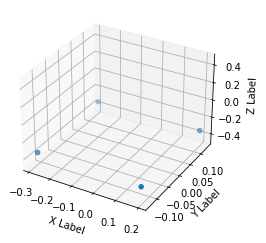


FL before: -0.342. FL after: -0.288722783327

FR before: -0.337. FR after: -0.325860142708

RL before: -0.345. RL after: -0.330088943243

RR before: -0.339. RR after: -0.288736194372
Footstep timestamp:  1628071735.24
Height check index:  2644
Height check timestamp:  1628071735.38

FL moving: 0.053277216673000005. FR moving: 0.01113985729200001
RL moving: 0.014911056756999996. RR moving: 0.050263805628000036

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.29, 0.129, -0.345]. Coord RR: [-0.285, -0.123, -0.339]

FR step_size x: 0.019207479001000005. FR step_size y: 0.026920750022000006. RL step_size x: 0.01749325990599998. RL step_size x: 0.04282182860299999.


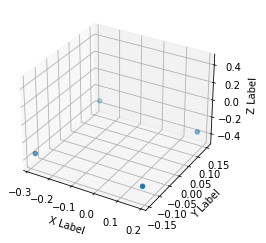


FL before: -0.335. FL after: -0.325084745884

FR before: -0.33. FR after: -0.288438737392

RL before: -0.328. RL after: -0.289252817631

RR before: -0.341. RR after: -0.329837292433
Footstep timestamp:  1628071735.58
Height check index:  2660
Height check timestamp:  1628071735.7

FL moving: 0.009915254116000027. FR moving: 0.04156126260800003
RL moving: 0.03874718236899999. RR moving: 0.011162707567000052

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.184, 0.139, -0.335]. Coord FR: [0.186, -0.144, -0.33]. Coord RL: [-0.275, 0.15, -0.328]. Coord RR: [-0.283, -0.145, -0.341]

FR step_size x: 0.019373332261999998. FR step_size y: 0.02567727136600001. RL step_size x: 0.018312839984999996. RL step_size x: 0.04139017879999997.


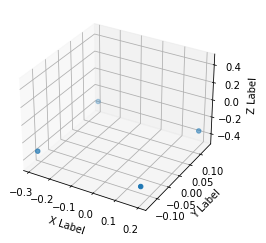


FL before: -0.334. FL after: -0.288225591183

FR before: -0.336. FR after: -0.325495988131

RL before: -0.342. RL after: -0.329623878002

RR before: -0.332. RR after: -0.289104670286
Footstep timestamp:  1628071735.92
Height check index:  2678
Height check timestamp:  1628071736.06

FL moving: 0.04577440881700001. FR moving: 0.010504011869000018
RL moving: 0.012376121998000034. RR moving: 0.04289532971400001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.287, -0.122, -0.332]

FR step_size x: 0.019917564035. FR step_size y: 0.025088071107999987. RL step_size x: 0.01852538680999999. RL step_size x: 0.04039516365599999.


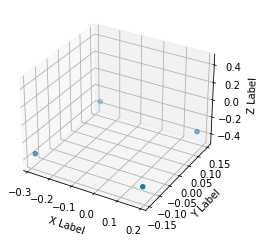


FL before: -0.336. FL after: -0.324794262648

FR before: -0.337. FR after: -0.295068919659

RL before: -0.334. RL after: -0.295664459467

RR before: -0.343. RR after: -0.328998446465
Footstep timestamp:  1628071736.24
Height check index:  2694
Height check timestamp:  1628071736.38

FL moving: 0.011205737352000034. FR moving: 0.041931080341000015
RL moving: 0.038335540533000034. RR moving: 0.014001553535000044

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.138, -0.336]. Coord FR: [0.187, -0.144, -0.337]. Coord RL: [-0.273, 0.148, -0.334]. Coord RR: [-0.284, -0.146, -0.343]

FR step_size x: 0.01834489882000001. FR step_size y: 0.025013188243. RL step_size x: 0.017970304965999995. RL step_size x: 0.04038919532299999.


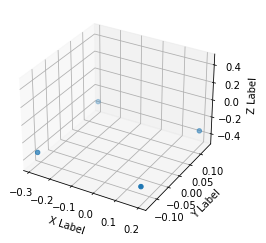


FL before: -0.34. FL after: -0.291002303362

FR before: -0.336. FR after: -0.326736450195

RL before: -0.344. RL after: -0.332045525312

RR before: -0.337. RR after: -0.290298432112
Footstep timestamp:  1628071736.54
Height check index:  2708
Height check timestamp:  1628071736.66

FL moving: 0.04899769663800002. FR moving: 0.009263549804999993
RL moving: 0.011954474687999983. RR moving: 0.046701567888000006

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.197, 0.129, -0.34]. Coord FR: [0.191, -0.128, -0.336]. Coord RL: [-0.29, 0.131, -0.344]. Coord RR: [-0.285, -0.123, -0.337]

FR step_size x: 0.017211112857. FR step_size y: 0.024024679540999988. RL step_size x: 0.01841880083099995. RL step_size x: 0.03860525107399998.


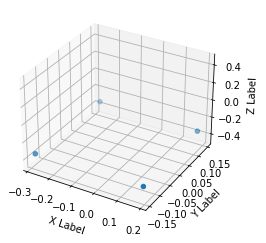


FL before: -0.337. FL after: -0.326668351889

FR before: -0.342. FR after: -0.290771633387

RL before: -0.338. RL after: -0.290188997984

RR before: -0.344. RR after: -0.33224645257
Footstep timestamp:  1628071736.86
Height check index:  2724
Height check timestamp:  1628071736.98

FL moving: 0.010331648111000014. FR moving: 0.05122836661300001
RL moving: 0.047811002016000026. RR moving: 0.011753547429999955

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.183, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.283, -0.147, -0.344]

FR step_size x: 0.017237580656999985. FR step_size y: 0.02272683060199998. RL step_size x: 0.017873596430000027. RL step_size x: 0.04036375361699997.


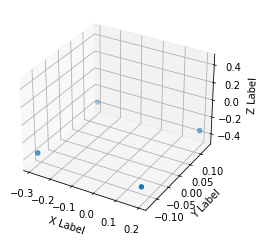


FL before: -0.342. FL after: -0.290858149529

FR before: -0.337. FR after: -0.326715797186

RL before: -0.345. RL after: -0.331930011511

RR before: -0.34. RR after: -0.290503561497
Footstep timestamp:  1628071737.18
Height check index:  2741
Height check timestamp:  1628071737.32

FL moving: 0.051141850471000005. FR moving: 0.010284202813999999
RL moving: 0.013069988488999984. RR moving: 0.049496438503000006

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.13, -0.342]. Coord FR: [0.192, -0.128, -0.337]. Coord RL: [-0.291, 0.128, -0.345]. Coord RR: [-0.284, -0.124, -0.34]

FR step_size x: 0.017677280783000016. FR step_size y: 0.022968070030999987. RL step_size x: 0.01812903284999995. RL step_size x: 0.041007016182000006.


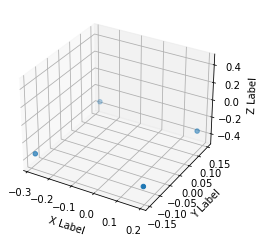


FL before: -0.337. FL after: -0.32713919878

FR before: -0.342. FR after: -0.292242050171

RL before: -0.339. RL after: -0.291938871145

RR before: -0.344. RR after: -0.333120375872
Footstep timestamp:  1628071737.5
Height check index:  2757
Height check timestamp:  1628071737.64

FL moving: 0.009860801220000048. FR moving: 0.049757949829
RL moving: 0.04706112885500002. RR moving: 0.010879624127999976

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.146, -0.339]. Coord RR: [-0.283, -0.147, -0.344]

FR step_size x: 0.017279644609. FR step_size y: 0.021994021296999983. RL step_size x: 0.01973591375299999. RL step_size x: 0.038482340454999986.


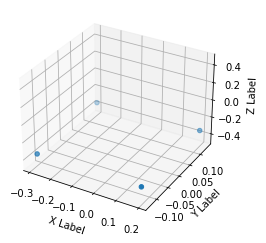


FL before: -0.341. FL after: -0.292193442583

FR before: -0.337. FR after: -0.32713457942

RL before: -0.345. RL after: -0.332777559757

RR before: -0.339. RR after: -0.292102605104
Footstep timestamp:  1628071737.82
Height check index:  2772
Height check timestamp:  1628071737.94

FL moving: 0.04880655741700002. FR moving: 0.009865420580000006
RL moving: 0.012222440242999955. RR moving: 0.04689739489600003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.132, -0.341]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.293, 0.127, -0.345]. Coord RR: [-0.284, -0.127, -0.339]

FR step_size x: 0.019477415562. FR step_size y: 0.023867461443000004. RL step_size x: 0.01944140386499993. RL step_size x: 0.041086726545999985.


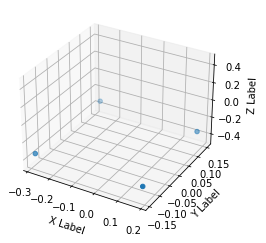


FL before: -0.335. FL after: -0.32578882575

FR before: -0.334. FR after: -0.289109021425

RL before: -0.331. RL after: -0.289325296879

RR before: -0.342. RR after: -0.331639289856
Footstep timestamp:  1628071738.18
Height check index:  2791
Height check timestamp:  1628071738.32

FL moving: 0.00921117425000001. FR moving: 0.04489097857500002
RL moving: 0.04167470312100002. RR moving: 0.01036071014400003

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.335]. Coord FR: [0.186, -0.144, -0.334]. Coord RL: [-0.274, 0.149, -0.331]. Coord RR: [-0.284, -0.146, -0.342]

FR step_size x: 0.021204174280999993. FR step_size y: 0.026236556649999992. RL step_size x: 0.017918972493000007. RL step_size x: 0.04213030457499997.


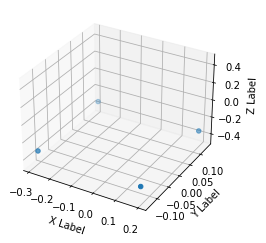


FL before: -0.334. FL after: -0.288309425116

FR before: -0.336. FR after: -0.32548981905

RL before: -0.343. RL after: -0.329519420862

RR before: -0.332. RR after: -0.288916230202
Footstep timestamp:  1628071738.52
Height check index:  2807
Height check timestamp:  1628071738.64

FL moving: 0.045690574884000024. FR moving: 0.010510180950000003
RL moving: 0.013480579138000048. RR moving: 0.04308376979799999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.127, -0.334]. Coord FR: [0.191, -0.13, -0.336]. Coord RL: [-0.289, 0.132, -0.343]. Coord RR: [-0.287, -0.121, -0.332]

FR step_size x: 0.018947260022000006. FR step_size y: 0.024416133045999988. RL step_size x: 0.017351234913000002. RL step_size x: 0.037186032652999995.


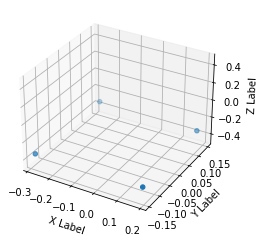


FL before: -0.337. FL after: -0.326534718275

FR before: -0.341. FR after: -0.290282726288

RL before: -0.339. RL after: -0.289734750986

RR before: -0.345. RR after: -0.331998050213
Footstep timestamp:  1628071738.8
Height check index:  2821
Height check timestamp:  1628071738.92

FL moving: 0.010465281724999997. FR moving: 0.05071727371200002
RL moving: 0.049265249014000034. RR moving: 0.013001949786999978

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.139, -0.337]. Coord FR: [0.189, -0.143, -0.341]. Coord RL: [-0.275, 0.145, -0.339]. Coord RR: [-0.283, -0.145, -0.345]

FR step_size x: 0.017311697007. FR step_size y: 0.022851655601999976. RL step_size x: 0.018681092738999983. RL step_size x: 0.03657940864499998.


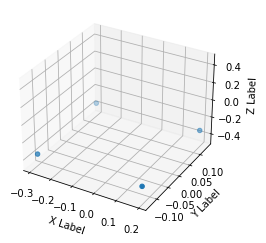


FL before: -0.34. FL after: -0.29288905859

FR before: -0.336. FR after: -0.32750248909

RL before: -0.345. RL after: -0.333088368177

RR before: -0.339. RR after: -0.292348653078
Footstep timestamp:  1628071739.12
Height check index:  2837
Height check timestamp:  1628071739.24

FL moving: 0.04711094141000005. FR moving: 0.008497510910000006
RL moving: 0.01191163182299998. RR moving: 0.046651346922000014

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.195, 0.133, -0.34]. Coord FR: [0.192, -0.126, -0.336]. Coord RL: [-0.294, 0.125, -0.345]. Coord RR: [-0.283, -0.128, -0.339]

FR step_size x: 0.018253749132000008. FR step_size y: 0.02295032477399997. RL step_size x: 0.02105464792299999. RL step_size x: 0.040814256787000014.


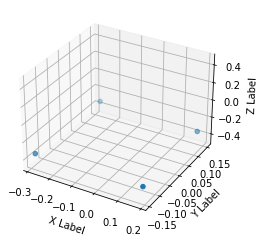


FL before: -0.336. FL after: -0.325409114361

FR before: -0.338. FR after: -0.288745343685

RL before: -0.334. RL after: -0.288457453251

RR before: -0.343. RR after: -0.329954087734
Footstep timestamp:  1628071739.48
Height check index:  2856
Height check timestamp:  1628071739.62

FL moving: 0.010590885639000014. FR moving: 0.049254656315000034
RL moving: 0.045542546749000046. RR moving: 0.013045912266000048

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.336]. Coord FR: [0.186, -0.143, -0.338]. Coord RL: [-0.274, 0.148, -0.334]. Coord RR: [-0.284, -0.146, -0.343]

FR step_size x: 0.019528255581999998. FR step_size y: 0.023848111153000007. RL step_size x: 0.018730202912999927. RL step_size x: 0.04175123596199998.


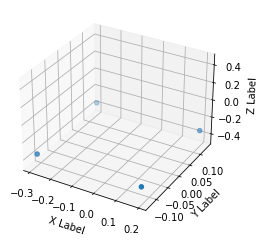


FL before: -0.342. FL after: -0.291665703058

FR before: -0.337. FR after: -0.32693067193

RL before: -0.345. RL after: -0.332524627447

RR before: -0.34. RR after: -0.291698247194
Footstep timestamp:  1628071739.79
Height check index:  2871
Height check timestamp:  1628071739.92

FL moving: 0.050334296942000034. FR moving: 0.010069328069999994
RL moving: 0.012475372552999964. RR moving: 0.04830175280600002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.132, -0.342]. Coord FR: [0.192, -0.126, -0.337]. Coord RL: [-0.293, 0.126, -0.345]. Coord RR: [-0.284, -0.126, -0.34]

FR step_size x: 0.017591137171000026. FR step_size y: 0.023766235828999976. RL step_size x: 0.019152649164000002. RL step_size x: 0.041128043413.


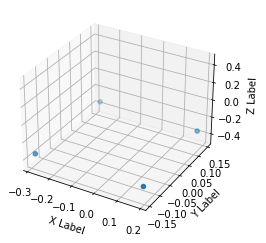


FL before: -0.337. FL after: -0.327157735825

FR before: -0.342. FR after: -0.292064726353

RL before: -0.339. RL after: -0.29136633873

RR before: -0.344. RR after: -0.33314293623
Footstep timestamp:  1628071740.11
Height check index:  2887
Height check timestamp:  1628071740.25

FL moving: 0.009842264175000004. FR moving: 0.04993527364700001
RL moving: 0.047633661270000016. RR moving: 0.010857063769999953

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.274, 0.146, -0.339]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.017840270996000024. FR step_size y: 0.022745784879000003. RL step_size x: 0.018826464413999933. RL step_size x: 0.037767427443999996.


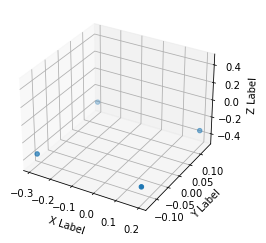


FL before: -0.342. FL after: -0.288575559855

FR before: -0.337. FR after: -0.325376093388

RL before: -0.345. RL after: -0.32936912775

RR before: -0.339. RR after: -0.289220482111
Footstep timestamp:  1628071740.45
Height check index:  2904
Height check timestamp:  1628071740.58

FL moving: 0.05342444014500003. FR moving: 0.011623906612000023
RL moving: 0.015630872249999983. RR moving: 0.049779517889000036

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.196, 0.131, -0.342]. Coord FR: [0.192, -0.127, -0.337]. Coord RL: [-0.292, 0.129, -0.345]. Coord RR: [-0.283, -0.127, -0.339]

FR step_size x: 0.018422949791000037. FR step_size y: 0.023428113579999993. RL step_size x: 0.01934614443799998. RL step_size x: 0.03732441091599997.


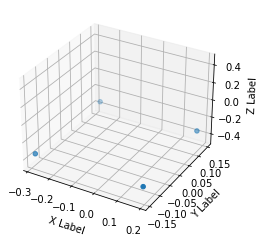


FL before: -0.336. FL after: -0.326978892088

FR before: -0.341. FR after: -0.292262852192

RL before: -0.338. RL after: -0.292012363672

RR before: -0.344. RR after: -0.333439022303
Footstep timestamp:  1628071740.77
Height check index:  2919
Height check timestamp:  1628071740.89

FL moving: 0.009021107912000004. FR moving: 0.048737147808000036
RL moving: 0.045987636328000014. RR moving: 0.010560977696999985

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.181, 0.139, -0.336]. Coord FR: [0.188, -0.143, -0.341]. Coord RL: [-0.274, 0.146, -0.338]. Coord RR: [-0.284, -0.147, -0.344]

FR step_size x: 0.020517664909000005. FR step_size y: 0.025341788650000002. RL step_size x: 0.019289372681999983. RL step_size x: 0.039782891452999986.


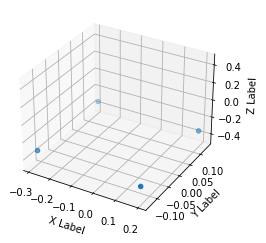


FL before: -0.331. FL after: -0.290056735277

FR before: -0.335. FR after: -0.325203061104

RL before: -0.342. RL after: -0.32871106267

RR before: -0.329. RR after: -0.290810376406
Footstep timestamp:  1628071741.13
Height check index:  2938
Height check timestamp:  1628071741.27

FL moving: 0.04094326472300003. FR moving: 0.00979693889600003
RL moving: 0.013288937330000028. RR moving: 0.03818962359400002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

Coord FL: [0.198, 0.126, -0.331]. Coord FR: [0.191, -0.13, -0.335]. Coord RL: [-0.289, 0.132, -0.342]. Coord RR: [-0.289, -0.121, -0.329]

FR step_size x: 0.018828378558000014. FR step_size y: 0.024937120317999995. RL step_size x: 0.020665606737999942. RL step_size x: 0.04048784685099999.


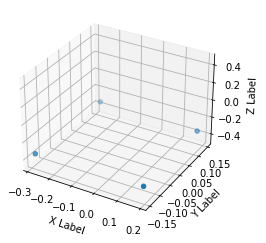


FL before: -0.337. FL after: -0.32629057765

FR before: -0.342. FR after: -0.290137678385

RL before: -0.338. RL after: -0.289474874735

RR before: -0.344. RR after: -0.332055807114
Footstep timestamp:  1628071741.43
Height check index:  2953
Height check timestamp:  1628071741.57

FL moving: 0.010709422349999997. FR moving: 0.05186232161500004
RL moving: 0.048525125265000024. RR moving: 0.01194419288599996

FL moving: False. FR moving: True
RL moving: True. RR moving: False

Coord FL: [0.182, 0.139, -0.337]. Coord FR: [0.188, -0.142, -0.342]. Coord RL: [-0.273, 0.146, -0.338]. Coord RR: [-0.284, -0.148, -0.344]

FR step_size x: 0.019293521643000022. FR step_size y: 0.024525400758. RL step_size x: 0.01950062441799999. RL step_size x: 0.04114371561999999.


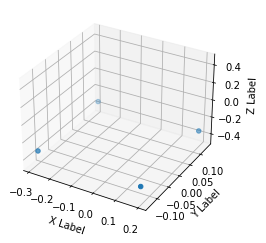

In [41]:
def visualize_absolute_foostep_sizes(dataset, footsteps, threshold=0.02):    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
                    
        # 3D positions
        xs = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
        ys = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
        zs = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()
        
        if idx > 0 and idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 1.0:
        
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 0.13))
                idx_height_check = absolute_val_array.argmin()

                fl_moving = np.abs(dataset[footstep, 9] - dataset[idx_height_check, 9])
                fr_moving = np.abs(dataset[footstep, 12] - dataset[idx_height_check, 12])
                rl_moving = np.abs(dataset[footstep, 15] - dataset[idx_height_check, 15])
                rr_moving = np.abs(dataset[footstep, 18] - dataset[idx_height_check, 18])
                
                print(f'\nFL before: {dataset[footstep, 9]}. FL after: {dataset[idx_height_check, 9]}')
                print(f'\nFR before: {dataset[footstep, 12]}. FR after: {dataset[idx_height_check, 12]}')
                print(f'\nRL before: {dataset[footstep, 15]}. RL after: {dataset[idx_height_check, 15]}')
                print(f'\nRR before: {dataset[footstep, 18]}. RR after: {dataset[idx_height_check, 18]}')

                print("Footstep timestamp: ", dataset[footstep, 0])
                print("Height check index: ", idx_height_check)
                print("Height check timestamp: ", dataset[idx_height_check, 0])

                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                print(f'\nFL moving: {fl_moving > threshold}. FR moving: {fr_moving > threshold}')
                print(f'RL moving: {rl_moving > threshold}. RR moving: {rr_moving > threshold}')

                assert (fr_moving > threshold) == (rl_moving > threshold)
                assert (rr_moving > threshold) == (fl_moving > threshold)
                assert (fr_moving > threshold) != (fl_moving > threshold)

                # Compute FR movement
                fl_movement_x = abs(abs(dataset[footstep, 7]) - abs(dataset[footsteps[idx+1], 7]))
                fl_movement_y = abs(abs(dataset[footstep, 8]) - abs(dataset[footsteps[idx+1], 8]))

                # Compute FL movement
                fr_movement_x = abs(abs(dataset[footstep, 10]) - abs(dataset[footsteps[idx+1], 10]))
                fr_movement_y = abs(abs(dataset[footstep, 11]) - abs(dataset[footsteps[idx+1], 11]))

                # Compute RR movement
                rl_movement_x = abs(abs(dataset[footstep, 13]) - abs(dataset[footsteps[idx+1], 13]))
                rl_movement_y = abs(abs(dataset[footstep, 14]) - abs(dataset[footsteps[idx+1], 14]))

                # Compute RL movement
                rr_movement_x = abs(abs(dataset[footstep, 16]) - abs(dataset[footsteps[idx+1], 16]))
                rr_movement_y = abs(abs(dataset[footstep, 17]) - abs(dataset[footsteps[idx+1], 17]))


                print(f'\nCoord FL: {[xs[0], ys[0], zs[0]]}. Coord FR: {[xs[1], ys[1], zs[1]]}. Coord RL: {[xs[2], ys[2], zs[2]]}. Coord RR: {[xs[3], ys[3], zs[3]]}')

                if fr_moving:
                    print(f'\nFR step_size x: {fr_movement_x + fl_movement_x}. FR step_size y: {fr_movement_y + fl_movement_y}. RL step_size x: {rl_movement_x + rr_movement_x}. RL step_size x: {rl_movement_y + rr_movement_y}.')
                elif fl_moving:
                    print(f'\nFL step_size x: {fr_movement_x + fl_movement_x}. FL step_size y: {fr_movement_y + fl_movement_y}. RR step_size x: {rl_movement_x + rr_movement_x}. RR step_size x: {rl_movement_y + rr_movement_y}.')
                else:
                    print("\nERROR")

visualize_absolute_foostep_sizes(motion_02_clock, footsteps_02_clock, threshold=0.02)

### Forward motion

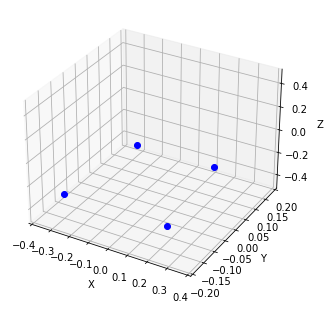

In [42]:
anim = visualize_animated_footsteps(motion_02_fwd, footsteps_02_fwd, "bo")
HTML(anim.to_html5_video())

### Backward motion

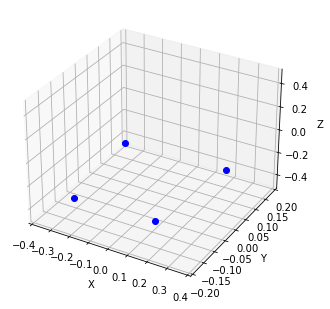

In [43]:
anim = visualize_animated_footsteps(motion_02_bwd, footsteps_02_bwd, "bo")
HTML(anim.to_html5_video())

### Side motion (right)

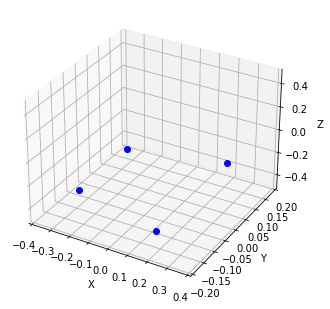

In [44]:
anim = visualize_animated_footsteps(motion_02_side_right, footsteps_02_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

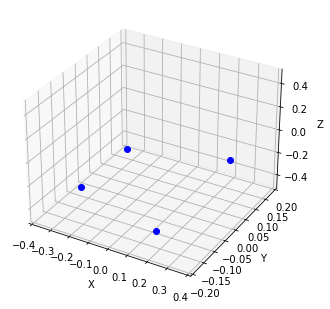

In [45]:
anim = visualize_animated_footsteps(motion_02_side_left, footsteps_02_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

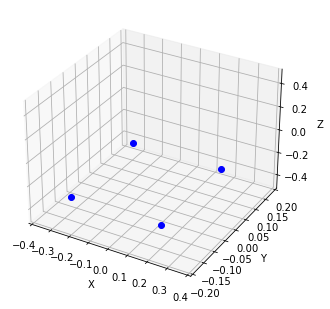

In [46]:
anim = visualize_animated_footsteps(motion_02_clock, footsteps_02_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

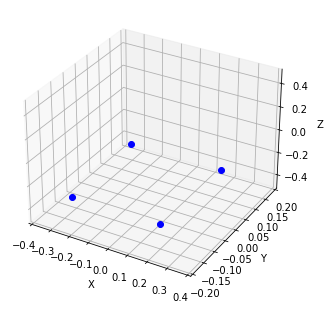

In [47]:
anim = visualize_animated_footsteps(motion_02_count, footsteps_02_count, "bo")
HTML(anim.to_html5_video())

# Multivariate Linear Regression (FR foot prediction)

The input will use initially only:

- **HighCmd: fwd, side, rot speeds**
- **HighState: fwd, side, rot speeds, footPosition2Body (FR)**

and as output we seek to predict the following:

- **footPosition2Body (FR)**

In [48]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [49]:
def plot_target_and_predictions(title: str, predictions, target):
    fig, ax1 = plt.subplots(1,1, figsize=(15,10))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(range(predictions.shape[0]), predictions, 'b-')
    ax1.set_ylabel('Predictions')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(range(predictions.shape[0]), target, 'g-')
    ax2.set_ylabel('Target', color='g')

    for tl in ax2.get_yticklabels():
        tl.set_color('g')
    
    fig.tight_layout()
    plt.show()

In [50]:
def create_timestamp_consistent_dataset(dataset, footsteps):
    # Footsteps sizes
    inputs = []
    labels = []
        
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 1.0:
                inputs.append(dataset[footsteps[idx-1], 1:7].tolist() + dataset[footsteps[idx-1], 7:19].tolist())
                labels.append(dataset[footsteps[idx], 7:19])
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_02_fwd_3D, Y_motion_02_fwd_3D = create_timestamp_consistent_dataset(motion_02_fwd, footsteps_02_fwd)
X_motion_02_bwd_3D, Y_motion_02_bwd_3D = create_timestamp_consistent_dataset(motion_02_bwd, footsteps_02_bwd)
X_motion_02_clock_3D, Y_motion_02_clock_3D = create_timestamp_consistent_dataset(motion_02_clock, footsteps_02_clock)
X_motion_02_count_3D, Y_motion_02_count_3D = create_timestamp_consistent_dataset(motion_02_count, footsteps_02_count)
X_motion_02_side_left_3D, Y_motion_02_side_left_3D = create_timestamp_consistent_dataset(motion_02_side_left, footsteps_02_side_left)
X_motion_02_side_right_3D, Y_motion_02_side_right_3D = create_timestamp_consistent_dataset(motion_02_side_right, footsteps_02_side_right)

# Stack datasets
X_motion_02_3D = np.concatenate((X_motion_02_fwd_3D, X_motion_02_bwd_3D, X_motion_02_side_right_3D, X_motion_02_side_left_3D, X_motion_02_clock_3D, X_motion_02_count_3D))
Y_motion_02_3D = np.concatenate((Y_motion_02_fwd_3D, Y_motion_02_bwd_3D, Y_motion_02_side_right_3D, Y_motion_02_side_left_3D, Y_motion_02_clock_3D, Y_motion_02_count_3D))

In [51]:
%store X_motion_02_3D
%store Y_motion_02_3D

Stored 'X_motion_02_3D' (ndarray)
Stored 'Y_motion_02_3D' (ndarray)


In [52]:
def create_timestamp_consistent_dataset_with_step_size_labels(dataset, footsteps, threshold=0.02):
    # Footsteps sizes
    inputs = []
    labels = []
            
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 1.0:
                
                # Find closest timestamp with gap of 0.12 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 0.12))
                idx_height_check = absolute_val_array.argmin()
                
                fl_moving = np.abs(dataset[footstep, 9] - dataset[idx_height_check, 9]) > threshold
                fr_moving = np.abs(dataset[footstep, 12] - dataset[idx_height_check, 12]) > threshold
                rl_moving = np.abs(dataset[footstep, 15] - dataset[idx_height_check, 15]) > threshold
                rr_moving = np.abs(dataset[footstep, 18] - dataset[idx_height_check, 18]) > threshold

                valid_1 = (fr_moving > threshold) == (rl_moving > threshold)
                valid_2 = (rr_moving > threshold) == (fl_moving > threshold)
                valid_3 = (fr_moving > threshold) != (fl_moving > threshold)

                if (not valid_1 or not valid_2 or not valid_3):
                    print("Skipping idx: ", idx, " as flags not valid")
                    continue
                
                # Compute FL movement
                fl_movement_x = abs(abs(dataset[footstep, 7]) - abs(dataset[footsteps[idx+1], 7]))
                fl_movement_y = abs(abs(dataset[footstep, 8]) - abs(dataset[footsteps[idx+1], 8]))

                # Compute FR movement
                fr_movement_x = abs(abs(dataset[footstep, 10]) - abs(dataset[footsteps[idx+1], 10]))
                fr_movement_y = abs(abs(dataset[footstep, 11]) - abs(dataset[footsteps[idx+1], 11]))

                # Compute RL movement
                rl_movement_x = abs(abs(dataset[footstep, 13]) - abs(dataset[footsteps[idx+1], 13]))
                rl_movement_y = abs(abs(dataset[footstep, 14]) - abs(dataset[footsteps[idx+1], 14]))

                # Compute RR movement
                rr_movement_x = abs(abs(dataset[footstep, 16]) - abs(dataset[footsteps[idx+1], 16]))
                rr_movement_y = abs(abs(dataset[footstep, 17]) - abs(dataset[footsteps[idx+1], 17]))
                
                # Compute new feet position w.r.t old centre of mass
                fl_x = dataset[footstep, 7] + (fr_movement_x + fl_movement_x)
                fl_y = dataset[footstep, 8] + (fr_movement_y + fl_movement_y)
                fr_x = dataset[footstep, 10] + (fr_movement_x + fl_movement_x)
                fr_y = dataset[footstep, 11] + (fr_movement_y + fl_movement_y)
                rl_x = dataset[footstep, 13] + (rr_movement_x + rl_movement_x)
                rl_y = dataset[footstep, 14] + (rr_movement_y + rl_movement_y)
                rr_x = dataset[footstep, 16] + (rr_movement_x + rl_movement_x)
                rr_y = dataset[footstep, 17] + (rr_movement_y + rl_movement_y)

                label = []

                if fr_moving:
                    label.append([dataset[footstep, 7], dataset[footstep, 8], fr_x, fr_y, rl_x, rl_y, dataset[footstep, 16], dataset[footstep, 17]])
                elif fl_moving:
                    label.append([fl_x, fl_y, dataset[footstep, 10], dataset[footstep, 11], dataset[footstep, 13], dataset[footstep, 14], rr_x, rr_y])
                else:
                    print("\nERROR")

                labels.append(label)
                inputs.append(dataset[footsteps[idx-1], 1:7].tolist() + dataset[footsteps[idx-1], 7:19].tolist())
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy.reshape(labels_numpy.shape[0], labels_numpy.shape[2])

X_motion_02_fwd_step, Y_motion_02_fwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_02_fwd, footsteps_02_fwd)
X_motion_02_bwd_step, Y_motion_02_bwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_02_bwd, footsteps_02_bwd)
X_motion_02_clock_step, Y_motion_02_clock_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_02_clock, footsteps_02_clock)
X_motion_02_count_step, Y_motion_02_count_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_02_count, footsteps_02_count)
X_motion_02_side_left_step, Y_motion_02_side_left_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_02_side_left, footsteps_02_side_left)
X_motion_02_side_right_step, Y_motion_02_side_right_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_02_side_right, footsteps_02_side_right)

# Stack datasets
X_motion_02_step = np.concatenate((X_motion_02_fwd_step, X_motion_02_bwd_step, X_motion_02_side_right_step, X_motion_02_side_left_step, X_motion_02_clock_step, X_motion_02_count_step))
Y_motion_02_step = np.concatenate((Y_motion_02_fwd_step, Y_motion_02_bwd_step, Y_motion_02_side_right_step, Y_motion_02_side_left_step, Y_motion_02_clock_step, Y_motion_02_count_step))

Skipping idx:  0  as flags not valid
Skipping idx:  1  as flags not valid


In [53]:
%store X_motion_02_step
%store Y_motion_02_step

Stored 'X_motion_02_step' (ndarray)
Stored 'Y_motion_02_step' (ndarray)


In [54]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} motion\n')
    
    # Find all positive movements in x and y for FR
    fr_steps_x = np.where(dataset[:, 0] > 0)[0]
    fr_steps_y = np.where(dataset[:, 1] > 0)[0]
    
    # Find all positive movements in x and y for FR
    fl_steps_x = np.where(dataset[:, 2] > 0)[0]
    fl_steps_y = np.where(dataset[:, 3] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rr_steps_x = np.where(dataset[:, 4] > 0)[0]
    rr_steps_y = np.where(dataset[:, 5] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rl_steps_x = np.where(dataset[:, 6] > 0)[0]
    rl_steps_y = np.where(dataset[:, 7] > 0)[0]
    
    # Compute stats for FR foot
    print(f'FR mean x step: {np.mean(dataset[fr_steps_x, 0])}. FR std x step: {np.std(dataset[fr_steps_x, 0])}. FR mean y step: {np.mean(dataset[fr_steps_y, 1])}. FR std y step: {np.std(dataset[fr_steps_y, 1])}')
 
    # Compute stats for FL foot
    print(f'FL mean x step: {np.mean(dataset[fl_steps_x, 2])}. FL std x step: {np.std(dataset[fl_steps_x, 2])}. FL mean y step: {np.mean(dataset[fl_steps_y, 3])}. FL std y step: {np.std(dataset[fl_steps_y, 3])}')
    
    # Compute stats for RR foot
    print(f'RR mean x step: {np.mean(dataset[rr_steps_x, 4])}. RR std x step: {np.std(dataset[rr_steps_x, 4])}. RR mean y step: {np.mean(dataset[rr_steps_y, 5])}. RR std y step: {np.std(dataset[rr_steps_y, 5])}')
    
    # Compute stats for RL foot
    print(f'RL mean x step: {np.mean(dataset[rl_steps_x, 6])}. RL std x step: {np.std(dataset[rl_steps_x, 6])}. RL mean y step: {np.mean(dataset[rl_steps_y, 7])}. RL std y step: {np.std(dataset[rl_steps_y, 7])}\n')
    
labels_stats(Y_motion_02_fwd_step, "forward")
labels_stats(Y_motion_02_bwd_step, "backward")
labels_stats(Y_motion_02_clock_step, "clockwise")
labels_stats(Y_motion_02_count_step, "counter clockwise")
labels_stats(Y_motion_02_side_left_step, "left step")
labels_stats(Y_motion_02_side_right_step, "right step")

Statistics for forward motion

FR mean x step: 0.24493888888888887. FR std x step: 0.029606336388026604. FR mean y step: 0.13828333333333337. FR std y step: 0.007161839459555382
FL mean x step: 0.24849444444444443. FL std x step: 0.032462542041597264. FL mean y step: nan. FL std y step: nan
RR mean x step: nan. RR std x step: nan. RR mean y step: 0.13890000000000002. RR std y step: 0.0008103497187428821
RL mean x step: nan. RL std x step: nan. RL mean y step: nan. RL std y step: nan

Statistics for backward motion

FR mean x step: 0.2627111111111111. FR std x step: 0.10788973223151337. FR mean y step: 0.1390666666666667. FR std y step: 0.007428623320942079
FL mean x step: 0.25915555555555553. FL std x step: 0.10278050086482694. FL mean y step: nan. FL std y step: nan
RR mean x step: nan. RR std x step: nan. RR mean y step: 0.13777222222222224. RR std y step: 0.0016153106187547128
RL mean x step: nan. RL std x step: nan. RL mean y step: nan. RL std y step: nan

Statistics for clockwise 

/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [55]:
def getCoMDataset(dataset, footsteps, threshold=0.02):
    # Footsteps sizes
    inputs = []
    labels = []
            
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 1.0:
                
                # Find closest timestamp with gap of 0.12 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 0.12))
                idx_height_check = absolute_val_array.argmin()
                
                fl_moving = np.abs(dataset[footstep, 9] - dataset[idx_height_check, 9]) > threshold
                fr_moving = np.abs(dataset[footstep, 12] - dataset[idx_height_check, 12]) > threshold
                rl_moving = np.abs(dataset[footstep, 15] - dataset[idx_height_check, 15]) > threshold
                rr_moving = np.abs(dataset[footstep, 18] - dataset[idx_height_check, 18]) > threshold

                valid_1 = (fr_moving > threshold) == (rl_moving > threshold)
                valid_2 = (rr_moving > threshold) == (fl_moving > threshold)
                valid_3 = (fr_moving > threshold) != (fl_moving > threshold)

                if (not valid_1 or not valid_2 or not valid_3):
                    print("Skipping idx: ", idx, " as flags not valid")
                    continue
                    
                # CoM absolute movement
                com_movement_x = None
                com_movement_y = None
                com_movement_theta = None
                
                # Compute CoM absolute movement
                if fr_moving:
                    com_movement_x = abs(abs(dataset[footstep, 7]) - abs(dataset[footsteps[idx+1], 7]))
                    com_movement_y = abs(abs(dataset[footstep, 8]) - abs(dataset[footsteps[idx+1], 8]))
                    com_movement_theta = np.arctan2(com_movement_y, com_movement_x) * 180 / np.pi
                elif fl_moving:
                    com_movement_x = abs(abs(dataset[footstep, 10]) - abs(dataset[footsteps[idx+1], 10]))
                    com_movement_y = abs(abs(dataset[footstep, 11]) - abs(dataset[footsteps[idx+1], 11]))
                    com_movement_theta = np.arctan2(com_movement_y, com_movement_x) * 180 / np.pi
                else:
                    print("\nERROR")

                labels.append([com_movement_x, com_movement_y, com_movement_theta])
                inputs.append(dataset[footsteps[idx-1], 1:7].tolist() + dataset[footsteps[idx-1], 7:19].tolist())
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_02_fwd_CoM_step, Y_motion_02_fwd_CoM_step = getCoMDataset(motion_02_fwd, footsteps_02_fwd)
X_motion_02_bwd_CoM_step, Y_motion_02_bwd_CoM_step = getCoMDataset(motion_02_bwd, footsteps_02_bwd)
X_motion_02_clock_CoM_step, Y_motion_02_clock_CoM_step = getCoMDataset(motion_02_clock, footsteps_02_clock)
X_motion_02_count_CoM_step, Y_motion_02_count_CoM_step = getCoMDataset(motion_02_count, footsteps_02_count)
X_motion_02_side_left_CoM_step, Y_motion_02_side_left_CoM_step = getCoMDataset(motion_02_side_left, footsteps_02_side_left)
X_motion_02_side_right_CoM_step, Y_motion_02_side_right_CoM_step = getCoMDataset(motion_02_side_right, footsteps_02_side_right)

# Stack datasets
X_motion_02_CoM_step = np.concatenate((X_motion_02_fwd_CoM_step, X_motion_02_bwd_CoM_step, X_motion_02_side_right_CoM_step, X_motion_02_side_left_CoM_step, X_motion_02_clock_CoM_step, X_motion_02_count_CoM_step))
Y_motion_02_CoM_step = np.concatenate((Y_motion_02_fwd_CoM_step, Y_motion_02_bwd_CoM_step, Y_motion_02_side_right_CoM_step, Y_motion_02_side_left_CoM_step, Y_motion_02_clock_CoM_step, Y_motion_02_count_CoM_step))

Skipping idx:  0  as flags not valid
Skipping idx:  1  as flags not valid


In [56]:
%store X_motion_02_CoM_step
%store Y_motion_02_CoM_step

Stored 'X_motion_02_CoM_step' (ndarray)
Stored 'Y_motion_02_CoM_step' (ndarray)


In [60]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} CoM motion')
    
    # Compute stats for FR foot
    print(f'CoM mean x step: {round(np.mean(dataset[:, 0]), 3)}. CoM mean y step: {round(np.mean(dataset[:, 1]), 3)}. CoM std x step: {round(np.std(dataset[:, 0]), 3)}. CoM std y step: {round(np.std(dataset[:, 1]), 3)}.\n')

labels_stats(Y_motion_02_fwd_CoM_step, "forward")
labels_stats(Y_motion_02_bwd_CoM_step, "backward")
labels_stats(Y_motion_02_clock_CoM_step, "clockwise")
labels_stats(Y_motion_02_count_CoM_step, "counter clockwise")
labels_stats(Y_motion_02_side_left_CoM_step, "left step")
labels_stats(Y_motion_02_side_right_CoM_step, "right step")

Statistics for forward CoM motion
CoM mean x step: 0.061. CoM mean y step: 0.004. CoM std x step: 0.008. CoM std y step: 0.002.

Statistics for backward CoM motion
CoM mean x step: 0.07. CoM mean y step: 0.005. CoM std x step: 0.009. CoM std y step: 0.001.

Statistics for clockwise CoM motion
CoM mean x step: 0.009. CoM mean y step: 0.012. CoM std x step: 0.005. CoM std y step: 0.003.

Statistics for counter clockwise CoM motion
CoM mean x step: 0.008. CoM mean y step: 0.014. CoM std x step: 0.004. CoM std y step: 0.005.

Statistics for left step CoM motion
CoM mean x step: 0.007. CoM mean y step: 0.07. CoM std x step: 0.006. CoM std y step: 0.014.

Statistics for right step CoM motion
CoM mean x step: 0.005. CoM mean y step: 0.071. CoM std x step: 0.003. CoM std y step: 0.007.



In [63]:
print(f'Rotation in rad for clockwise {np.arctan(np.mean(Y_motion_02_clock_CoM_step[:, 1]) / -np.mean(Y_motion_02_clock_CoM_step[:, 0]))}')
print(f'Rotation in angles for clockwise {np.arctan(np.mean(Y_motion_02_clock_CoM_step[:, 1]) / -np.mean(Y_motion_02_clock_CoM_step[:, 0])) * 180 / np.pi}')

Rotation in rad for clockwise -0.912581869847675
Rotation in angles for clockwise -52.28708960242877


In [64]:
print(f'Rotation in rad for count {np.arctan(np.mean(Y_motion_02_clock_CoM_step[:, 1]) / np.mean(Y_motion_02_clock_CoM_step[:, 0]))}')
print(f'Rotation in angles for count {np.arctan(np.mean(Y_motion_02_clock_CoM_step[:, 1]) / np.mean(Y_motion_02_clock_CoM_step[:, 0])) * 180 / np.pi}')

Rotation in rad for count 0.912581869847675
Rotation in angles for count 52.28708960242877
